In [1]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from pprint import pprint
import time, os, json
from scipy.ndimage import convolve1d
from scipy.signal import convolve2d

import inputools.Trajectory as it
from tools.evolutions import load_best_individual

import os
os.chdir("..")
import src.models as mm
from src.models import logger
import src.visualizations as vis
import src.utils as utils

from tools.utils import clf, tqdm_enumerate, save_image

%load_ext autoreload
%autoreload 2

plt.style.use('classic')
logger()

2024-06-06 13:32:16 | 


PatternedInput:
- non-binary input $<0.4$ is too weak to elicit sufficient strengthening

## Input space
---
Study the space spanned by 3 Gaussian tuned cells and a downstream weighted output

In [239]:
pcs = np.array([[0.25, 0.25], [0.75, 0.25], [0.5, 0.75]])
gauss = lambda x, tu, s: np.exp(-np.linalg.norm(
    x.reshape(-1, 2) - tu.reshape(-1, 1, 2), axis=2)**2 / s)
pcs_x = lambda x, w: gauss(x, pcs, 0.04) * w

space_box = it.make_whole_walk(dx=0.01)
space_pc = pcs_x(space_box, 1)
space_box.shape

(10201, 2)

In [262]:
space_box.shape

(10201, 2)

In [270]:
np.linalg.norm(space_pc.T, axis=1, keepdims=False).reshape(-1, 1)

array([[0.04393693],
       [0.04966276],
       [0.05585479],
       ...,
       [0.00066051],
       [0.00051828],
       [0.00040465]])

In [296]:
inputs_pc[:, 0].shape

(8000,)

In [294]:
model.Wff.shape

(20, 25)

In [357]:
k = 8 * 19
print(space_pc[:, k:k+10], '\n')
print(np.exp(-(space_pc[:, k:k+10] - np.array([0.4, 0.05]).reshape(2, 1))**2))

[[0.63762815 0.60653066 0.52204578 0.40656966 0.2865048  0.18268352
  0.10539922 0.05502322 0.02599113 0.011109  ]
 [0.0042963  0.011109   0.02599113 0.05502322 0.10539922 0.18268352
  0.2865048  0.40656966 0.52204578 0.60653066]] 

[[0.94509754 0.95824201 0.98521521 0.99995684 0.98720145 0.95387137
  0.91686997 0.88779983 0.86946027 0.85964462]
 [0.99791335 0.99848863 0.99942374 0.99997477 0.99693563 0.98254914
  0.94560105 0.88060869 0.80025311 0.73364767]]


In [272]:
((space_pc.T @ w) / (np.linalg.norm(space_pc.T, axis=1, keepdims=False).reshape(-1, 1) * np.linalg.norm(w.T, axis=1, keepdims=False).reshape(-1, 1))).shape

(10201, 1)

#### Simulation

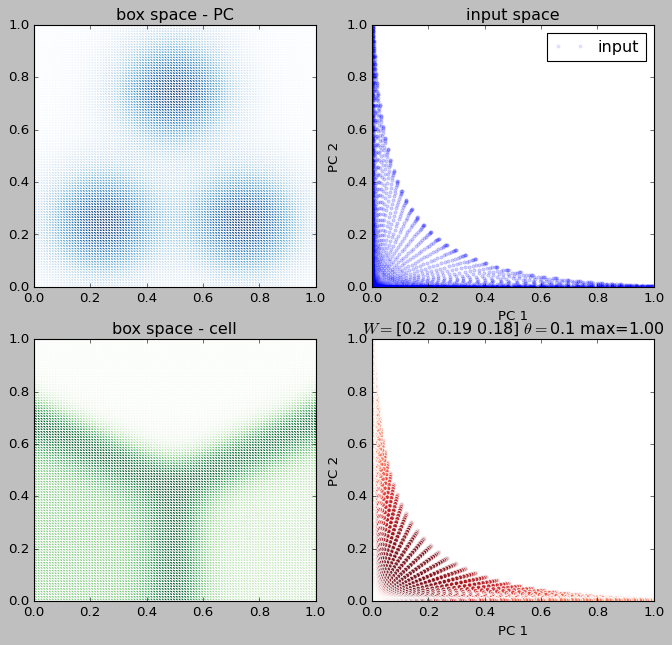

In [283]:
w = np.array([[0.2], [0.19], [0.18]])
thr = 0.1
#cell_x = lambda x, thr: 1 / (1 + np.exp(-10*(x.sum(axis=0)-thr)))
#cell_x = lambda x, thr: 1 / (1 + np.exp(-6*(x.sum(axis=0)-thr)))
cell_x = lambda x, thr: 1 / (1 + np.exp(-10*(x-thr)))
#cell_x = lambda x, thr: 1*(x.sum(axis=0)>thr)
cosim = lambda v, w: (space_pc.T @ w) / (np.linalg.norm(space_pc.T, axis=1, keepdims=False).reshape(-1, 1) * np.linalg.norm(w.T, axis=1, keepdims=False).reshape(-1, 1))

ds1 = space_pc.sum(axis=0)

space_pc_w = pcs_x(space_box, w)
#activation = cell_x(space_pc_w.sum(axis=0), thr)
activation = cell_x(np.exp(-np.linalg.norm(
    space_pc.reshape(-1, 3) - w.reshape(-1, 1, 3), axis=2) / 0.01).sum(axis=0),
                    thr)
activation = cell_x(cosim(space_pc, w),
                      thr)
#activation = cell_x(np.exp(-(space_pc - w)**2).prod(axis=0), thr)
#activation = cell_x(space_pc.T @ w, thr)

#activation[0] = 0.15

_, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(10, 9))

#
ax1.scatter(space_box[:, 0], space_box[:, 1], 
            c=space_pc.sum(axis=0), 
            cmap="Blues", edgecolors='white')

ax1.set_title("box space - PC")
ax1.set_xlim((0, 1))
ax1.set_ylim((0, 1))

#
ax2.plot(space_pc[0], space_pc[1], '.b', alpha=0.1, label='input')
ax2.set_title("input space")
ax2.set_xlim((0, 1))
ax2.set_ylim((0, 1))
ax2.set_xlabel("PC 1")
ax2.set_ylabel("PC 2")
ax2.legend(loc="upper right")

#
ax3.scatter(space_box[:, 0], space_box[:, 1], c=activation, 
            cmap="Greens", edgecolors='white')
#ax3.plot(activation[0], activation[1])
ax3.set_title("box space - cell")
ax3.set_xlim((0, 1))
ax3.set_ylim((0, 1))

#
#ax4.plot(activation[0], activation[1], '.r', alpha=0.01, label=f"w={w.flatten()}")
#ax4.plot(space_pc_w[0], space_pc_w[1], '.r', alpha=0.01, label=f"w={w.flatten()}")
#ax4.scatter(space_pc_w[0], space_pc_w[1], c=activation.flatten(), 
#            cmap='Greens', edgecolors='white', alpha=1.)
ax4.scatter(space_pc[0], space_pc[1], c=activation, 
            cmap='Reds', edgecolors='white', alpha=0.8)
ax4.set_title(f"$W=${w.flatten()} $\\theta=${thr} max={activation.max():.2f}")
ax4.set_xlim((0, 1))
ax4.set_ylim((0, 1))
ax4.set_xlabel("PC 1")
ax4.set_ylabel("PC 2")
#ax4.legend(loc="upper right")

plt.show()

In [244]:
activation_y.shape

(10201, 10201)

## Hebbian
---
*closeup on simple learning*

In [577]:
class Node:
    def __init__(self, Nj=3, lr=1e-2, u=0., noise=None):
        self.Nj = Nj
        self.w = np.zeros((1, Nj))
        self.lr = lr
        self.u = u
        self.a = 0.
        if not noise:
            self.noise = lambda: 0 
        else:
            self.noise = noise 
    
    def __call__(self, x, update=True, isnoise=True):
        self.u = self.w @ x + self.noise() * int(isnoise)
        self.a = 1 / (1 + np.exp(-20*(self.u - 1)))
        if update:
            self.w += self.lr * (self.a @ x.T - 0.3*self.w @ (x*x.T))

    def plotw(self, t, tper=10):
        if t % tper == 0:
            clf()
            plt.plot(range(self.Nj), self.w.flatten())
            plt.title(f"{t=} - {np.around(self.w.flatten(), 2)}")
            plt.ylim((0, 3))
            plt.grid()
            plt.pause(0.01)

def sample_is(model):
    """ visualized the model response in the input space """
    I = it.make_whole_walk(dx=0.01)
    A = np.zeros(len(I))
    for j, x in enumerate(I):
        model(x=x.reshape(-1, 1), update=False, isnoise=False)
        A[j] = model.a.item()

    plt.scatter(I[:, 0], I[:, 1], 
            c=A, cmap="Blues", edgecolors='white')
    plt.xlim((0, 1))
    plt.ylim((0, 1))
    plt.show()

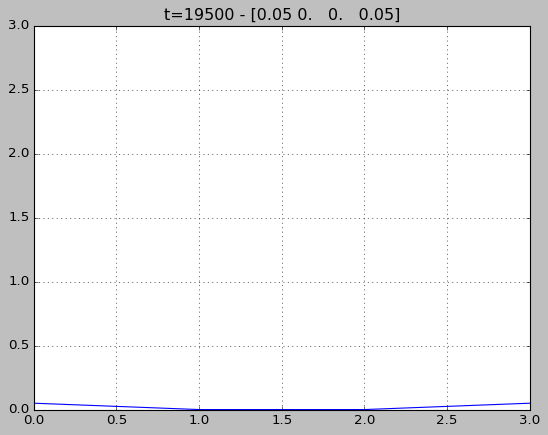

2024-01-16 17:33:37 | 


In [578]:
Nj = 4
T = 20*1000
I = np.zeros((Nj, T))
I[0] = 1
I[Nj-1] = 1.

node = Node(Nj=Nj, lr=0.01, u=0.01, noise=lambda: np.random.binomial(1, 0.05))

for t in range(T):
    node(x=I[:, t].reshape(-1, 1))
    node.plotw(t=t, tper=500)
        

logger()

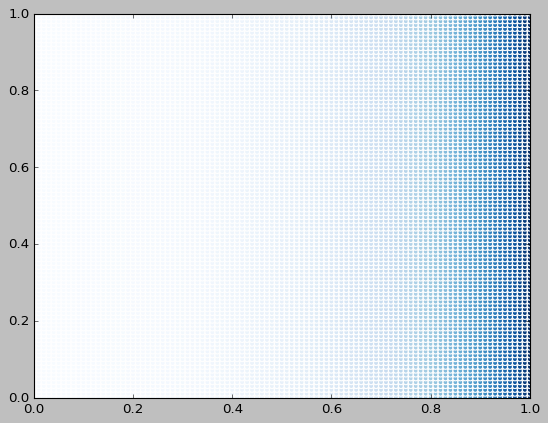

In [571]:
sample_is(node)

## Input II 
---
*patterned input*

#### Data

##### Load genome

In [135]:
record = load_best_individual()
genome = record['genome']
pprint(record)

genome['lr'] = 0.3
genome['wff_max'] = 2.
genome['tau'] = 300

2024-01-23 13:22:50 | Available files in /Users/daniekru/Research/lab/PCNN/cache:
2024-01-23 13:22:50 | 0: best_16_pcnn_d.json
2024-01-23 13:22:50 | 1: best_24_pcnn_d.json
2024-01-23 13:22:50 | 2: top_2311.json
2024-01-23 13:22:50 | 3: best_14_pcnn.json
2024-01-23 13:22:50 | 4: best_20.json
2024-01-23 13:22:50 | 5: best_44_pcnn_e.json
2024-01-23 13:22:50 | 6: best_12_pcnn.json
2024-01-23 13:22:50 | 7: best_34_pcnn_d.json
2024-01-23 13:22:50 | 8: best_28_pcnn_d.json
2024-01-23 13:22:50 | 9: best_46_pcnn_f.json
2024-01-23 13:22:50 | 10: best_41_pcnn_e.json
2024-01-23 13:22:50 | 11: top_2238.json
2024-01-23 13:22:50 | 12: best_21_pcnn_d.json
2024-01-23 13:22:50 | 13: best_38_pcnn_e.json
2024-01-23 13:22:50 | 14: best_29_pcnn_ptt.json
2024-01-23 13:22:50 | 15: best_8.json
2024-01-23 13:22:50 | 16: best_22_pcnn_d.json
2024-01-23 13:22:50 | 17: best_15_pcnn.json
2024-01-23 13:22:50 | 18: best_30_pcnn_ptt.json
2024-01-23 13:22:50 | 19: best_42_pcnn_e.json
2024-01-23 13:22:50 | 20: best_10.jso

Select a file index:  9


2024-01-23 13:23:00 | loaded `best_46_pcnn_f.json` from `/Users/daniekru/Research/lab/PCNN/cache`


{'genome': {'DA_tau': 3,
            'IS_magnitude': 20,
            'N': 5,
            'Nj': 5,
            'bias': 1.1,
            'bias_decay': 100,
            'bias_scale': 0.0,
            'gain': 10.0,
            'is_retuning': False,
            'lr': 0.93254,
            'nb_per_cycle': 7,
            'nb_skip': 2,
            'plastic': True,
            'soft_beta': 47,
            'tau': 4,
            'theta_freq': 0.004,
            'theta_freq_increase': 0.16,
            'wff_max': 2.0,
            'wff_min': 0.0,
            'wff_tau': 1000},
 'info': {'data': {'dt': 0.01,
                   'duration': 10,
                   'k_average': 200,
                   'prob_turn': 0.001,
                   'sigma': 0.001,
                   'speed': [0.01, 0.01]},
          'date': '23/01/2024 at 13:04',
          'evolved': ['lr', 'tau', 'soft_beta', 'theta_freq', 'nb_per_cycle'],
          'game': 'Env(fitness_size=2, n_samples=2)',
          'model': 'PCNNetwork'}}


Data inspection

In [98]:
inputs = it.make_patterned_input(N=5, T=30, Np=3, cycles=1, binary=False, size=2, seed=1, max_value=0.3)
inputs.max()

0.3

#### Simulation

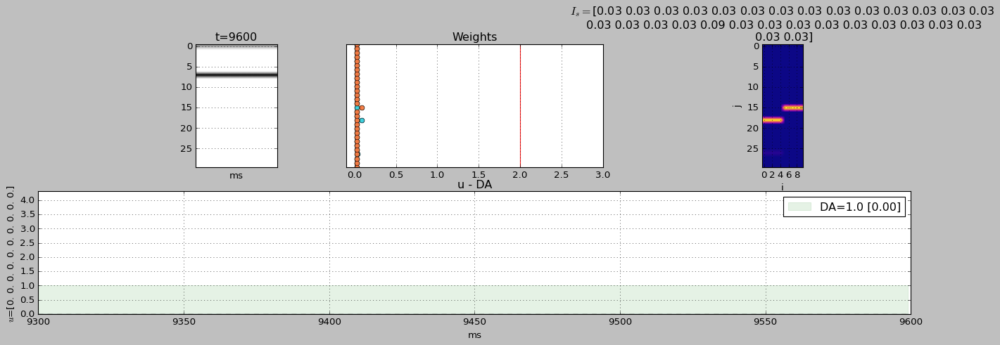

2024-01-26 12:17:05 | 


In [56]:
seed = None

genome = {
          'gain': 10.0,
          'bias': 1.1,
          'lr': 0.4,
          'tau': 700,
          'wff_std': 0.0,
          'wff_min': 0.0,
          'wff_max': 2.,
          'wff_tau': 1_000,
          'soft_beta': 20,
          'dt': 1,
          'N': 5,
          'Nj': 5,
          'DA_tau': 3,
          'bias_scale': 0.0,
          'bias_decay': 100,
          'IS_magnitude': 20,
          'theta_freq': 0.003,
          'nb_per_cycle': 5,
          'plastic': True,
          'nb_skip': 2,
          'seed': seed,
}

""" Initialization """

N, Nj = 10, 30

genome['N'] = N
genome['Nj'] = Nj
model = mm.PCNNetwork(**genome)

# select
inputs = it.make_patterned_input(N=Nj, T=5*2000, Np=5, cycles=1, binary=False, 
                                 max_value=0.4, size=2, seed=seed)

""" Run """

record = np.zeros((N+1, len(inputs)))
Ix = np.zeros((N, len(inputs)))
X2 = np.zeros((len(inputs) + 10, Nj))
colors = [plt.cm.rainbow(i/N) for i in range(N)]

for t, x in enumerate(inputs):
  
    model.step(x=x.reshape(-1, 1))
    record[1:, t] = model.u.flatten()
    record[0, t] = model.DA
    Ix[:, t] = model.Is.flatten() / 8
    
    X2[10:t+10] = inputs[:t]

    if t % 400 == 0:
        #vis.plotting(model=model, X=X2, t=t, record=record, Ix=Ix, colors=colors, subtitle_2=f"$I_s$={np.around(model.Ix.flatten(), 2)}")   
        vis.plotting(model=model, X=X2, t=t, record=record, Ix=Ix, colors=colors, subtitle_2=f"$I_s=${np.around(model.var1[0].flatten(), 2)}")            
    
logger()

## Input III 
---
*inspect 2D trajectory*


In [5]:
def plot_activation(activation):

    size, N = activation.shape
    sqrtsize = int(np.sqrt(size))

    _, axs = plt.subplots(int(np.sqrt(N)), int(np.sqrt(N)), figsize=(5, 5))
    i = 0
    for row in axs:
        for ax in row:
            ax.imshow(np.flip(activation[:, i].reshape(sqrtsize, sqrtsize), axis=0), cmap='plasma')
            ax.axis('off')
            i += 1
    plt.show()

# setting
duration = 8
speed = 1
dt = 1e-4

# input
trajectory = it.make_trajectory(duration=duration, dt=dt, speed=[speed, speed], 
                                  prob_turn=0.005, k_average=200)[200:]

layer = it.PlaceLayer(N=9, sigma=0.01)
A = layer.parse_trajectory(trajectory=trajectory)
#plot_activation(A)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7800/7800 [00:00<00:00, 123090.36it/s]


#### *Static plot*

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [00:00<00:00, 115782.79it/s]


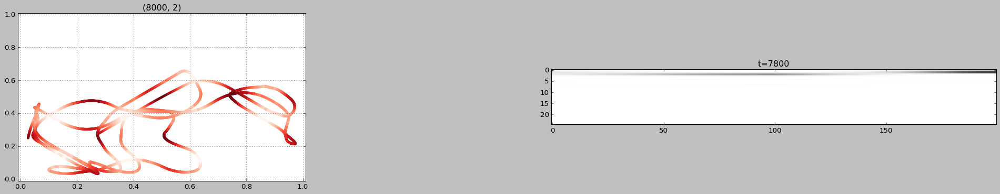

In [6]:
# input
duration = 8
speed = 1
dt = 1e-4
trajectory = it.make_trajectory(duration=duration, dt=dt, speed=[speed, speed], 
                                  prob_turn=0.005, k_average=200, dim=2)

#layer = it.HDLayer(N=5**2, sigma=0.01)
layer = it.PlaceLayer(N=5**2, sigma=0.01)

A = layer.parse_trajectory(trajectory=trajectory)

plt.figure(figsize=(30, 5))
z = np.zeros(len(A))
for i in range(len(A[0])):
    z += np.where(A[:, i] > 0.1, A[:, i], 0)

plt.subplot(131)
plt.scatter(trajectory[:, 0], trajectory[:, 1], c=z, s=20, cmap='Reds',
           edgecolors='black', linewidths=0)
plt.ylim((-0.01, 1.01))
plt.xlim((-0.01, 1.01))
plt.grid()
plt.title(trajectory.shape)

plt.subplot(122)
for t in range(0, len(A)-100, 100):
    plt.imshow(A[t:t+200, :].T, cmap='Greys')
    plt.title(f"{t=}")
    
plt.show()

#### *Online plot*

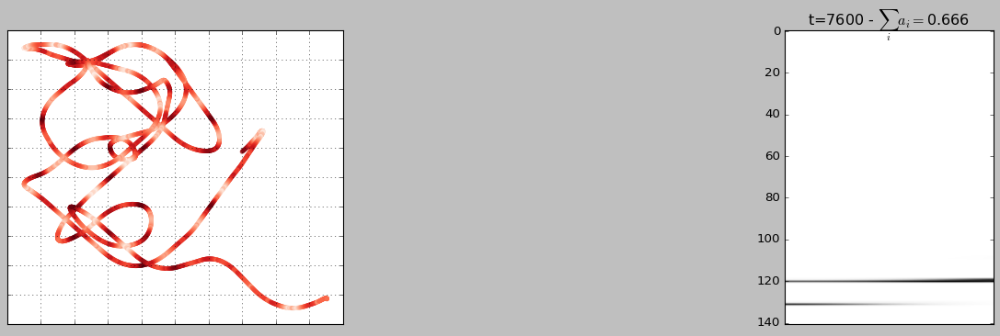

2024-02-17 19:16:55 | 


In [11]:
# settings
duration = 8
speed = 1e-2
dt = 1e-2

# make trajectory
trajectory = it.make_trajectory(duration=duration, dt=dt, speed=[speed, speed], 
                                  prob_turn=0.005, k_average=200)[200:]

# make activations
layer = it.InputNetwork(layers=[it.BorderLayer(N=5*4, sigma=0.001), 
                                it.PlaceLayer(N=11**2, sigma=0.01)])

A = layer.parse_trajectory(trajectory=trajectory)
z = np.zeros(A.shape[0])
for i in range(A.shape[1]):
    z += np.where(A[:, i] > 0.1, A[:, i], 0)
    
# plot
for t in range(0, len(A)-100, 100):
    clf()
    plt.figure(figsize=(20, 5))
    plt.subplot(131)
    plt.scatter(trajectory[:t, 0], trajectory[:t, 1], c=z[:t], s=20, cmap='Reds',
                edgecolors='black', linewidths=0, marker='o', alpha=0.5)
    plt.xlim((0, 1))
    plt.ylim((0, 1))
    plt.xticks(np.arange(0, 1, 0.1), ())
    plt.yticks(np.arange(0, 1, 0.1), ())
    plt.grid()
    
    plt.subplot(122)
    plt.imshow(A[t:t+100, :].T, cmap='Greys')
    plt.title(f"{t=} - $\sum_i a_i=${z[t]:.3f}")
    plt.xticks(())
    plt.pause(0.1)

logger()

## Trajectory
---

### 1D - simulation

In [ ]:
genome = {'gain': 10.0,
          'bias': 0.7,
          'lr': 0.8,
          'tau': 10,
          'wff_min': 0.0,
          'wff_max': 2.0,
          'wff_tau': 1000,
          'soft_beta': 4,
          'DA_tau': 3,
          'bias_decay': 100,
          'bias_scale': 0.0,
          'IS_magnitude': 20,
          'is_retuning': False,
          'theta_freq': 0.021,
          'theta_freq_increase': 0.16,
          'sigma_gamma': 9.6e-05,
          'nb_per_cycle': 5,
          'nb_skip': 2,
          'N': 20,
          'Nj': 36,
          'plastic': True
         }

2024-01-19 15:35:06 | Layer(N=10, kind=hd)
2024-01-19 15:35:06 | Duration: 10.000s, dt: 1.0ms, speed: 1au/s, distance: 10.000au
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:00<00:00, 61687.56it/s]
2024-01-19 15:35:06 | inputs_hd.shape=(10000, 10)
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:00<00:00, 11388.42it/s]


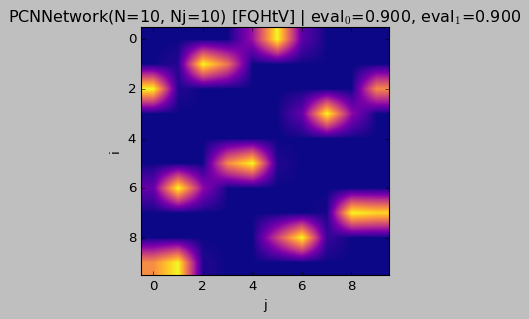

In [207]:
""" Initialization """

# model
N, Nj = 10, 10
genome['N'] = N
genome['Nj'] = Nj

model = mm.PCNNetwork(**genome)

# input
layer_hd = it.HDLayer(N=Nj, sigma=0.01)
logger(layer_hd)
duration = 10
speed = 1
dt = 1e-3
inputs_hd = it.make_layer_trajectory(layer=layer_hd, duration=duration, dt=dt, speed=speed, verbose=True)
logger(f"{inputs_hd.shape=}")

""" Run """
record = np.empty((N, len(inputs_hd)))

for t, x in tqdm_enumerate(inputs_hd):
    model.step(x=x.reshape(-1, 1))
    record[:, t] = model.u.flatten()

""" Plots """
plt.figure(figsize=(4, 4))
plt.imshow(model.Wff, cmap='plasma')
plt.title(f"{model} | eval$_0$={mm.eval_func(weights=model.Wff, wmax=model._wff_max, ignore_zero=False, axis=0):.3f}, "\
          f"eval$_1$={mm.eval_func(weights=model.Wff, wmax=model._wff_max, ignore_zero=False, axis=1):.3f}")
plt.xlabel('j')
plt.ylabel('i')
plt.show()

2024-01-19 15:35:11 | Duration: 6.283s, dt: 100.0ms, speed: 1au/s, distance: 6.283au
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:00<00:00, 56245.46it/s]


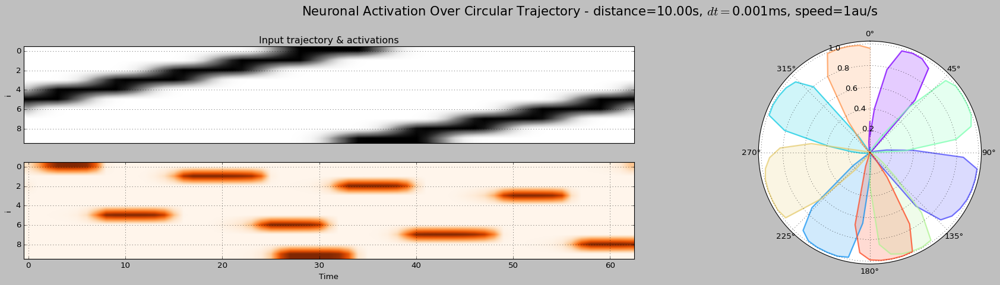

In [208]:
""" Initialization """
inputs_hd = it.make_layer_trajectory(layer=layer_hd, duration=2*np.pi, dt=0.1, speed=1, verbose=True)

""" Run """
record = np.empty((genome['N'], len(inputs_hd)))

for t, x in enumerate(inputs_hd):
    model.step(x=x.reshape(-1, 1))
    record[:, t] = model.u.flatten()

""" Plots """
fig = plt.figure(figsize=(25, 6))

# First subplot: Regular plot
ax1 = plt.subplot(2, 2, 1)
#ax1.imshow(X.T, cmap='Greys')
ax1.imshow(inputs_hd.T, cmap='Greys')

ax1.set_title("Input trajectory & activations")
ax1.set_ylabel('i')
ax1.set_xticks(())
plt.grid()

ax2 = plt.subplot(2, 2, 3)
ax2.imshow(record, cmap='Oranges')
ax2.set_xlabel('Time')
ax2.set_ylabel('i')
plt.grid()

# Second subplot: Polar plot
ax3 = plt.subplot(122, polar=True)  
theta = np.linspace(0, 2 * np.pi, len(inputs_hd))  
colors = [plt.cm.rainbow(i/N) for i in range(N)]

for i in range(N):
    activation = record[i]
    ax3.plot(theta, activation, alpha=0.75, lw=2, color=colors[i])
    ax3.fill_between(theta, 0, activation, alpha=0.2, color=colors[i])  # Fill the area

ax3.set_theta_zero_location('N')  # Set 0 degrees at the top
ax3.set_theta_direction(-1)  # Clockwise
ax3.set_rlabel_position(-22.5)  # Position of radial labels
ax3.set_rlim((0, 1.025))

plt.suptitle(f"Neuronal Activation Over Circular Trajectory - distance={duration*speed:.2f}s, $dt=${dt}ms, speed={speed}au/s", fontsize=19)
plt.tight_layout()
plt.show()

### 2D - simulation

##### Genome

In [26]:
record_ind = load_best_individual()
genome = record_ind['genome']
pprint(record_ind)

record_ind['info']['data']

2024-02-17 19:28:20 | Available files in /Users/daniekru/Research/lab/PCNN/cache:
2024-02-17 19:28:20 | 0: 5_best_pcnn_bpc.json
2024-02-17 19:28:20 | 1: 8_best_pcnn_bpc.json
2024-02-17 19:28:20 | 2: 6_best_pcnn_bpc.json
2024-02-17 19:28:20 | 3: 3_best_pcnn_bpc.json
2024-02-17 19:28:20 | 4: 10_best_pcnn_bpc.json
2024-02-17 19:28:20 | 5: 2_best_pcnn_bpc.json
2024-02-17 19:28:20 | 6: 11_best_pcnn_bpc.json
2024-02-17 19:28:20 | 7: 7_best_pcnn_bpc.json
2024-02-17 19:28:20 | 8: 4_best_pcnn_bpc.json
2024-02-17 19:28:20 | 9: 9_best_pcnn_bpc.json


Select a file index:  6


2024-02-17 19:28:22 | loaded `11_best_pcnn_bpc.json` from `/Users/daniekru/Research/lab/PCNN/cache`


{'genome': {'DA_tau': 0.9,
            'IS_magnitude': 20,
            'N': 5,
            'Nj': 5,
            'beta_clone': 0.3,
            'bias': 0.8,
            'bias_decay': 120,
            'bias_scale': 0.84,
            'dt': 0.20600000000000002,
            'gain': 5.0,
            'is_retuning': False,
            'low_bounds_nb': 5,
            'lr': 0.99,
            'nb_per_cycle': 5,
            'nb_skip': 2,
            'plastic': True,
            'sigma_bc': 0.005,
            'sigma_gamma': 9.1e-05,
            'sigma_pc': 0.00251,
            'soft_beta': 1.7,
            'speed': 0.091,
            'tau': 157,
            'theta_freq': 0.007,
            'theta_freq_increase': 0.16,
            'wff_max': 2.0,
            'wff_min': 0.0,
            'wff_tau': 950},
 'info': {'data': {'Nbc': 40,
                   'Npc': 100,
                   'dt': 0.1,
                   'duration': 5,
                   'k_average': 300,
                   'layer': 'InputNetw

{'duration': 5,
 'dt': 0.1,
 'speed': [0.01, 0.05],
 'prob_turn': 0.002,
 'k_average': 300,
 'sigma_pc': 0.005,
 'sigma_bc': 0.001,
 'Npc': 100,
 'Nbc': 40,
 'layer': 'InputNetwork(N=100, layers=`place`)'}

In [9]:
genome = {
          'gain': 5.0,
          'bias': 0.9,
          'lr': 0.8,
          'tau': 40,
          'wff_std': 0.0,
          'wff_min': 0.0,
          'wff_max': 2.,
          'wff_tau': 500,
          'soft_beta': 0.2,
          'dt': 1,
          'N': 5,
          'Nj': 5,
          'DA_tau': 3,
          'bias_scale': 0.0,
          'bias_decay': 100,
          'IS_magnitude': 20,
          'theta_freq': 0.005,
          'nb_per_cycle': 5,
          'plastic': True,
          'nb_skip': 2,
          'seed': 1337,
}

{'gain': 5.1,
 'bias': 0.7,
 'lr': 0.75069,
 'tau': 4,
 'wff_min': 0.0,
 'wff_max': 1.4,
 'wff_tau': 1400,
 'soft_beta': 1.3,
 'beta_clone': 0.5,
 'low_bounds_nb': 5,
 'DA_tau': 77,
 'bias_decay': 77,
 'bias_scale': 0.83,
 'IS_magnitude': 3.3,
 'is_retuning': False,
 'theta_freq': 0.007,
 'theta_freq_increase': 0.16,
 'sigma_gamma': 9.6e-05,
 'nb_per_cycle': 5,
 'nb_skip': 2,
 'N': 20,
 'Nj': 41,
 'plastic': True}

##### Settings

In [4]:
""" from record """
duration = record_ind['info']['data']['duration']
dt = record_ind['info']['data']['dt']
speed = record_ind['info']['data']['speed']
prob_turn = record_ind['info']['data']['prob_turn']
sigma = record_ind['info']['data']['sigma']
k_average = record_ind['info']['data']['k_average']

KeyError: 'sigma'

In [18]:
""" new """
duration = 10  # s
dt = 1e-1 # s
speed = 1e-1  # au/s
sigma = 0.005
prob_turn = 1e-3
k_average = 400

In [27]:
""" settings from genome """
pprint(genome)

duration = 10  # s
dt = genome['dt'] # ms
speed = genome['speed']  # au/s
sigma = genome['sigma_pc']
prob_turn = 1e-3
k_average = 400

{'DA_tau': 0.9,
 'IS_magnitude': 20,
 'N': 5,
 'Nj': 5,
 'beta_clone': 0.3,
 'bias': 0.8,
 'bias_decay': 120,
 'bias_scale': 0.84,
 'dt': 0.20600000000000002,
 'gain': 5.0,
 'is_retuning': False,
 'low_bounds_nb': 5,
 'lr': 0.99,
 'nb_per_cycle': 5,
 'nb_skip': 2,
 'plastic': True,
 'sigma_bc': 0.005,
 'sigma_gamma': 9.1e-05,
 'sigma_pc': 0.00251,
 'soft_beta': 1.7,
 'speed': 0.091,
 'tau': 157,
 'theta_freq': 0.007,
 'theta_freq_increase': 0.16,
 'wff_max': 2.0,
 'wff_min': 0.0,
 'wff_tau': 950}


**Make trajectory**

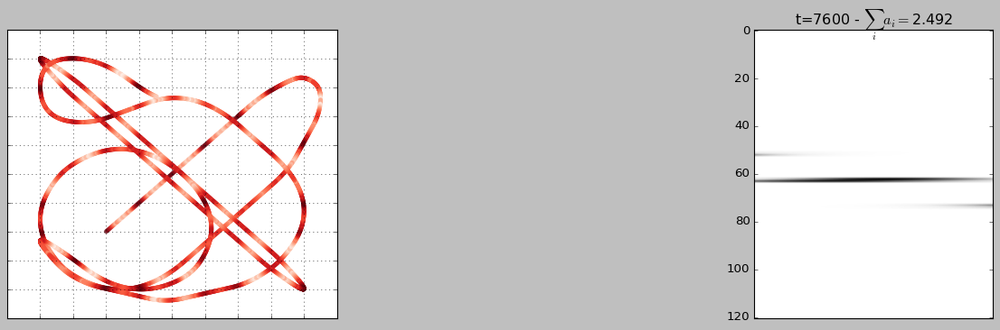

2024-02-17 19:37:59 | 


In [57]:
""" Initialization """
layer = it.InputNetwork(layers=[it.BorderLayer(N=5*4, sigma=0.001), 
                                it.PlaceLayer(N=11**2, sigma=sigma)])
layer = it.InputNetwork(layers=[it.PlaceLayer(N=11**2, sigma=sigma)])
Nj = layer.N
logger(layer)

""" Creation of the trajectory """
whole_track = it.make_whole_walk(dx=0.01)

logger(f"Whole track, shape={whole_track.shape}")

# Create a trajectory
trajectory = it.make_trajectory(duration=duration, dt=dt, speed=[speed, speed], 
                                  prob_turn=prob_turn, k_average=k_average)

inputs = layer.parse_trajectory(trajectory=trajectory)
whole_track = layer.parse_trajectory(trajectory=whole_track)
 
# normalize
inputs = np.clip(inputs, 0, 1)
whole_track = np.clip(whole_track, 0, 1)

logger(f"Trajectory shape={trajectory.shape}")

""" Plot """

zpc = np.zeros(inputs.shape[0])
for i in range(inputs.shape[1]):
    zpc += np.where(inputs[:, i] > 0.1, inputs[:, i], 0)
    
# plot
if bool(1):
    for t in range(0, len(A)-100, 100):
        clf()
        plt.figure(figsize=(20, 5))
        plt.subplot(131)
        plt.scatter(trajectory[:t, 0], trajectory[:t, 1], c=zpc[:t], s=20, cmap='Reds',
                    edgecolors='black', linewidths=0, marker='o', alpha=0.5)
        plt.xlim((0, 1))
        plt.ylim((0, 1))
        plt.xticks(np.arange(0, 1, 0.1), ())
        plt.yticks(np.arange(0, 1, 0.1), ())
        plt.grid()
        
        plt.subplot(122)
        plt.imshow(inputs[t:t+100, :].T, cmap='Greys')
        plt.title(f"{t=} - $\sum_i a_i=${z[t]:.3f}")
        plt.xticks(())
        plt.pause(0.01)

logger()

##### Run

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10201/10201 [00:00<00:00, 21439.32it/s]


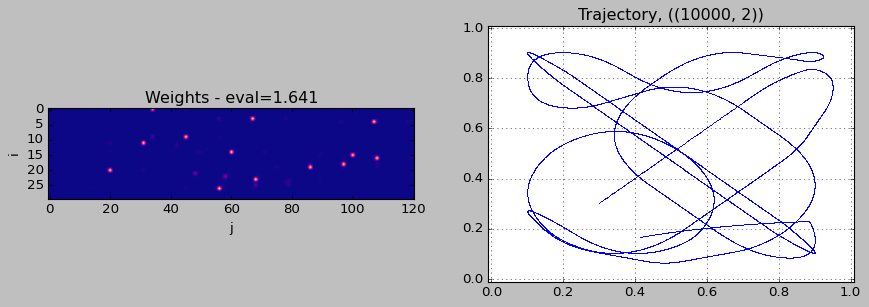

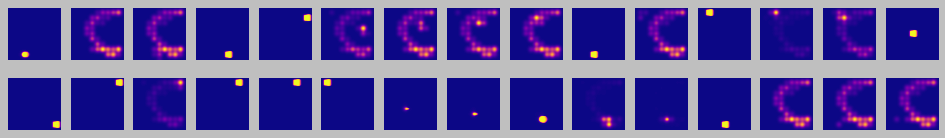

In [58]:
""" Initialization """
N = 30

genome['N'] = N
genome['Nj'] = Nj
model = mm.PCNNetwork(**genome)

""" Run """
for t, x in tqdm_enumerate(inputs):
    model.step(x=x.reshape(-1, 1))

""" Test """
record = np.empty((N, len(whole_track)))
model.set_off()
for t, x in tqdm_enumerate(whole_track):
    model.step(x=x.reshape(-1, 1))   
    record[:, t] = model.u.flatten()

""" Plot """
plt.figure(figsize=(13, 4))
plt.subplot(121)
plt.imshow(model.Wff, cmap='plasma')
score = mm.eval_func(weights=model.Wff, wmax=model._wff_max, ignore_zero=0, axis=0)
score2 = mm.eval_information(model=model, trajectory=whole_track)[0]
plt.title(f"Weights - eval={score2:.3f}")
plt.xlabel('j')
plt.ylabel('i')

plt.subplot(122)
plt.plot(trajectory[:, 0], trajectory[:, 1], ',')
plt.ylim((-0.01, 1.01))
plt.xlim((-0.01, 1.01))
plt.grid()
plt.title(f"Trajectory, ({trajectory.shape})")
plt.show()

plot_activation(record.T, shape=(2, model.N // 2))

In [50]:
record[10].max()

0.021272666784780913

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 65.96it/s]


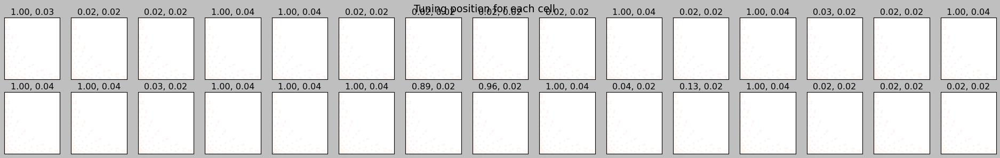

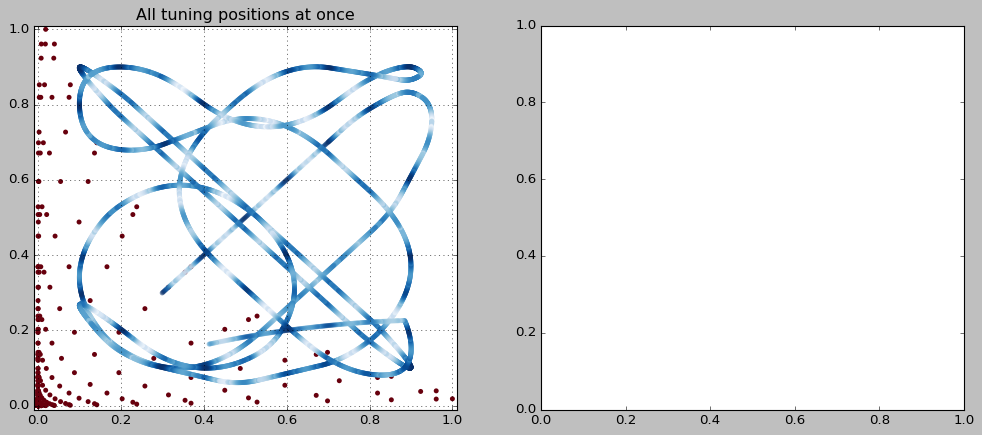

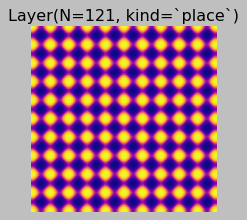

In [59]:
""" plot each cell's preferred location over the trajectory """
ncols = model.N // 2
_, axs = plt.subplots(2, ncols, figsize=(ncols*2, 4))
i = 0
for row in tqdm(axs):
    for ax in row:
        #ax.plot(trajectory[:, 0], trajectory[:, 1])
        ax.scatter(whole_track[:, 0], whole_track[:, 1], c=record[i], s=10, cmap='Reds',
           edgecolors='black', linewidths=0)
        #ax.axis('off')
        ax.set_ylim((-0.01, 1.01))
        ax.set_xlim((-0.01, 1.01))
        ax.set_xticks(())
        ax.set_yticks(())
        ax.set_title(f"{record[i].max():.2f}, {record[i].mean():.2f}")
        i += 1
plt.suptitle("Tuning position for each cell", fontsize=17)
plt.show()

""" plot all cells at the same time """

_, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

z = np.zeros(record.shape[1])
for i in range(model.N):
    #if i > 7: break
    if record[i].max() > 1: continue
    z += np.where(record[i] > 0., record[i], 0)

#z = z.clip(0, 0.8) 
#z = (z.max() - z)/(z.max() - z.min())
#plt.scatter(whole_track[:, 0], whole_track[:, 1], c=record[7], s=20, cmap='Reds')
ax1.scatter(whole_track[:, 0], whole_track[:, 1], c=z, s=20, cmap='Reds_r',
           edgecolors='black', linewidths=0)

ax1.scatter(trajectory[:, 0], trajectory[:, 1], c=zpc, s=20, cmap='Blues',
                edgecolors='black', linewidths=0, marker='o', alpha=0.5)

ax1.set_ylim((-0.01, 1.01))
ax1.set_xlim((-0.01, 1.01))
ax1.grid()
ax1.set_title("All tuning positions at once")
#ax1.scatter(whole_track[:, 0], whole_track[:, 1], c=whole_track_pc.sum(axis=1), cmap='Greys', edgecolors='white', alpha=0.3)

# input contour
#layer_pc.plot(size=300, kind='contour', sigmoid_beta=1, sigmoid_alpha=0.1, ax=ax2)
layer.plot(size=300, kind='imshow', sigmoid_beta=0.1, sigmoid_alpha=0., ax=ax2)


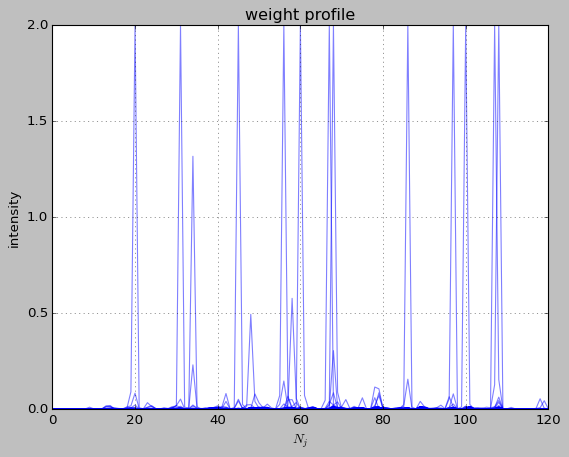

In [60]:
idx = 2

for idx in range(model.N):
    plt.plot(range(model.Nj), model.Wff[idx].flatten(), '-b', alpha=0.5)
plt.title("weight profile")
plt.xlabel("$N_j$")
plt.ylabel("intensity")
plt.grid(alpha=0.75)
plt.show()

In [636]:
np.around(model.Wff.sum(axis=0))

array([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  5.,  0.,  0.,  0.,
        0.,  0.,  5., 40.,  5.,  0.,  0.,  0.,  0.,  0.,  5.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])

In [612]:
sums = model.Wff.sum(axis=1)
print(np.around(sums, 3))
np.where(sums < 2, 1, 0)

[5.643 8.077 5.377 0.    4.148 4.106 0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.   ]


array([0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1])

#### test model on the trajectory: live 2D

In [61]:
""" make trajectory """
Nj = 5**2

#layer_pc = it.PlaceLayer(N=Nj, sigma=sigma)
layer_pc = it.InputNetwork(layers=[it.BorderLayer(N=4*2, sigma=0.01), 
                                   it.PlaceLayer(N=5**2, sigma=0.01)])
Nj = layer_pc.N
logger(layer_pc)

""" Creation of the data """

whole_track = it.make_whole_walk(dx=0.01)
logger(f"Whole track, shape={whole_track.shape}")
trajectory = it.make_trajectory(duration=duration, dt=dt, speed=[speed, speed], 
                                  prob_turn=prob_turn, k_average=k_average)

inputs_pc = layer_pc.parse_trajectory(trajectory=trajectory)
whole_track_pc = layer_pc.parse_trajectory(trajectory=whole_track)

2024-02-17 19:38:48 | InputNetwork(N=33, layers=`border,place`)
2024-02-17 19:38:48 | Whole track, shape=(10201, 2)
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10201/10201 [00:00<00:00, 65023.37it/s]


In [62]:
""" make activations """
N = 20
genome['Nj'] = Nj
genome['N'] = N

# untrained model
model_untrained = mm.PCNNetwork(**genome)
model_untrained.set_off(bias=0.8, gain=5)

""" training """
model = mm.PCNNetwork(**genome)
for t, x in tqdm_enumerate(inputs_pc):
    model.step(x=x.reshape(-1, 1))

""" record """
activation_mod = np.empty((len(inputs_pc), N))
activation_mod_un = np.empty((len(inputs_pc), N))

model.set_off(bias=0.8, gain=5)

for t, x in tqdm_enumerate(inputs_pc):
    model.step(x=x.reshape(-1, 1))   
    model_untrained.step(x=x.reshape(-1, 1)) 
    activation_mod[t, :] = model.u.flatten()
    activation_mod_un[t, :] = model_untrained.u.flatten()

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:00<00:00, 13371.57it/s]


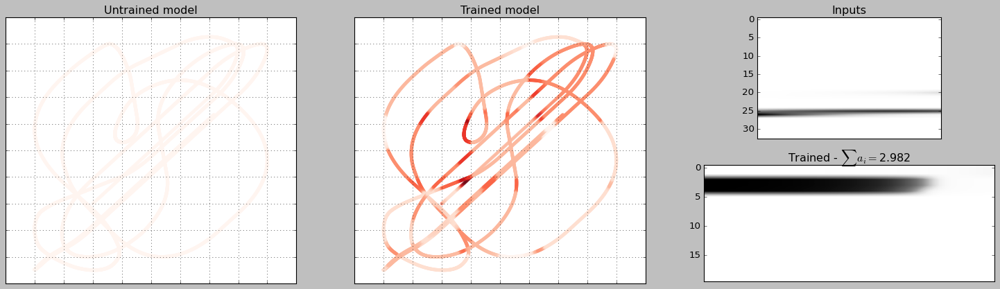

2024-02-17 19:41:06 | 


In [66]:
# make activations
z_mod = np.zeros(activation_mod.shape[0])
z_mod_un = np.zeros(activation_mod.shape[0])
for i in range(activation_mod.shape[1]):
    z_mod += np.where(activation_mod[:, i] > 0.1, activation_mod[:, i], 0)
    z_mod_un += np.where(activation_mod_un[:, i] > 0.1, activation_mod_un[:, i], 0)
    
# plot
for t in range(0, len(activation_mod)-100, 100):
    clf()
    fig = plt.figure(figsize=(23, 6))
    plt.subplot(131)
    plt.scatter(trajectory[:t, 0], trajectory[:t, 1], c=z_mod_un[:t], s=20, cmap='Reds',
                edgecolors='black', linewidths=0, marker='o', alpha=0.5)
    plt.xlim((0, 1))
    plt.ylim((0, 1))
    plt.xticks(np.arange(0, 1, 0.1), ())
    plt.yticks(np.arange(0, 1, 0.1), ())
    plt.grid()
    plt.title(f"Untrained model")
    
    plt.subplot(132)
    plt.scatter(trajectory[:t, 0], trajectory[:t, 1], c=z_mod[:t], s=20, cmap='Reds',
                edgecolors='black', linewidths=0, marker='o', alpha=0.5)
    plt.xlim((0, 1))
    plt.ylim((0, 1))
    plt.xticks(np.arange(0, 1, 0.1), ())
    plt.yticks(np.arange(0, 1, 0.1), ())
    plt.grid()
    plt.title(f"Trained model")
    
    plt.subplot(233)
    plt.imshow(activation_mod_un[t:t+50, :].T, cmap='Greys')
    plt.imshow(inputs_pc[t:t+50, :].T, cmap='Greys')
    plt.title(f"Inputs")
    plt.xticks(())
    
    plt.subplot(236)
    plt.imshow(activation_mod[t:t+50, :].T, cmap='Greys')
    plt.title(f"Trained - $\sum a_i=${z_mod[t]:.3f}")
    plt.xticks(())
    
    plt.pause(0.1)

logger()

### Live 2D

##### Load genome

In [4]:
genome = {'gain': 10.0,
          'bias': 0.7,
          'lr': 0.8,
          'tau': 10,
          'wff_min': 0.0,
          'wff_max': 2.0,
          'wff_tau': 1000,
          'soft_beta': 4,
          'DA_tau': 3,
          'bias_decay': 100,
          'bias_scale': 0.0,
          'IS_magnitude': 20,
          'is_retuning': False,
          'theta_freq': 0.021,
          'theta_freq_increase': 0.16,
          'sigma_gamma': 9.6e-05,
          'nb_per_cycle': 5,
          'nb_skip': 2,
          'N': 20,
          'Nj': 36,
          'plastic': True
         }

genome2 = {
          'gain': 10.0,
          'bias': 1.1,
          'lr': 0.4,
          'tau': 700,
          'wff_std': 0.0,
          'wff_min': 0.0,
          'wff_max': 2.,
          'wff_tau': 1_000,
          'soft_beta': 1,
          'dt': 1,
          'N': 5,
          'Nj': 5,
          'DA_tau': 3,
          'bias_scale': 0.0,
          'bias_decay': 100,
          'IS_magnitude': 20,
          'theta_freq': 0.003,
          'nb_per_cycle': 5,
          'plastic': True,
          'nb_skip': 2,
          'seed': 100,
}

In [3]:
genome = {'gain': 5,
 'bias': 1,
 'lr': 0.8,
 'tau': 100,
 'wff_min': 0.0,
 'wff_max': 0.5,
 'wff_tau': 1500,
 'soft_beta': 1.7,
 'beta_clone': 0.3,
 'low_bounds_nb': 5,
 'DA_tau': 4,
 'bias_decay': 120,
 'bias_scale': 0.84,
 'IS_magnitude': 50,
 'theta_freq': 0.001,
 'theta_freq_increase': 0.075,
 'sigma_gamma': 9.1e-05,
 'nb_per_cycle': 5,
 'nb_skip': 2,
 'dt': 0.001,
 'speed': 0.001,
 'sigma_pc': 0.00251,
 'sigma_bc': 0.005,
 'N': 60,
 'Nj': 121,
 'is_retuning': True,
 'plastic': True,
 'u_trace_decay': 2}

In [2]:
""" good params """

genome = {'gain': 5.0,
 'bias': 0.8,
 'lr': 0.99,
 'tau': 157,
 'wff_min': 0.0,
 'wff_max': 2.0,
 'wff_tau': 950,
 'soft_beta': 1.7,
 'beta_clone': 0.3,
 'low_bounds_nb': 5,
 'DA_tau': 0.9,
 'bias_decay': 120,
 'bias_scale': 0.84,
 'IS_magnitude': 50,
 'theta_freq': 0.007,
 'theta_freq_increase': 0.16,
 'sigma_gamma': 9.1e-05,
 'nb_per_cycle': 5,
 'nb_skip': 2,
 'dt': 0.206,
 'speed': 0.091,
 'sigma_pc': 0.00251,
 'sigma_bc': 0.005,
 'N': 20,
 'Nj': 121,
 'is_retuning': False,
 'plastic': True}

""" edit """
genome['DA_tau'] = 20
genome['theta_freq'] = 0.007
genome['gain'] = 5
genome['bias'] = 0.9
genome['lr'] = 0.9
genome['dt'] = 0.001
genome['speed'] = 0.001
genome['wff_max'] = 0.1
genome['wff_tau'] = 2000
genome['is_retuning'] = True
genome['theta_freq_increase'] = 0.075
genome['u_trace_decay'] = 2
genome['nb_skip'] = 1
genome['tau'] = 10
genome['IS_magnitude'] = 40

##### Make trajectory

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40401/40401 [00:00<00:00, 95022.06it/s]
2024-06-06 13:32:30 | whole_track.shape=(40401, 2)
2024-06-06 13:32:30 | trajectory.shape=(1800, 2)


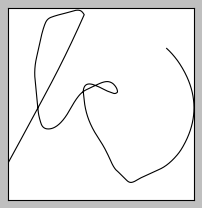

In [3]:
""" settings """
duration = 2
speed = genome['speed']
dt = genome['dt']

# make trajectory
whole_track = it.make_whole_walk(dx=0.005)
trajectory = it.make_trajectory(duration=duration, dt=dt, speed=[speed, speed], 
                                prob_turn=0.01, k_average=200)[200:]
#trajectory = whole_track.copy()

# make activations
layer = it.PlaceLayer(N=13**2, sigma=0.01)
#whole_track = hl.calc_input_trajectory(whole_track).reshape(-1, 6)
#trajectory = hl.calc_input_trajectory(trajectory).reshape(-1, 6)

inputs = layer.parse_trajectory(trajectory=trajectory)
whole_track_layer = layer.parse_trajectory(trajectory=whole_track)

logger(f"{whole_track.shape=}")
logger(f"{trajectory.shape=}")

plt.figure(figsize=(3, 3))
plt.plot(trajectory[:, 0], trajectory[:, 1], 'k-')
plt.xticks(())
plt.yticks(());

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40401/40401 [00:00<00:00, 90921.72it/s]


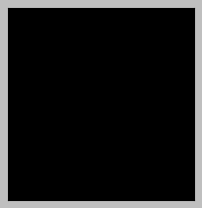

In [9]:
""" settings : whole track as trajectory """
duration = 20
speed = genome['speed']
dt = genome['dt']

# make trajectory
whole_track = it.make_whole_walk(dx=0.005)
trajectory = it.make_trajectory(duration=duration, dt=dt, speed=[speed, speed])
#                                  prob_turn=0.004, k_average=200)[1000:]
trajectory = whole_track.copy()
# make activations
layer = it.PlaceLayer(N=13**2, sigma=0.075)
inputs = layer.parse_trajectory(trajectory=trajectory)
whole_track_layer = layer.parse_trajectory(trajectory=whole_track)

plt.figure(figsize=(3, 3))
plt.plot(trajectory[:, 0], trajectory[:, 1], 'k-')
plt.xticks(())
plt.yticks(());

##### Train

In [4]:
genome['DA_tau'] = 200
model, record = utils.train_trajectory(N=100, params=genome.copy(), model_class=mm.PCNNetwork, layer=layer, trajectory=trajectory, inputs=inputs)
N = model.N

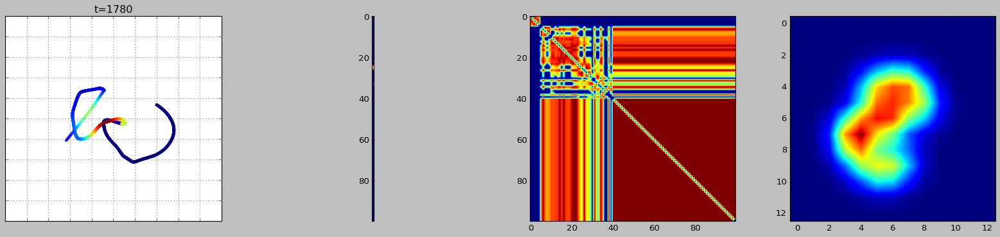

2024-06-06 13:34:24 | 


In [6]:
""" Initialization """

# model
N = 50
Nj = layer.N
nj = int(np.sqrt(Nj))
genome['N'] = N
genome['Nj'] = Nj
model = mm.PCNNetwork(**genome)

""" Run """

record = np.zeros((N+1, inputs.shape[0]))
Ix = np.zeros((N, inputs.shape[0]))
X2 = np.zeros((inputs.shape[0] + 10, Nj))
colors = [plt.cm.rainbow(i/N) for i in range(N)]

total_time = len(inputs)

pf = 1
flash = []
for t, x in tqdm_enumerate(inputs, disable=pf in (0, 1, 2)):
  
    model.step(x=x.reshape(-1, 1))
    record[1:, t] = model.Is.flatten()
    record[0, t] = model.DA
    Ix[:, t] = model.Is.flatten() / 8
    if t > 0:
        flash += [model.u_trace[10].item()]
    
    X2[:t] = inputs[:t]

    # DA policy
    if t > total_time / 2:
        model.set_da_tau(DA_tau=20)

    if t % 20 == 0:
        #vis.plotting(model=model, X=X2, t=t, record=record, Ix=Ix, colors=colors, subtitle_2=f"$I_s$={np.around(model.Ix.flatten(), 2)}") 

        if pf == 0:
            vis.plotting(model=model, X=X2, t=t, record=record, Ix=Ix, colors=colors, winsize_1=60,
                        subtitle_3=f"$\langle temp\\rangle=${np.around(model.temp.mean(), 1)} - $Is_m${np.around(model.var4.max(), 3)} - $\\theta=${model._theta_freq:.4f}")   
        elif pf == 1:
            clf()
            plt.figure(figsize=(25, 5))
            plt.subplot(141)
            plt.scatter(trajectory[:t, 0], trajectory[:t, 1], c=flash, s=20, 
                        edgecolors='black', linewidths=0, marker='o', alpha=0.5)
            plt.xlim((0, 1))
            plt.ylim((0, 1))
            plt.xticks(np.arange(0, 1, 0.1), ())
            plt.yticks(np.arange(0, 1, 0.1), ())
            plt.grid()
            plt.title(f"{t=}")
            
            plt.subplot(142)
            plt.imshow(model.u_trace, cmap='plasma')
            #plt.title(f"{t=} - $\sum_i a_i=${z[t]:.3f}")
            plt.xticks(())

            plt.subplot(143)
            plt.imshow(model.W_rec)

            plt.subplot(144)
            plt.imshow(model.W_final[14].reshape(13, 13))
            
            plt.pause(0.001)
        elif pf == 2:
            clf()
            plt.figure(figsize=(25, 5))
            #plt.subplot(111)
            plt.plot(trajectory[:t, 0]*12, trajectory[:t, 1]*12, 'k-', alpha=0.5)
            
            plt.imshow(model.W_final.sum(axis=0).reshape(13, 13).T, alpha=0.5, cmap='Reds')
            #plt.xlim((0, 1))
            #plt.ylim((0, 1))
            plt.xticks(np.linspace(0, nj, 20), ())
            plt.yticks(np.linspace(0, nj, 20), ù())
            plt.grid()
            plt.title(f"{t=}")
            
            plt.pause(0.001)
        
    
logger()

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 28.98it/s]


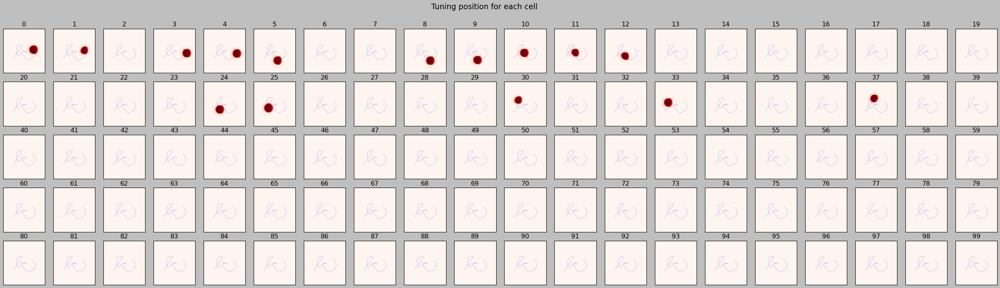

In [7]:
""" Test """
N = model.N
record = np.empty((N, len(whole_track)))
model.set_off()
for t, x in tqdm_enumerate(whole_track_layer):
    model.step(x=x.reshape(-1, 1))   
    record[:, t] = model.u.flatten()
    
zpc = np.zeros(inputs.shape[0])
for i in range(inputs.shape[1]):
    zpc += np.where(inputs[:, i] > 0.1, inputs[:, i], 0)
    
""" plot each cell's preferred location over the trajectory """
#n_to_plot = min((model.N, 40))
nrows = 5
ncols = model.N // nrows
fig_0, axs = plt.subplots(nrows, ncols, figsize=(ncols*2, nrows*2))
i = 0
for row in tqdm(axs):
    for ax in row:
        ax.plot(trajectory[:, 0], trajectory[:, 1], alpha=0.2)
        ax.scatter(whole_track[:, 0], whole_track[:, 1], c=record[i], s=10, cmap='Reds',
           edgecolors='black', linewidths=0)
        #ax.axis('off')
        ax.set_ylim((-0.01, 1.01))
        ax.set_xlim((-0.01, 1.01))
        ax.set_xticks(())
        ax.set_yticks(())
        ax.set_title(f"{i}")
        i += 1
plt.suptitle("Tuning position for each cell", fontsize=17)
plt.show()

# input contour
#layer_pc.plot(size=300, kind='contour', sigmoid_beta=1, sigmoid_alpha=0.1, ax=ax2)
#layer.plot(size=300, kind='imshow', sigmoid_beta=0.1, sigmoid_alpha=0., ax=ax2)


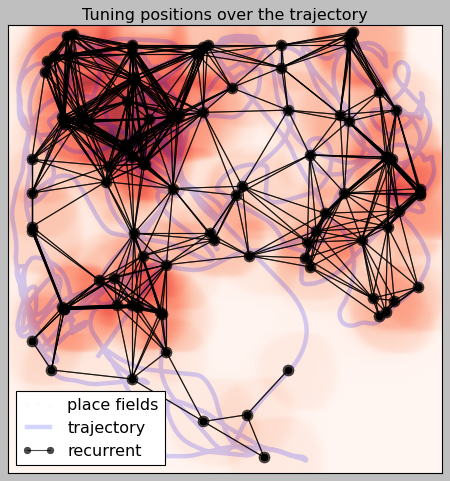

In [538]:
""" plot all cells at the same time """

fig, (ax1) = plt.subplots(1, 1, figsize=(7, 7))

z = np.zeros(record.shape[1])
for i in range(model.N):
    #if i > 7: break
    if record[i].max() > 2: continue
    z += np.where(record[i] > 0., record[i], 0)

#z = z.clip(0, 0.8) 
#z = (z.max() - z)/(z.max() - z.min())
#plt.scatter(whole_track[:, 0], whole_track[:, 1], c=record[7], s=20, cmap='Reds')
ax1.scatter(whole_track[:, 0], whole_track[:, 1], c=z, s=20, cmap='Reds',
           edgecolors='black', linewidths=0, alpha=0.35, label="place fields")

#ax1.scatter(trajectory[:, 0], trajectory[:, 1], c=zpc, s=5, cmap='Blues',
#                edgecolors='black', linewidths=0, marker='o', alpha=0.15, label="trajectory")
ax1.plot(trajectory[:, 0], trajectory[:, 1], 'b-', lw=4, alpha=0.17, label="trajectory")

ax1.set_ylim((-0.01, 1.01))
ax1.set_xlim((-0.01, 1.01))
ax1.set_yticks(())
ax1.set_xticks(())
ax1.grid()

#ax1.scatter(whole_track[:, 0], whole_track[:, 1], c=whole_track_layer.sum(axis=1), cmap='Greys', edgecolors='white', alpha=0.3)
centers, connections = vis.plot_centers(model=model, trajectory=whole_track_layer, track=whole_track, kernel=np.ones((20)), 
                 threshold=0, threshold_s=0.1,
                 ax=ax1, record=record, kernel2=np.ones((4, 4)), alpha=0.7, plot=True, use_knn=True, knn_k=None, max_dist=0.2)

ax1.set_title("Tuning positions over the trajectory")
ax1.legend(loc="lower left")
plt.show()


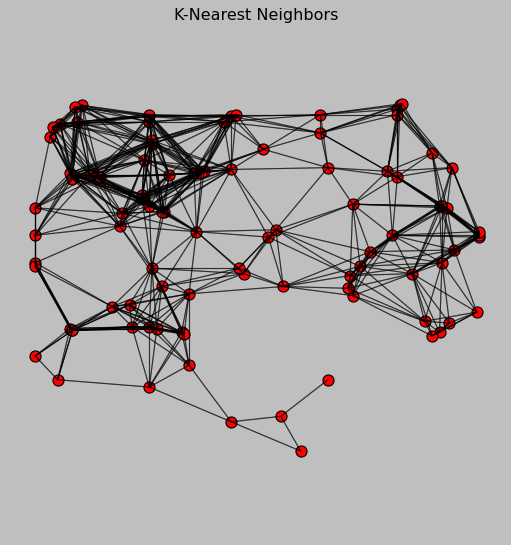

In [535]:
vis.plot_centers_knn(centers=centers, k=None, max_dist=0.2)

In [274]:
#ax1.scatter(whole_track[:, 0], whole_track[:, 1], c=whole_track_layer.sum(axis=1), cmap='Greys', edgecolors='white', alpha=0.3)
centers, connections = vis.plot_centers(model=model, trajectory=whole_track_layer, track=whole_track, kernel=np.ones((20)), 
                 threshold=0, threshold_s=0.1,
                 ax=ax1, record=record, kernel2=np.ones((4, 4)), alpha=0.7, plot=True, use_knn=True, knn_k=8, max_dist=0.4)

ax1.set_title("Tuning positions over the trajectory")
ax1.legend(loc="lower left")
plt.show()

# Analysis & plots
---

In [659]:
N = 80
layer = it.PlaceLayer(N=13**2, sigma=0.009)
duration = 10

dt = 1.
speed = 5e-3
nb = 3
nb_sim = 25
#da_values = np.linspace(3, 200, nb)
#da_values = np.array([10, 30, 200])
da_values = np.array([10, 50, 150])
nb = len(da_values)

y = np.empty((nb_sim, nb))

for l in tqdm(range(nb_sim)):

    # new track
    #whole_track = it.make_whole_walk(dx=0.005)
    #trajectory = it.make_trajectory(duration=duration, dt=dt, speed=[speed, speed], 
    #                                prob_turn=0.01, k_average=200)[200:]    
    # make activations
    #inputs = layer.parse_trajectory(trajectory=trajectory, disable_tqdm=True)
    #whole_track_layer = layer.parse_trajectory(trajectory=whole_track, disable_tqdm=True)

    trajectory, inputs, whole_track, whole_track_layer = utils.make_env(
    layer=layer, duration=duration, speed=speed, dt=dt, distance=9, dx=5e-4,
             plot=False, verbose=False)
        
    for i, da_tau in enumerate(da_values):
        genome['tau'] = da_tau
    
        # trajectory training
        model, record = utils.train_trajectory(N=N, params=genome.copy(), model_class=mm.PCNNetwork, layer=layer,
                                               trajectory=trajectory, inputs=inputs, plotting=-2)
    
        # track training
        record = np.empty((N, len(whole_track)))
        model.set_off()
        for t, x in enumerate(whole_track_layer):
            model.step(x=x.reshape(-1, 1))   
            record[:, t] = model.u.flatten()
    
        attempt = 0
        success = False
        while attempt < 10:
            try:
                centers, _, _ = vis.calc_cell_tuning(model=model, trajectory=whole_track_layer, track=whole_track, kernel=np.ones((20)), 
                                               threshold=0., threshold_s=0.1, record=record,
                                               kernel2=np.ones((4, 4)))
                success = True
            except ValueError:
                logger.warning(f"{attempt=}")
            attempt += 1
    
        if not success:
            logger.error("failed")
            break
        y[l, i] = len(centers)
        
logger("u tau finished")

100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [40:29<00:00, 97.18s/it]
2024-05-23 16:29:37 | u tau finished


#### **PLOT** : _number of PC_ $$\tau_{DA}\quad\text{vs}\quad N_{PC}$$

In [17]:
N = 80
layer = it.PlaceLayer(N=13**2, sigma=0.009)
duration = 10

dt = 1.
speed = 5e-3
nb = 5
nb_sim = 20
da_values = np.linspace(2, 200, nb)
#da_values = np.array([10, 30, 200])
#da_values = np.array([5, 30, 100])
nb = len(da_values)

y = np.empty((nb_sim, nb))

for l in tqdm(range(nb_sim)):

    # new track
    #whole_track = it.make_whole_walk(dx=0.005)
    #trajectory = it.make_trajectory(duration=duration, dt=dt, speed=[speed, speed], 
    #                                prob_turn=0.01, k_average=200)[200:]    
    # make activations
    #inputs = layer.parse_trajectory(trajectory=trajectory, disable_tqdm=True)
    #whole_track_layer = layer.parse_trajectory(trajectory=whole_track, disable_tqdm=True)

    trajectory, inputs, whole_track, whole_track_layer = utils.make_env(
    layer=layer, duration=duration, speed=speed, dt=dt, distance=9, dx=5e-4,
             plot=False, verbose=False)
        
    for i, da_tau in enumerate(da_values):
        genome['DA_tau'] = da_tau
    
        # trajectory training
        model, record = utils.train_trajectory(N=N, params=genome.copy(), model_class=mm.PCNNetwork, layer=layer,
                                               trajectory=trajectory, inputs=inputs, plotting=-2)
    
        # track training
        record = np.empty((N, len(whole_track)))
        model.set_off()
        for t, x in enumerate(whole_track_layer):
            model.step(x=x.reshape(-1, 1))   
            record[:, t] = model.u.flatten()
    
        attempt = 0
        success = False
        while attempt < 10:
            try:
                centers, _, _ = vis.calc_cell_tuning(model=model, trajectory=whole_track_layer, track=whole_track, kernel=np.ones((20)), 
                                               threshold=0., threshold_s=0.1, record=record,
                                               kernel2=np.ones((4, 4)))
                success = True
            except ValueError:
                logger.warning(f"{attempt=}")
            attempt += 1
    
        if not success:
            logger.error("failed")
            break
        y[l, i] = len(centers)
        
logger()

100%|█████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [39:24<00:00, 118.23s/it]
2024-05-23 20:00:16 | 


--- RUN

In [132]:
da_values = np.linspace(1, 200, 10)

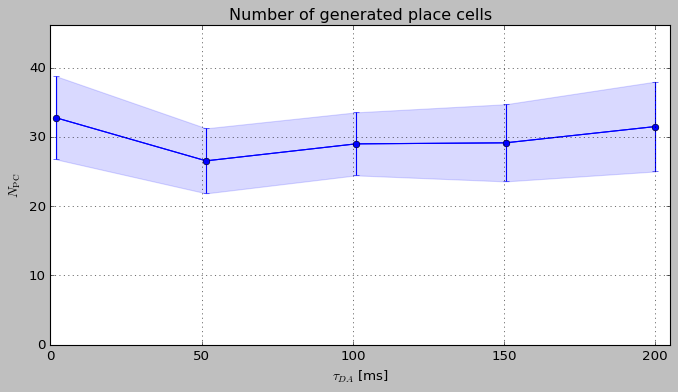

In [19]:
mu = y.mean(axis=0)
std = y.std(axis=0)

fig = plt.figure(figsize=(10, 5))
plt.scatter(da_values, mu, color="blue")
plt.plot(da_values, mu, "b-", label="mean")
plt.fill_between(da_values, mu - std, mu + std,
                 color="b", alpha=0.15, label="variance")

plt.errorbar(da_values, mu, yerr=std, fmt='-o')

plt.xlabel("$\\tau_{DA}$ [ms]")
plt.ylabel("$N_{\\text{PC}}$")
plt.ylim((0, y.max()*1.1))
plt.xlim((0, da_values.max()*1.025))
#plt.legend()
plt.grid()
plt.title(f"Number of generated place cells")
plt.show()

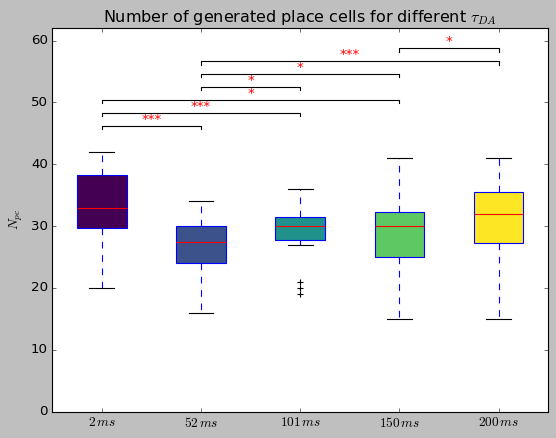

In [39]:
fig = utils.compare_models_multiruns(data=y.T.reshape(-1, nb_sim, 1), label=[f"${d:.0f}\,ms$" for d in da_values], plot_type="box", yshift=0.05, ylabel="$N_{pc}$", title="Number of generated place cells for different $\\tau_{DA}$")

In [42]:
fig.savefig("/Users/daniekru/Documents/outreach/poster_may24/datda_npc_g.svg", transparent=True)

---

In [549]:
y

array([[43., 19., 22.],
       [57., 24., 34.],
       [45., 30., 32.],
       [52., 40., 32.],
       [60., 32., 27.],
       [72., 29., 40.],
       [59., 32., 33.],
       [36., 17., 29.],
       [42., 23., 28.],
       [46., 25., 29.],
       [55., 29., 44.],
       [62., 26., 35.],
       [48., 21., 23.],
       [72., 26., 44.],
       [55., 26., 43.],
       [56., 29., 34.],
       [72., 39., 43.],
       [57., 33., 37.],
       [54., 30., 39.],
       [46., 25., 34.]])

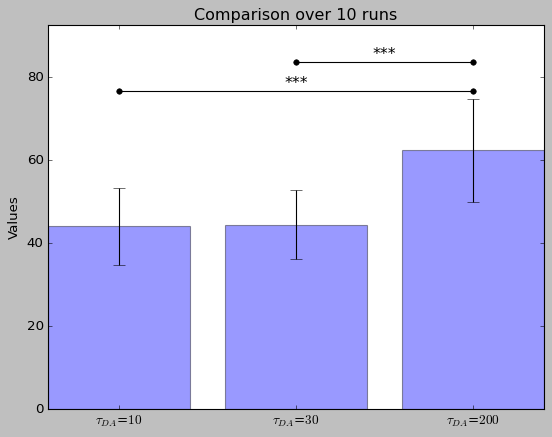

In [180]:
fig = utils.compare_models_multiruns(data=y.T.reshape(3, nb_sim, 1), label=["$\\tau_{DA}$"+f"=${d}$" for d in da_values])

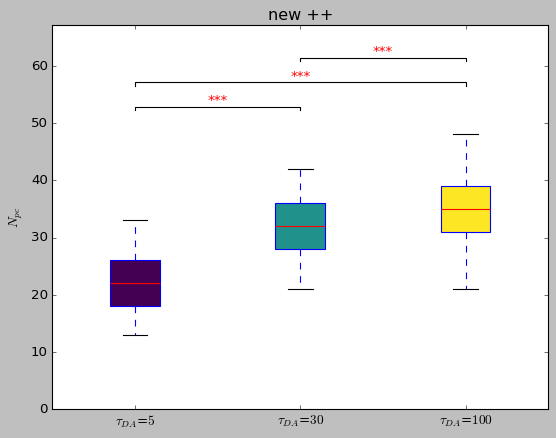

In [657]:
fig7 = utils.compare_models_multiruns(data=y.T.reshape(3, -1, 1), label=["$\\tau_{DA}$"+f"=${d}$" for d in da_values], plot_type="box", yshift=0.09,
                                    title="new ++", ylabel="$N_{pc}$")

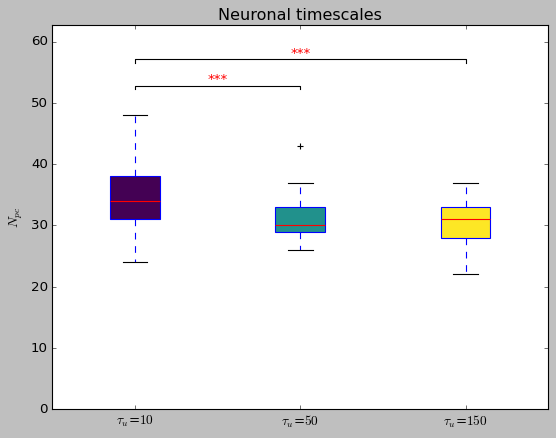

In [664]:
fig7 = utils.compare_models_multiruns(data=y.T.reshape(3, -1, 1), label=["$\\tau_{u}$"+f"=${d}$" for d in da_values], plot_type="box", yshift=0.09,
                                    title="Neuronal timescales", ylabel="$N_{pc}$")

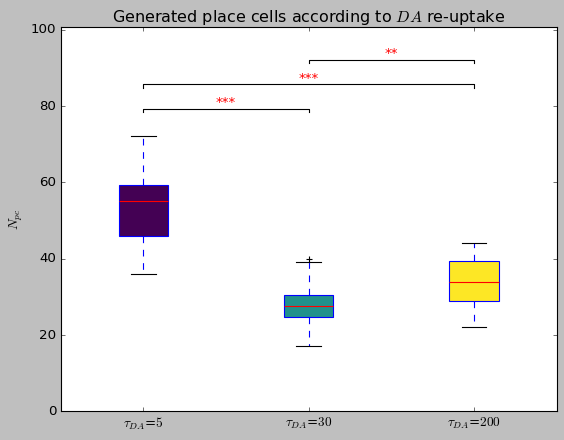

In [652]:
fig = utils.compare_models_multiruns(data=y.T.reshape(3, -1, 1), label=["$\\tau_{DA}$"+f"=${d}$" for d in da_values], plot_type="box", yshift=0.09,
                                    title="Generated place cells according to $DA$ re-uptake", ylabel="$N_{pc}$")

In [555]:
fig.savefig("/Users/daniekru/Documents/outreach/poster_may24/datau_npc_e.svg", transparent=True)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


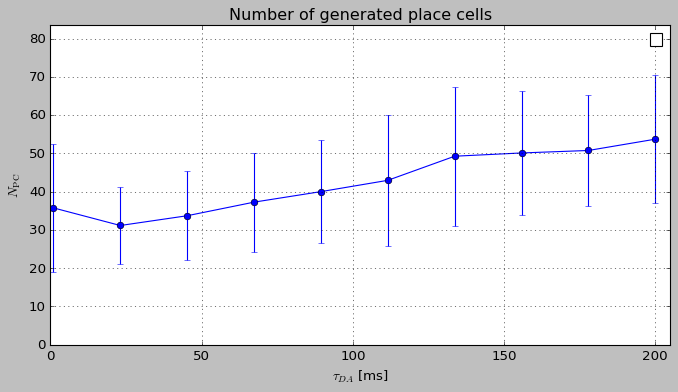

In [1331]:
#mu = y.mean(axis=0)
#std = y.std(axis=0)

fig = plt.figure(figsize=(10, 5))
plt.scatter(da_values, mu, color="blue")
#plt.plot(da_values, mu, "b-", label="mean")
#plt.fill_between(da_values, mu - std, mu + std,
#                 color="b", alpha=0.15, label="variance")

plt.errorbar(da_values, mu, yerr=std, fmt='-o')

plt.xlabel("$\\tau_{DA}$ [ms]")
plt.ylabel("$N_{\\text{PC}}$")
plt.ylim((0, y.max()*1.1))
plt.xlim((0, da_values.max()*1.025))
plt.legend()
plt.grid()
plt.title(f"Number of generated place cells")
plt.show()

**Changing**  $\quad\tau_u$

In [818]:
N = 100
layer = it.PlaceLayer(N=15**2, sigma=0.009)
duration = 10

dt = 1.
speed = 5e-3
nb = 3
nb_sim = 20
#da_values = np.linspace(3, 200, nb)
#da_values = np.array([10, 30, 200])
da_values = np.array([5, 30, 200])
nb = len(da_values)
genome['DA_tau'] = 30

y = np.empty((nb_sim, nb))

for l in tqdm(range(nb_sim)):

    # new track
    #whole_track = it.make_whole_walk(dx=0.005)
    #trajectory = it.make_trajectory(duration=duration, dt=dt, speed=[speed, speed], 
    #                                prob_turn=0.01, k_average=200)[200:]    
    # make activations
    #inputs = layer.parse_trajectory(trajectory=trajectory, disable_tqdm=True)
    #whole_track_layer = layer.parse_trajectory(trajectory=whole_track, disable_tqdm=True)

    trajectory, inputs, whole_track, whole_track_layer = utils.make_env(
    layer=layer, duration=duration, speed=speed, dt=dt, distance=7, dx=5e-4,
             plot=False, verbose=False)
        
    for i, da_tau in enumerate(da_values):

        genome['tau'] = da_tau
    
        # trajectory training
        model, record = utils.train_trajectory(N=N, params=genome.copy(), model_class=mm.PCNNetwork, layer=layer, trajectory=trajectory, inputs=inputs, plotting=-2)
    
        # track training
        record = np.empty((N, len(whole_track)))
        model.set_off()
        for t, x in enumerate(whole_track_layer):
            model.step(x=x.reshape(-1, 1))   
            record[:, t] = model.u.flatten()
    
        attempt = 0
        success = False
        while attempt < 10:
            try:
                centers, _, _ = vis.calc_cell_tuning(model=model, trajectory=whole_track_layer, track=whole_track, kernel=np.ones((20)), 
                                               threshold=0., threshold_s=0.1, record=record,
                                               kernel2=np.ones((4, 4)))
                success = True
            except ValueError:
                logger.warning(f"{attempt=}")
            attempt += 1
    
        if not success:
            logger.error("failed")
            break
        y[l, i] = len(centers)
        
logger()

  5%|████▉                                                                                             | 1/20 [03:02<57:43, 182.28s/it]


KeyboardInterrupt: 

#### **PLOT** : _PC over a trajectory_

##### Train & Define a protocol for varying $\tau_{DA}$

In [26]:
genome['theta_freq'] = 0.01
genome['tau'] = 50
genome['is_retuning'] = True
genome['theta_freq_increase'] = 0
genome['gain'] = 5
genome['bias'] = 0.9

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40401/40401 [00:00<00:00, 89930.46it/s]
2024-05-23 23:37:27 | whole_track.shape=(40401, 2)
2024-05-23 23:37:27 | trajectory.shape=(6400, 2)


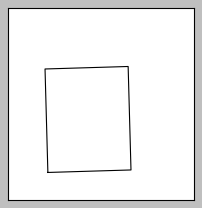

In [27]:
duration = 10
speed = 5e-3
dt = 1e-0
genome["dt"] = dt
genome["speed"] = speed

layer = it.PlaceLayer(N=14**2, sigma=0.01)

trajectory, inputs, whole_track, whole_track_layer = utils.make_env(
    layer=layer, duration=duration, speed=speed, dt=dt,
             plot=True, verbose=True, square=True, dx=0.0005, 
    variable=1)


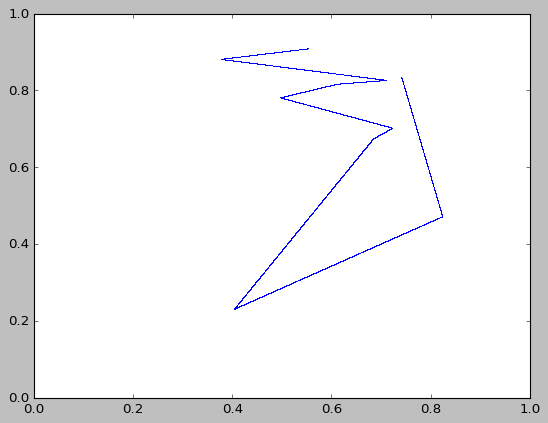

In [575]:
duration = 5
speed = 5e-3
dt = 1e-0
genome["dt"] = dt
genome["speed"] = speed

layer = it.PlaceLayer(N=14**2, sigma=0.01)

trajectory = utils.make_linear_walk(distance=5, dx=0.0005)

plt.plot(trajectory[:, 0], trajectory[:, 1], 'b,')
plt.xlim(0, 1)
plt.ylim(0, 1);


In [767]:
np.around(np.linalg.norm(trajectory[:10]-trajectory[1:11], axis=1), 5)

array([0.00034, 0.00034, 0.00034, 0.00034, 0.00034, 0.00034, 0.00034,
       0.00034, 0.00034, 0.00034])

In [478]:
np.linalg.norm(trajectory[:10]-trajectory[1:11], axis=1)

array([0.00122413, 0.00121606, 0.00120801, 0.0012    , 0.00119202,
       0.00118406, 0.00117614, 0.00116825, 0.00116039, 0.00115256])

100%|█████████████████████████████████████████████████████████████████████████████████████████| 40401/40401 [00:00<00:00, 86520.30it/s]
2024-05-23 14:38:06 | whole_track.shape=(40401, 2)
2024-05-23 14:38:06 | trajectory.shape=(11907, 2)


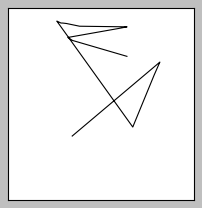

In [647]:
duration = 20
speed = 5e-4
dt = 1e-5
#genome["dt"] = dt
genome["speed"] = speed

layer = it.PlaceLayer(N=14**2, sigma=0.01)

trajectory, inputs, whole_track, whole_track_layer = utils.make_env(
    layer=layer, duration=duration, speed=speed, dt=dt, distance=5, dx=5e-4,
             plot=True, verbose=True)



In [1368]:
def da_policy(z: float, thr=0.5, r=0.):
    return (z > thr) * (z*r)

In [ ]:
genome['DA_tau'] = 40
model, _ = utils.train_salient_trajectory(N=50, params=genome.copy(), model_class=mm.PCNNetwork, 
                                              layer=layer, trajectory=trajectory, inputs=inputs,
                                              salience_space=rspace, policy=da_policy, r=0., enable_policy=False)
N = model.N

**Plot**

100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 25.55it/s]


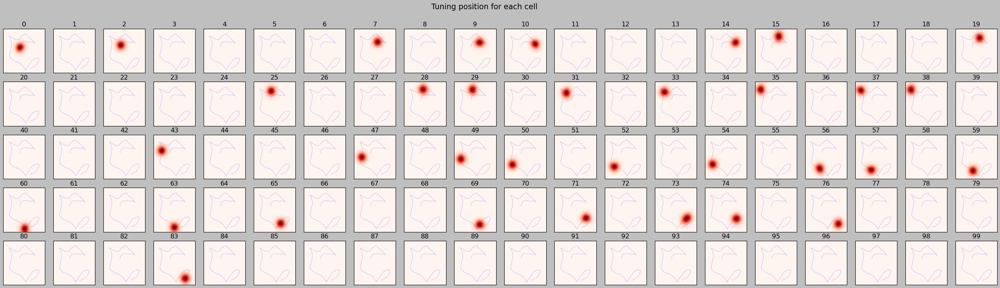

In [348]:
#record = utils.train_whole_track(model=model, whole_track=whole_track, whole_track_layer=whole_track_layer)
vis.plot_place_fields(N=model.N, trajectory=trajectory, whole_track=whole_track, record=record)

In [497]:
record = utils.train_whole_track(model=model, whole_track=whole_track, whole_track_layer=whole_track_layer, verbose=True, gain=0.9, bias=5)

fig = vis.plot_one_pc(trajectory=trajectory, whole_track=whole_track, record=record, idx=73)

  1%|█▏                                                                                           | 518/40401 [00:01<02:07, 312.63it/s]


KeyboardInterrupt: 

In [384]:
fig.savefig(r"/Users/daniekru/Documents/outreach/poster_may24/pc_field_e.svg", transparent=True)

In [2161]:
help(model.set_off)

Help on method set_off in module src.models:

set_off(bias: float = None, gain: float = None) method of src.models.PCNNetwork instance
    Turn off plasticity
    
    Parameters
    ----------
    bias: float
        Bias of the activation function.
        Default: None
    gain: float
        Gain of the activation function.
        Default: None



100%|██████████████████████████████████████████████████████████████████████████████████████████| 40401/40401 [00:07<00:00, 5405.53it/s]
2024-05-23 14:39:25 | number=24


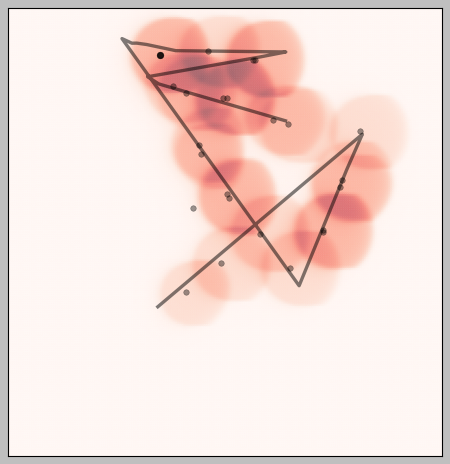

In [650]:
genome['DA_tau'] = 30
genome['theta_freq'] = 0.01
genome['tau'] = 5
genome['is_retuning'] = True
genome['theta_freq_increase'] = 0
genome['gain'] = 6
genome['bias'] = 0.9

model, _ = utils.train_salient_trajectory(N=80, params=genome.copy(), model_class=mm.PCNNetwork, 
                                          layer=layer, trajectory=trajectory, inputs=inputs,
                                              salience_space=rspace, policy=da_policy, r=0., enable_policy=False)
N = model.N
model.set_off()

record = utils.train_whole_track(model=model, whole_track=whole_track, whole_track_layer=whole_track_layer)
centers, _, _ = vis.calc_cell_tuning(model=model, trajectory=whole_track_layer, track=whole_track, kernel=np.ones((20)), 
                                               threshold=0., threshold_s=0.1, record=record,
                                               kernel2=np.ones((4, 4)))
logger(f"number={len(centers)}")
fig3 = vis.plot_fields_trajectory(record=record, whole_track=whole_track, whole_track_layer=whole_track_layer,
                           trajectory=trajectory, model=model, knn_k=11, max_dist=0.)

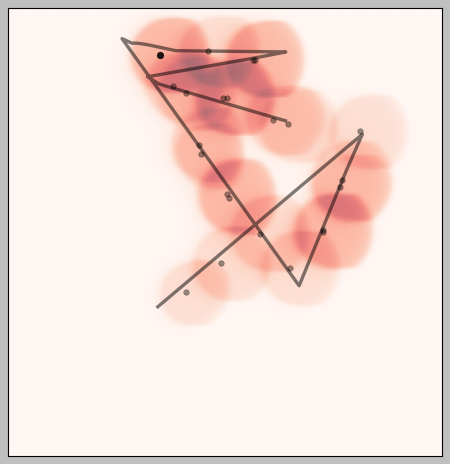

In [651]:
fig3 = vis.plot_fields_trajectory(record=record, whole_track=whole_track, whole_track_layer=whole_track_layer,
                           trajectory=trajectory, model=model, knn_k=None, max_dist=0.)

In [544]:
fig3.savefig(r"/Users/daniekru/Documents/outreach/poster_may24/place_fields_f.svg", transparent=True)

100%|███████████████████████████████████████████████████████████████████████████████████████████| 10235/10235 [00:20<00:00, 501.24it/s]
2024-05-23 12:49:36 | number=26
100%|██████████████████████████████████████████████████████████████████████████████████████████| 40401/40401 [00:09<00:00, 4236.08it/s]


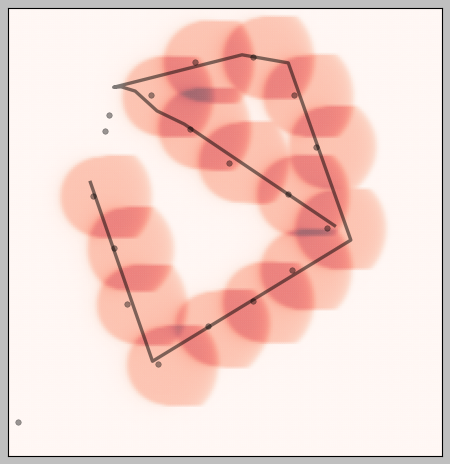

In [586]:
genome['DA_tau'] = 10
genome['tau'] = 100
genome['theta_freq'] = 0.01
model, _ = utils.train_salient_trajectory(N=100, params=genome.copy(), model_class=mm.PCNNetwork, 
                                              layer=layer, trajectory=trajectory, inputs=inputs,
                                              salience_space=rspace, policy=da_policy, r=0., enable_policy=False)
N = model.N

centers, _, _ = vis.calc_cell_tuning(model=model, trajectory=whole_track_layer, track=whole_track, kernel=np.ones((20)), 
                                               threshold=0., threshold_s=0.1, record=record,
                                               kernel2=np.ones((4, 4)))
logger(f"number={len(centers)}")

model.set_off()
record = utils.train_whole_track(model=model, whole_track=whole_track, whole_track_layer=whole_track_layer)
fig3 = vis.plot_fields_trajectory(record=record, whole_track=whole_track, whole_track_layer=whole_track_layer,
                           trajectory=trajectory, model=model, knn_k=11, max_dist=0.)

/Users/daniekru/Research/codebase/myenvs/env_cl1/lib/python3.11/site-packages/numpy/linalg/linalg.py:2582: RuntimeWarning: overflow encountered in multiply
  s = (x.conj() * x).real


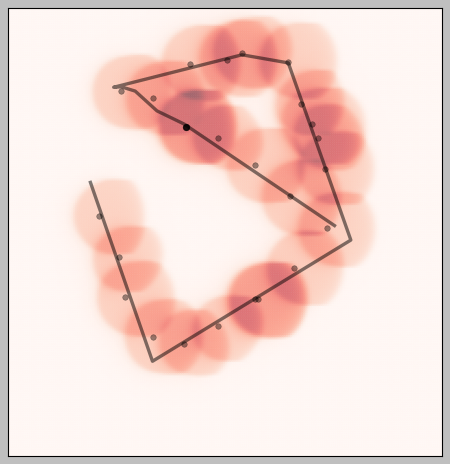

In [583]:
fig3 = vis.plot_fields_trajectory(record=record, whole_track=whole_track, whole_track_layer=whole_track_layer,
                           trajectory=trajectory, model=model, knn_k=11, max_dist=0.)

In [580]:

centers, _, _ = vis.calc_cell_tuning(model=model, trajectory=whole_track_layer, track=whole_track, kernel=np.ones((20)), 
                                               threshold=0., threshold_s=0.1, record=record,
                                               kernel2=np.ones((4, 4)))
logger(f"number={len(centers)}")


2024-05-23 12:47:17 | number=25


---

100%|█████████████████████████████████████████████████████████████████████████████████████████| 40401/40401 [00:00<00:00, 89431.96it/s]
2024-05-23 14:28:49 | whole_track.shape=(40401, 2)
2024-05-23 14:28:49 | trajectory.shape=(119200, 2)


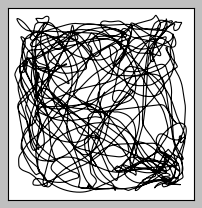

In [643]:
trajectory, inputs, whole_track, whole_track_layer = utils.make_env(
    layer=layer, duration=120, speed=speed, dt=dt, distance=None, dx=5e-4,
             plot=True, verbose=True)

genome['DA_tau'] = 30
genome['tau'] = 100
genome['theta_freq'] = 0.01
layer = it.PlaceLayer(N=14**2, sigma=0.01)

100%|█████████████████████████████████████████████████████████████████████████████████████████| 119200/119200 [04:32<00:00, 438.06it/s]
2024-05-23 14:33:34 | number=45
100%|███████████████████████████████████████████████████████████████████████████████████████████| 40401/40401 [02:00<00:00, 335.27it/s]


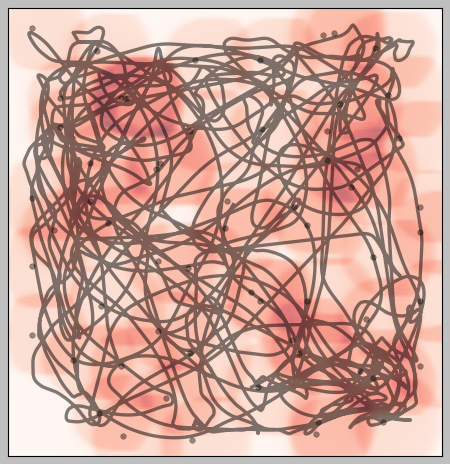

In [644]:
model, _ = utils.train_salient_trajectory(N=100, params=genome.copy(), model_class=mm.PCNNetwork, 
                                              layer=layer, trajectory=trajectory, inputs=inputs,
                                              salience_space=rspace, policy=da_policy, r=1., enable_policy=True)
N = model.N

centers, _, _ = vis.calc_cell_tuning(model=model, trajectory=whole_track_layer, track=whole_track, kernel=np.ones((20)), 
                                               threshold=0., threshold_s=0.1, record=record,
                                               kernel2=np.ones((4, 4)))
logger(f"number={len(centers)}")

record = utils.train_whole_track(model=model, whole_track=whole_track, whole_track_layer=whole_track_layer)
fig3 = vis.plot_fields_trajectory(record=record, whole_track=whole_track, whole_track_layer=whole_track_layer,
                           trajectory=trajectory, model=model, knn_k=11, max_dist=0.)

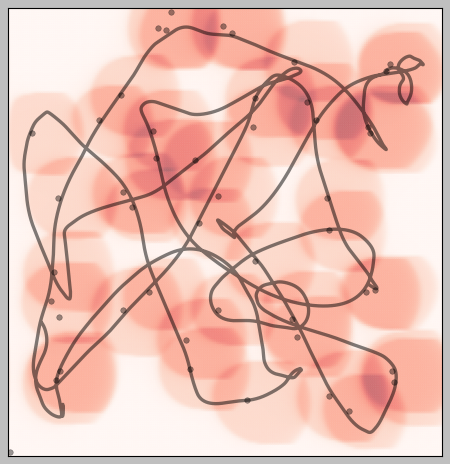

In [642]:
#record = utils.train_whole_track(model=model, whole_track=whole_track, whole_track_layer=whole_track_layer)
fig3 = vis.plot_fields_trajectory(record=record, whole_track=whole_track, whole_track_layer=whole_track_layer,
                           trajectory=trajectory, model=model, knn_k=11, max_dist=0.)

In [638]:
record = utils.train_whole_track(model=model, whole_track=whole_track, whole_track_layer=whole_track_layer)
fig3 = vis.plot_fields_trajectory(record=record, whole_track=whole_track, whole_track_layer=whole_track_layer,
                           trajectory=trajectory, model=model, knn_k=11, max_dist=0.)

  9%|████████▏                                                                                    | 3579/40401 [00:36<06:17, 97.51it/s]


KeyboardInterrupt: 

---

100%|██████████████████████████████████████████████████████████████████████████████████████████| 40401/40401 [00:07<00:00, 5178.37it/s]


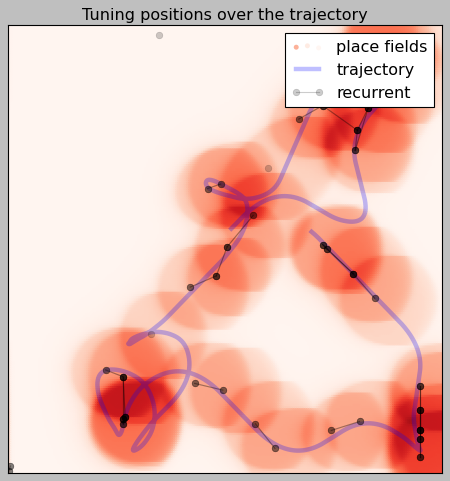

In [50]:
genome['DA_tau'] = 20
model, _ = utils.train_trajectory(N=100, params=genome.copy(), model_class=mm.PCNNetwork, 
                                              layer=layer, trajectory=trajectory, inputs=inputs)
N = model.N
record = utils.train_whole_track(model=model, whole_track=whole_track, whole_track_layer=whole_track_layer)
fig2 = vis.plot_fields_trajectory(record=record, whole_track=whole_track, whole_track_layer=whole_track_layer,
                           trajectory=trajectory, model=model, knn_k=11, max_dist=0.1)

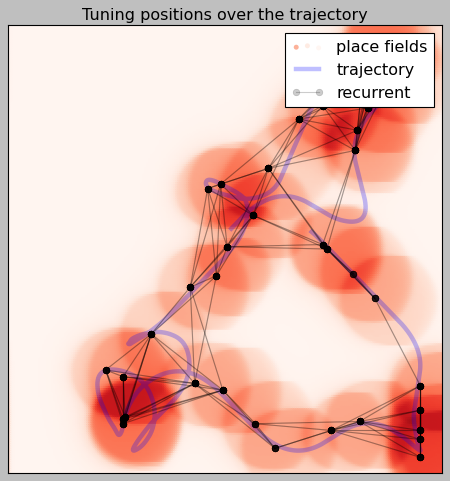

In [54]:
fig2 = vis.plot_fields_trajectory(record=record, whole_track=whole_track, whole_track_layer=whole_track_layer,
                           trajectory=trajectory, model=model, knn_k=None, max_dist=0.25)

/Users/daniekru/Research/codebase/myenvs/env_cl1/lib/python3.11/site-packages/numpy/linalg/linalg.py:2582: RuntimeWarning: overflow encountered in multiply
  s = (x.conj() * x).real


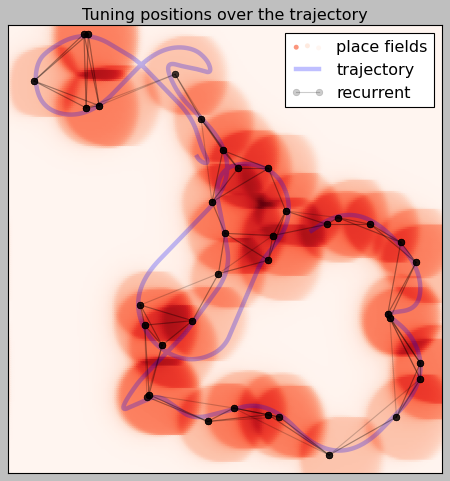

In [2128]:
fig2 = vis.plot_fields_trajectory(record=record, whole_track=whole_track, whole_track_layer=whole_track_layer,
                           trajectory=trajectory, model=model, knn_k=5, max_dist=0.3)

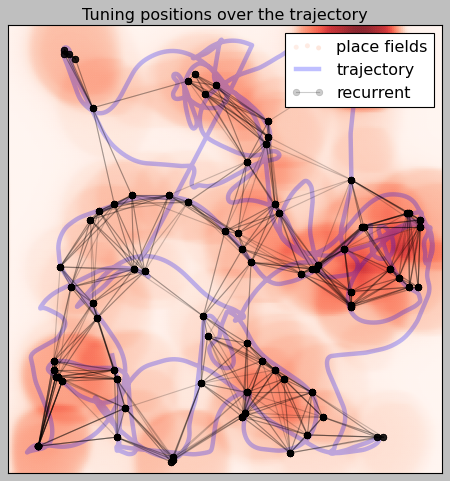

In [868]:
fig = vis.plot_fields_trajectory(record=record, whole_track=whole_track, whole_track_layer=whole_track_layer,
                           trajectory=trajectory, model=model, knn_k=11, max_dist=0.23)


---

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10201/10201 [00:00<00:00, 105748.08it/s]
2024-05-24 02:13:25 | whole_track.shape=(10201, 2)
2024-05-24 02:13:25 | trajectory.shape=(6001, 2)


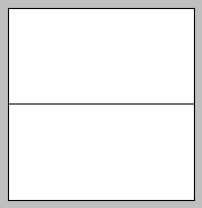

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10201/10201 [00:01<00:00, 5353.40it/s]


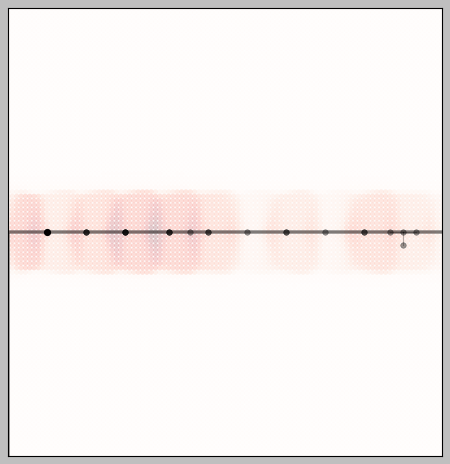

In [286]:
""" line env """
bounds = (0, 3, 0, 3)
layer = it.PlaceLayer(N=12**2, sigma=0.03, bounds=bounds)

trajectory, inputs, whole_track, whole_track_layer = utils.make_env(
    layer=layer, duration=None, speed=None, dt=None, distance=None, dx=5e-4,
             plot=True, verbose=True, bounds=bounds, line_env=True, 
    dx_whole=3e-2)

genome['DA_tau'] = 100
genome['tau'] = 100
genome['theta_freq'] = 0.007
genome['lr'] = 0.8

model, _ = utils.train_trajectory(N=100, params=genome.copy(), model_class=mm.PCNNetwork, 
                                  layer=layer, trajectory=trajectory, inputs=inputs, plotting=-1)

N = model.N
record = utils.train_whole_track(model=model, whole_track=whole_track, whole_track_layer=whole_track_layer)
fig2 = vis.plot_fields_trajectory(record=record, whole_track=whole_track, whole_track_layer=whole_track_layer,
                           trajectory=trajectory, model=model, knn_k=11, max_dist=0.1, bounds=bounds)

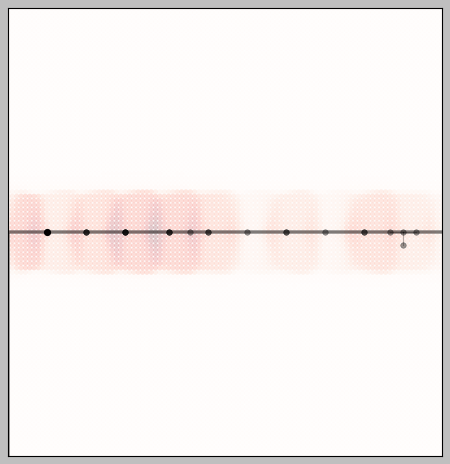

In [282]:
fig2 = vis.plot_fields_trajectory(record=record, whole_track=whole_track, whole_track_layer=whole_track_layer,
                           trajectory=trajectory, model=model, knn_k=11, max_dist=0.1, bounds=bounds)

#### **PLOT** : _PC over a salient space_

##### Define a function $f$ over $xy$ as a saliency map

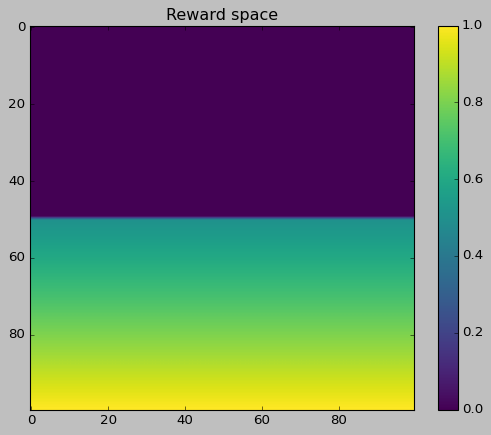

In [3]:
""" function over the environement """
#rspace = utils.SalienceSpace(func=lambda x, y: (x+0.3)**2 + (y+0.3)**2)
func = lambda x, y: (y>0.5)*y
rspace = utils.SalienceSpace(func=func)

rspace.plot()


In [223]:
rspace._points[2080], rspace._reward[2080]

(array([0.2020202 , 0.80808081]), 0.8080808080808082)

In [260]:
""" evaluation of the edge size distribution according to the policy """

def da_policy(z, r):
    return (z > 0.) * r

nb = 3
nb_sim = 15
#r_set = np.linspace(0, 1, nb)

duration = 10
speed = 3e-3
dt = 1.
N = 100
layer = it.PlaceLayer(N=15**2, sigma=0.01)


vals = np.zeros((nb, nb_sim, 2))
dals = np.zeros((nb, nb_sim, 2))


da_set = [10, 10, 200, 200]
r_set = [0., 1., 0., 1.]
ep_set = [False, True, False]

for k in tqdm(range(nb_sim)):

    trajectory, inputs, whole_track, whole_track_layer = utils.make_env(
    layer=layer, duration=duration, speed=speed, dt=dt,
             plot=False, verbose=False, square=False, dx=5e-4, distance=10)

    for i, r in enumerate(r_set):
        
        genome['tau'] = da_set[i]

        #
        model, rec = utils.train_salient_trajectory(N=N, params=genome.copy(), model_class=mm.PCNNetwork, 
                                                   layer=layer, trajectory=trajectory, inputs=inputs,
                                                   salience_space=rspace, policy=da_policy, r=r, verbose=False,
                                                   enable_policy=ep_set[i])

        #
        record = utils.train_whole_track(model=model, whole_track=whole_track, whole_track_layer=whole_track_layer, verbose=False)
        centers, _, _ = vis.calc_cell_tuning(model=model, trajectory=whole_track_layer, track=whole_track, kernel=np.ones((20)), 
                                             threshold=0., threshold_s=0.1, record=record,
                                             kernel2=np.ones((4, 4)))
        connections, weights = utils.calc_knn(centers=centers, k=None, max_dist=0.25, return_weights=True)

        #
        v, e = utils.calc_edge_distr(M=weights, plot=None)
        d = utils.calc_degree_distr(M=connections, plot=None)

        idxs1, idxs2 = policy_on_centers(centers=centers, func=lambda x, y: int(y>0.5))

        #
        vals[i, k, 0] = v[idxs1].mean() - v[idxs2].mean()
        vals[i, k, 1] = v[idxs1].std() - v[idxs2].std()
        dals[i, k, 0] = d[idxs1].mean() - d[idxs2].mean()
        dals[i, k, 1] = d[idxs1].std() - d[idxs2].std()


logger()

100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [14:22<00:00, 57.47s/it]
2024-05-23 03:53:06 | 


In [811]:
def policy_on_centers(centers: np.ndarray, func: callable):

    idxs = np.empty(len(centers))
    for i, c in enumerate(centers):
        idxs[i] = func(c[0], c[1])

    return np.where(idxs > 0)[0], np.where(idxs <= 0)[0]


(-0.1, 2.1)

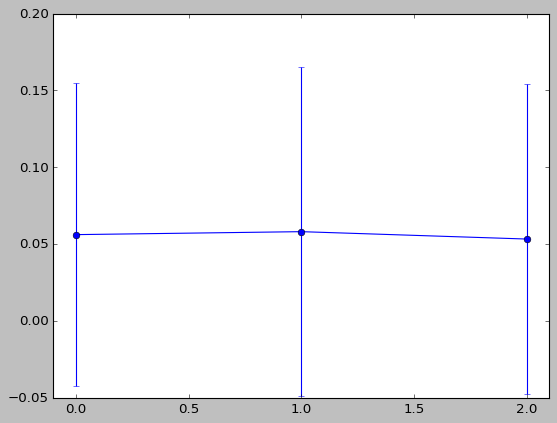

In [262]:
#vv = vals[:, :, 0]

#plt.plot(range(3), np.abs(vals[:, :, 0]).mean(axis=0), 'o-');

plt.errorbar(range(3), np.abs(dals[:, :, 0]).mean(axis=1), yerr=np.abs(dals[:, :, 1]).mean(axis=1), fmt='-o');
plt.xlim(-0.1, 2.1)

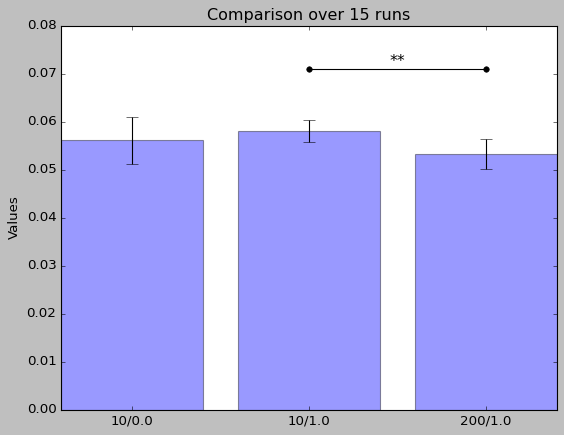

In [277]:
fig = utils.compare_models_multiruns(data=np.abs(dals[:, :, 0]).reshape(nb, nb_sim, 1), yshift=0.01, label=[f"{s}/{r}" for r, s in zip(r_set, da_set)])

In [51]:
utils.make_line_env(dx=0.001, bounds=(0, 0, 10, 0))[:10]

array([[0.   , 0.   ],
       [0.   , 0.   ],
       [0.001, 0.001],
       [0.002, 0.002],
       [0.003, 0.003],
       [0.004, 0.004],
       [0.005, 0.005],
       [0.006, 0.006],
       [0.007, 0.007],
       [0.008, 0.008]])

#### **PLOT** : __line environment and lattice deviation__

In [521]:
def silver_policy(s: float, genome=genome):

    genome['DA_tau'] = 2 * s + 100 * (1 - s)
    genome['tau'] = 2 * s + 100 * (1 - s)
    genome['theta_freq'] = 0.007
    genome['lr'] = 0.8

    return genome

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10201/10201 [00:00<00:00, 91242.55it/s]
2024-05-24 08:04:23 | whole_track.shape=(10201, 2)
2024-05-24 08:04:23 | trajectory.shape=(15001, 2)


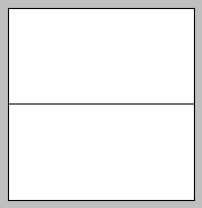

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10201/10201 [00:01<00:00, 5587.12it/s]


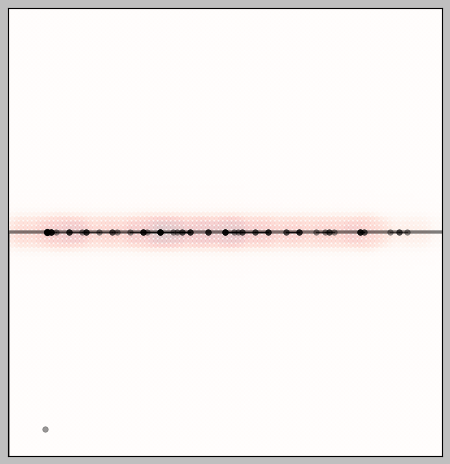

In [719]:
""" line env """
bounds = (0, 3, 0, 3)
layer = it.PlaceLayer(N=15**2, sigma=0.03, bounds=bounds)

trajectory, inputs, whole_track, whole_track_layer = utils.make_env(
    layer=layer, duration=None, speed=None, dt=None, distance=None, dx=2e-4,
             plot=True, verbose=True, bounds=bounds, line_env=True, 
    dx_whole=3e-2)

""" model and training """
genome = silver_policy(s=1)

model, _ = utils.train_trajectory(N=100, params=genome.copy(), model_class=mm.PCNNetwork, 
                                  layer=layer, trajectory=trajectory, inputs=inputs, plotting=-1)

""" plot """
N = model.N
record = utils.train_whole_track(model=model, whole_track=whole_track, whole_track_layer=whole_track_layer)
fig2 = vis.plot_fields_trajectory(record=record, whole_track=whole_track, whole_track_layer=whole_track_layer,
                           trajectory=trajectory, model=model, knn_k=11, max_dist=0.1, bounds=bounds)

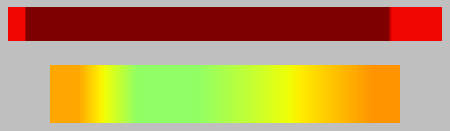

In [350]:
centers, _, _ = vis.calc_cell_tuning(model=model, trajectory=whole_track_layer, track=whole_track, kernel=np.ones((20)), 
                                               threshold=0., threshold_s=0.1, record=record,
                                               kernel2=np.ones((4, 4)))

edges, _ = utils.calc_edges_1d_nodes(nodes=centers)
vv = utils.calc_lattice_deviation_conv(edges=edges, window=8)

plt.figure(figsize=(7, 2))
plt.subplot(211)
plt.imshow(edges.reshape(1, -1), vmin=0, vmax=0.1)
plt.axis("off")
plt.subplot(212)
plt.imshow(vv.reshape(1, -1), vmin=0, vmax=0.1)
plt.axis("off");

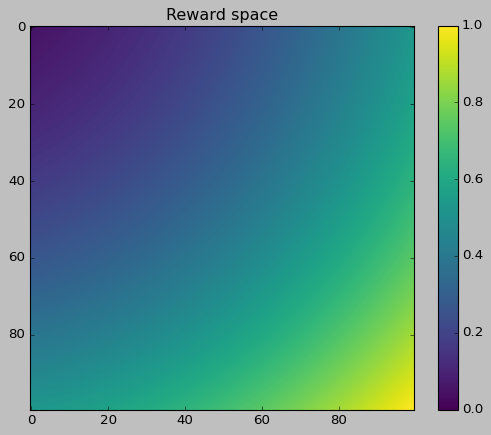

In [886]:
""" function over the environement """
rspace = utils.SalienceSpace(func=lambda x, y: (x+0.3)**2 + (y+0.3)**2)
#func = lambda x, y: (y>0.5)*y+0.001
#rspace = utils.SalienceSpace(func=func)

rspace.plot()

def da_policy(z, r):
    return (z > 0.5) 

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10201/10201 [00:00<00:00, 58717.59it/s]
2024-05-24 07:15:18 | whole_track.shape=(10201, 2)
2024-05-24 07:15:18 | trajectory.shape=(6001, 2)


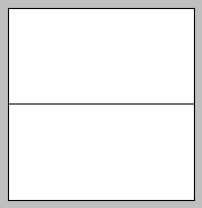

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10201/10201 [00:02<00:00, 4849.80it/s]


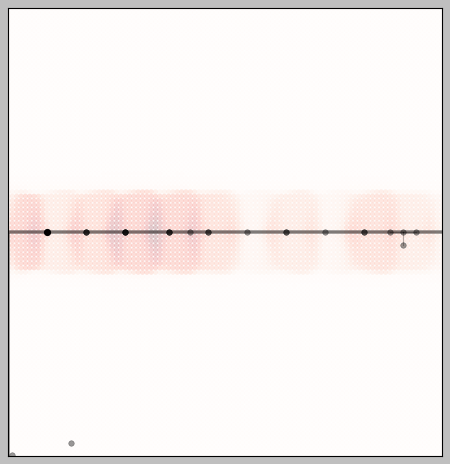

In [691]:
""" line env """
bounds = (0, 3, 0, 3)
layer = it.PlaceLayer(N=12**2, sigma=0.03, bounds=bounds)

trajectory, inputs, whole_track, whole_track_layer = utils.make_env(
    layer=layer, duration=None, speed=None, dt=None, distance=None, dx=5e-4,
             plot=True, verbose=True, bounds=bounds, line_env=True, 
    dx_whole=3e-2)

genome['DA_tau'] = 100
genome['tau'] = 100
genome['theta_freq'] = 0.007
genome['lr'] = 0.8

model, _ = utils.train_trajectory(N=100, params=genome.copy(), model_class=mm.PCNNetwork, 
                                  layer=layer, trajectory=trajectory, inputs=inputs, plotting=-1)

N = model.N
record = utils.train_whole_track(model=model, whole_track=whole_track, whole_track_layer=whole_track_layer)
fig2 = vis.plot_fields_trajectory(record=record, whole_track=whole_track, whole_track_layer=whole_track_layer,
                           trajectory=trajectory, model=model, knn_k=11, max_dist=0.1, bounds=bounds)

**Information**

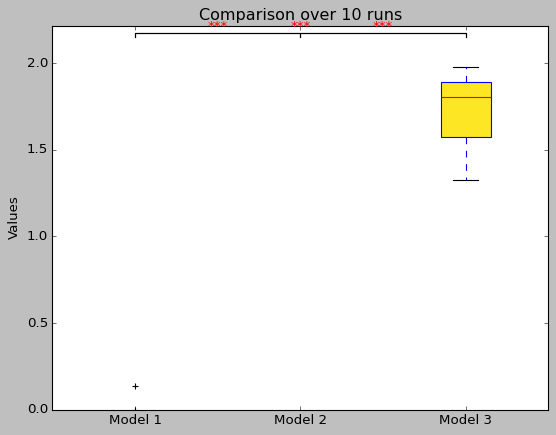

In [861]:
fig = utils.compare_models_multiruns(data=I2, yshift=0.0, plot_type="box")

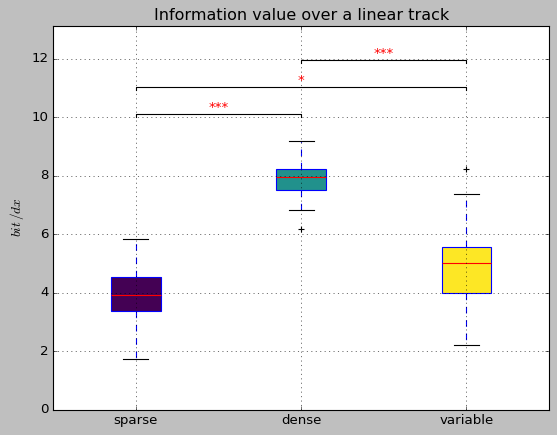

In [912]:
figu=utils.compare_models_multiruns(data=I, yshift=0.1, plot_type="box", label=("sparse", "dense", "variable"), ylabel="$bit\,/dx$", 
                                    title="Information value over a linear track")

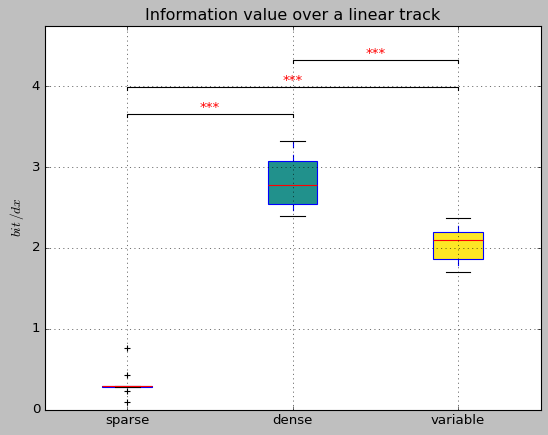

In [902]:
figu=utils.compare_models_multiruns(data=I3, yshift=0.1, plot_type="box", label=("sparse", "dense", "variable"), ylabel="$bit\,/dx$", title="Information value over a linear track")

In [881]:
I3 = np.abs(I2)

In [ ]:
info = utils.calc_information(model=model, trajectory=inputs, values=None)

In [910]:
""" general settings """
N = 40
bounds = (0, 3, 0, 3)
layer = it.PlaceLayer(N=15**2, sigma=0.03, bounds=bounds)

""" simulation settings """
nb = 2
s_values = np.linspace(0, 1, nb, endpoint=True)
nb += 1

labels = ["$lattice$"]
labels += ["fixed: $sparse$", "fixed: $dense$"]
labels += ["variable"]

# record
window = 8

centers = np.concatenate([np.linspace(0, bounds[1], 20).reshape(-1, 1), bounds[3]/2+np.zeros((20, 1))], axis=1)
edges, nodes = utils.calc_edges_1d_nodes(nodes=centers)
dev = utils.calc_lattice_deviation_conv(edges=edges, window=window)
s_record = [[edges, nodes, dev]]


""" run """


nb_sim = 23

I = np.zeros((3, nb_sim, 1))
I2 = np.zeros((3, nb_sim, 1))



for k in tqdm(range(nb_sim)):

    trajectory, inputs, whole_track, whole_track_layer = utils.make_env(
        layer=layer, duration=None, speed=None, dt=None, distance=4, dx=4e-4,
                 plot=False, verbose=False, bounds=bounds, line_env=False, 
        dx_whole=3e-2)

    for i in range(nb):
    
        if i == (nb-1):
            genome = silver_policy(s=0, genome=genome)
        else:
            genome = silver_policy(s=s_values[i], genome=genome)
    
        # train
        #model, _ = utils.train_trajectory(N=N, params=genome.copy(), model_class=mm.PCNNetwork, 
        #                                  layer=layer, trajectory=trajectory, inputs=inputs, plotting=-2)
    
        model, _ = utils.train_salient_trajectory(N=N, params=genome.copy(), model_class=mm.PCNNetwork, 
                                                       layer=layer, trajectory=trajectory, inputs=inputs,
                                                        salience_space=rspace, policy=da_policy, r=1,
                                                        verbose=False,
                                                        enable_policy=i == (nb-1))
    
        # field
        #record = utils.train_whole_track(model=model, whole_track=whole_track, whole_track_layer=whole_track_layer, verbose=False)
    
        # centers
        #centers, _, _ = vis.calc_cell_tuning(model=model, trajectory=whole_track_layer, track=whole_track, kernel=np.ones((20)), 
        #                                           threshold=0., threshold_s=0.1, record=record,
        #                                           kernel2=np.ones((4, 4)))
    
        # analyze
        #edges, nodes = utils.calc_edges_1d_nodes(nodes=centers)
        #dev = utils.calc_lattice_deviation_conv(edges=edges, window=window)
    
        #s_record += [[edges, nodes, dev]]
        idxs1, idxs2 = policy_on_centers(centers=trajectory, func=lambda x, y: int(y>0.5))


        # information
        info = utils.calc_information(model=model, trajectory=inputs, values=None)

        I[i, k, 0] = info.flatten().mean()
        I2[i, k, 0] = info.flatten()[idxs1].mean() - info.flatten()[idxs2].mean()           
            
            
        
logger("finished")


 83%|█████████████████████████████████████████████████████████████████████████████████████▉                  | 19/23 [04:24<00:53, 13.29s/it]/var/folders/77/b66qkr5d21l_3nnw6f563fw80000gp/T/ipykernel_36985/1530721817.py:78: RuntimeWarning: Mean of empty slice.
  I2[i, k, 0] = info.flatten()[idxs1].mean() - info.flatten()[idxs2].mean()
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 23/23 [05:11<00:00, 13.55s/it]
2024-05-24 12:03:28 | finished


#### **Search over different scenarios**

100%|███████████████████████████████████████████████████████████████████████████████████████████████| 10201/10201 [00:00<00:00, 91864.54it/s]
2024-05-24 11:55:39 | whole_track.shape=(10201, 2)
2024-05-24 11:55:39 | trajectory.shape=(15001, 2)


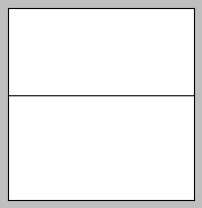

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:37<00:00, 12.35s/it]
2024-05-24 11:56:16 | finished


In [905]:
""" general settings """
N = 50
bounds = (0, 3, 0, 3)
layer = it.PlaceLayer(N=15**2, sigma=0.03, bounds=bounds)

""" simulation settings """
nb = 2
s_values = np.linspace(0, 1, nb, endpoint=True)
nb += 1

labels = ["$lattice$"]
labels += ["fixed: $sparse$", "fixed: $dense$"]
labels += ["variable"]

# record
window = 8

centers = np.concatenate([np.linspace(0, bounds[1], 20).reshape(-1, 1), bounds[3]/2+np.zeros((20, 1))], axis=1)
edges, nodes = utils.calc_edges_1d_nodes(nodes=centers)
dev = utils.calc_lattice_deviation_conv(edges=edges, window=window)
s_record = [[edges, nodes, dev]]

""" run """
trajectory, inputs, whole_track, whole_track_layer = utils.make_env(
    layer=layer, duration=None, speed=None, dt=None, distance=None, dx=2e-4,
             plot=True, verbose=True, bounds=bounds, line_env=True, 
    dx_whole=3e-2)

for i in tqdm(range(nb)):

    if i == (nb-1):
        genome = silver_policy(s=0, genome=genome)
    else:
        genome = silver_policy(s=s_values[i], genome=genome)

    # train
    #model, _ = utils.train_trajectory(N=N, params=genome.copy(), model_class=mm.PCNNetwork, 
    #                                  layer=layer, trajectory=trajectory, inputs=inputs, plotting=-2)

    model, _ = utils.train_salient_trajectory(N=N, params=genome.copy(), model_class=mm.PCNNetwork, 
                                                   layer=layer, trajectory=trajectory, inputs=inputs,
                                                    salience_space=rspace, policy=da_policy, r=1,
                                                    verbose=False,
                                                    enable_policy=i == (nb-1))

    # field
    record = utils.train_whole_track(model=model, whole_track=whole_track, whole_track_layer=whole_track_layer, verbose=False)

    # centers
    centers, _, _ = vis.calc_cell_tuning(model=model, trajectory=whole_track_layer, track=whole_track, kernel=np.ones((20)), 
                                               threshold=0., threshold_s=0.1, record=record,
                                               kernel2=np.ones((4, 4)))

    # analyze
    edges, nodes = utils.calc_edges_1d_nodes(nodes=centers)
    dev = utils.calc_lattice_deviation_conv(edges=edges, window=window)

    s_record += [[edges, nodes, dev]]
        
logger("finished")

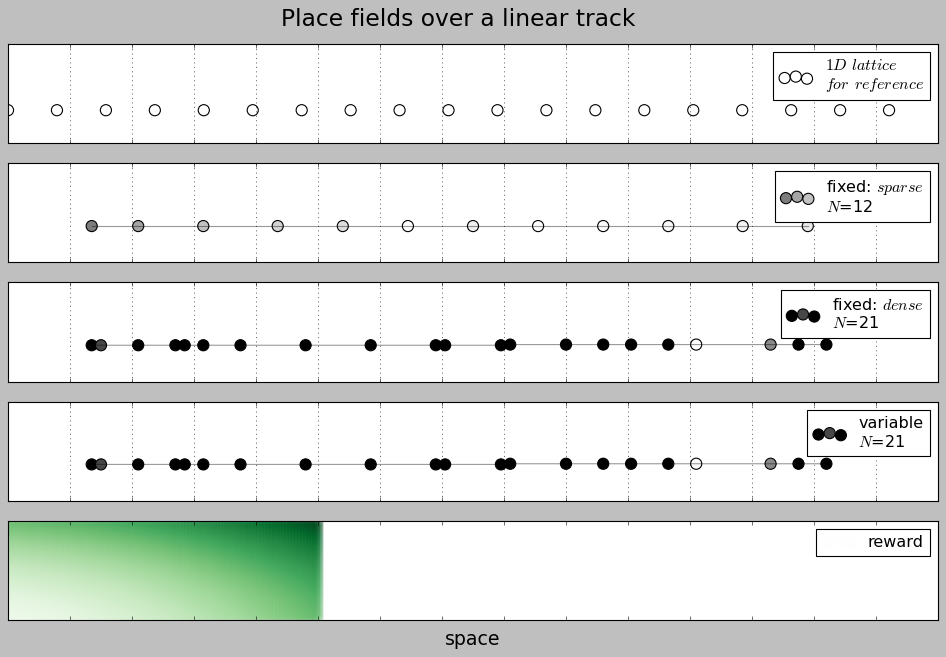

In [907]:
# plot

fig, axs = plt.subplots(nb+2, 1, figsize=(15, nb*3), sharex=True)
fig.suptitle("Place fields over a linear track", fontsize=21, y=0.95)

rspace.plot(points=True, ax=axs[-1])

for i, rec in enumerate(s_record):

    #col1, col2 = axs[i]
    col1 = axs[i]

    e, n, d = rec

        #col1.imshow(reward.reshape(int(np.sqrt(len(reward))), int(np.sqrt(len(reward)))), alpha=0.1)

    if i != 0:
        col1.plot(n[:, 0], n[:, 1], 'k-', alpha=0.4, lw=1)
    col1.scatter(n[:, 0], n[:, 1], c=d, marker="o", s=100, vmax=0.04, cmap="Greys", alpha=1,
                 label=f"{labels[i]}\n$N$={len(n)}" if i != 0 else f"$1D$ {labels[i]}\n$for\;\, reference$")
    
    
    col1.set_xlim((bounds[0], bounds[1]*1.))
    col1.set_ylim((0, bounds[3]*1.5))
    col1.set_yticks(())
    col1.set_xticks(np.arange(bounds[0], bounds[1], 0.2), ())
    
    if i == nb:
        xs = np.arange(bounds[0], bounds[1]*1., 0.01)
        cs = rspace.eval_trajectory(np.concatenate([xs.reshape(-1, 1), bounds[3]/2 * np.ones((len(xs), 1))], axis=1))[0]
        #col1.scatter(xs, [bounds[2]+0.2]*len(xs), c=cs+0.2, cmap="Greens", edgecolor="none", s=100, vmin=0, marker="o",
        #            label="reward")
    
    #col1.set_ylabel(labels[i], fontsize=15)
    col1.grid()
    col1.legend()
    #col2.imshow(d.reshape(1, -1), vmax=0.1)
    #col1.axis("off")
    
plt.xlabel("space", fontsize=17)
plt.show()

In [743]:
model._tau

2.0044489911328345

In [600]:
reward = rspace.eval_trajectory(whole_track)[0].reshape(

array([0.        , 0.        , 0.        , ..., 0.97979798, 0.98989899,
       1.        ])

In [591]:
fig34 = fig

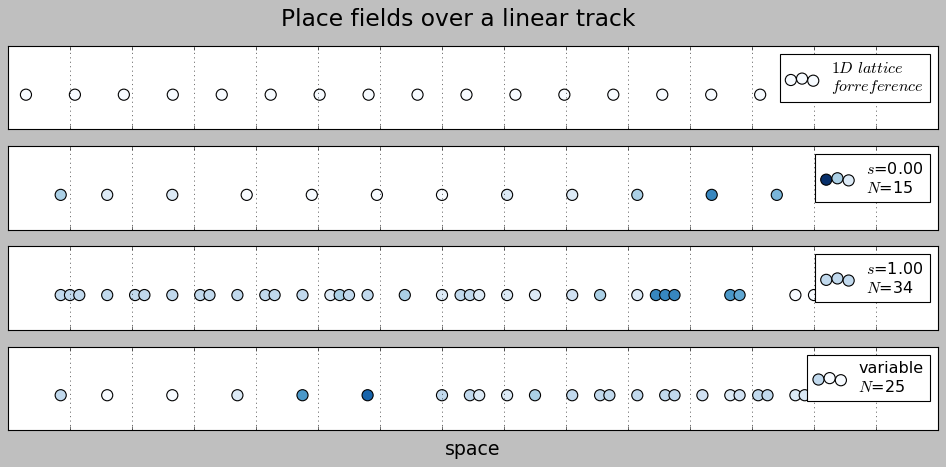

In [703]:
fig34

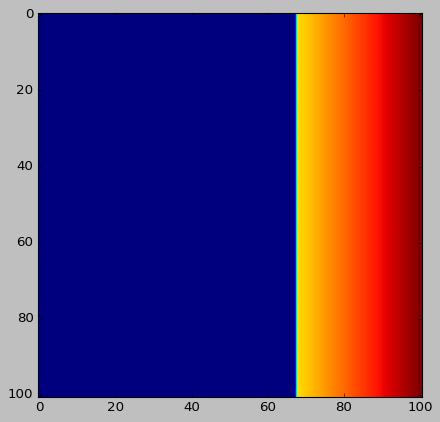

In [601]:
rspace = utils.SalienceSpace(bounds=bounds, func=lambda x, y: (x>2)*x)
reward = rspace.eval_trajectory(whole_track)[0]
plt.imshow(reward.reshape(int(np.sqrt(len(reward))), int(np.sqrt(len(reward)))));

In [792]:
fig89.savefig("/Users/daniekru/Documents/outreach/poster_may24/latt_a.png", transparent=True)

In [776]:
fig89=fig

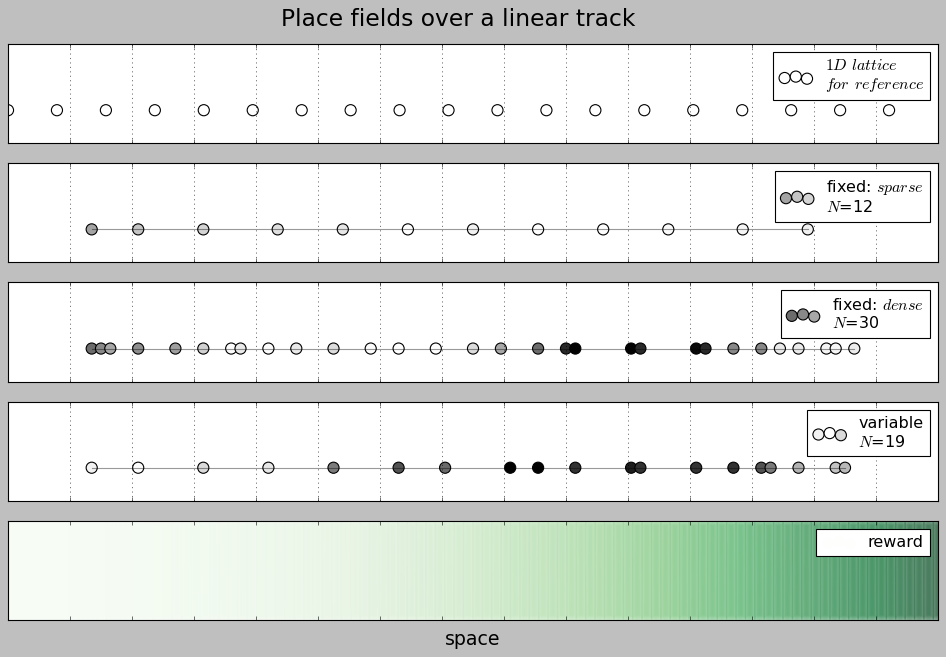

In [790]:
fig89

In [491]:
model._tau

100

In [472]:
rspace._reward.shape

(10000,)

In [ ]:
""" general settings """
N = 80
bounds = (0, 3, 0, 3)
layer = it.PlaceLayer(N=12**2, sigma=0.03, bounds=bounds)


""" simulation settings """
nb = 3
nb_sim = 25

nb = len(da_values)

# record
w = np.empty((nb_sim, nb))

""" run """
for l in tqdm(range(nb_sim)):

    trajectory, inputs, whole_track, whole_track_layer = utils.make_env(
             layer=layer, duration=None, speed=None, dt=None, distance=None, dx=5e-4,
             plot=False, verbose=False, bounds=bounds, line_env=True, 
             dx_whole=3e-2)
        
    for i, da_tau in enumerate(da_values):
        genome['tau'] = da_tau
    
        # trajectory training
        model, record = utils.train_trajectory(N=N, params=genome.copy(), model_class=mm.PCNNetwork, layer=layer,
                                               trajectory=trajectory, inputs=inputs, plotting=-2)
    
        # track training
        record = np.empty((N, len(whole_track)))
        model.set_off()
        for t, x in enumerate(whole_track_layer):
            model.step(x=x.reshape(-1, 1))   
            record[:, t] = model.u.flatten()
    
        attempt = 0
        success = False
        while attempt < 10:
            try:
                centers, _, _ = vis.calc_cell_tuning(model=model, trajectory=whole_track_layer, track=whole_track, kernel=np.ones((20)), 
                                               threshold=0., threshold_s=0.1, record=record,
                                               kernel2=np.ones((4, 4)))
                success = True
            except ValueError:
                logger.warning(f"{attempt=}")
            attempt += 1
    
        if not success:
            logger.error("failed")
            break
        y[l, i] = len(centers)
        
logger("u tau finished")

#### **PLOT** : _PC distribution_

In [11]:
L, M, W= utils.make_lattice(N=10)

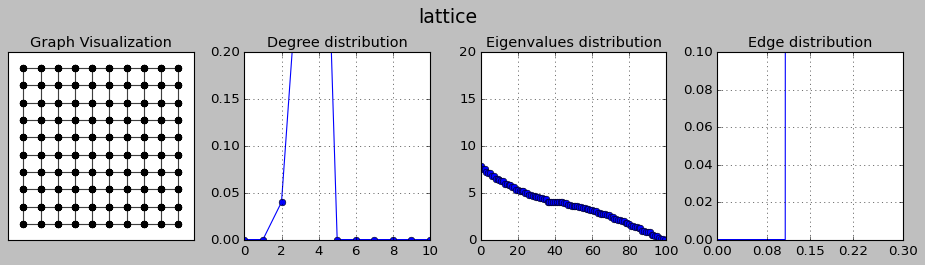

In [12]:
def plot_graph_analysis(nodes, edges, weights, title="", color=None, tr=None):
    fig, axs = plt.subplots(1, 4, figsize=(12, 3))
    fig.tight_layout(h_pad=10)
    if tr is not None:
        #color = (color.max() - color) / (color.max() - color.min())
        axs[0].scatter(tr[:, 0], tr[:, 1], c=color, cmap="plasma", s=10, alpha=0.1, edgecolor="none")#, vmin=0, vmax=1)
                       
    vis.plot_nodes_edges(centers=nodes, connectivity=edges, bounds=(-0.1, 1.1, -0.1, 1.1), ax=axs[0],
                        marker_size=0.1)
    
    _ = utils.calc_degree_distr(M=edges, ax=axs[1])
    Lap, ev = utils.calc_graph_laplacian(M=edges, ax=axs[2])
    #_ = utils.calc_clustering_coefficient(M=edges, ax=axs[3])
    _ = utils.calc_edge_distr(M=weights, ax=axs[3])

    fig.suptitle(title, fontsize=17, y=1.1)
    plt.show()

plot_graph_analysis(nodes=L, edges=M, weights=W, title="lattice")

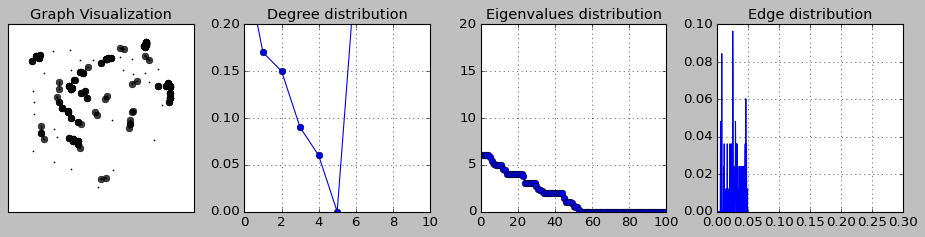

In [548]:
centers, _, _ = vis.calc_cell_tuning(model=model, trajectory=whole_track_layer, track=whole_track, kernel=np.ones((20)), 
                                     threshold=0., threshold_s=0.1, record=record,
                                     kernel2=np.ones((4, 4)))
connections, weights = utils.calc_knn(centers=centers, k=8, max_dist=0.05, return_weights=True)

plot_graph_analysis(nodes=centers, edges=connections, weights=weights)

**Plot for different values of $r$ (policy)**

In [40]:
def da_policy(z: float, r: float, thr=0.45):
    return int(z > thr) * r

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████| 40401/40401 [00:00<00:00, 86979.28it/s]
2024-05-22 07:19:33 | whole_track.shape=(40401, 2)
2024-05-22 07:19:33 | trajectory.shape=(9800, 2)


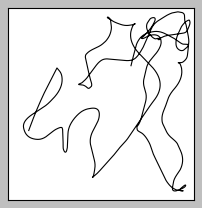

In [715]:
duration = 10
speed = 1e-3
dt = 1e-3
layer = it.PlaceLayer(N=13**2, sigma=0.01)

trajectory, inputs, whole_track, whole_track_layer = utils.make_env(
    layer=layer, duration=duration, speed=speed, dt=dt,
             plot=True, verbose=True)


In [481]:
trajectory[:, 0].shape

(9800,)

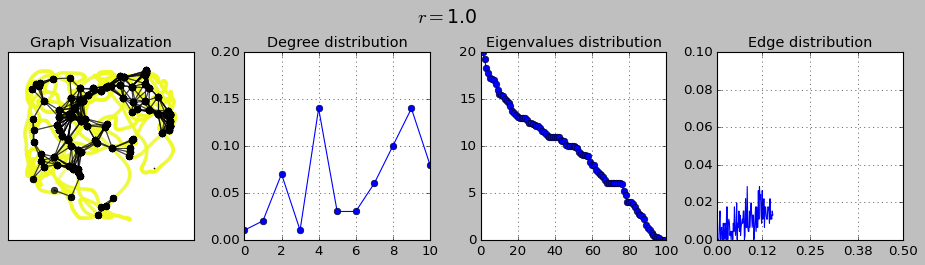

In [545]:
plot_graph_analysis(nodes=centers, edges=connections, weights=weights, title=f"$r=${r}",
                       color=rec[0], tr=trajectory)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 19800/19800 [00:32<00:00, 617.60it/s]


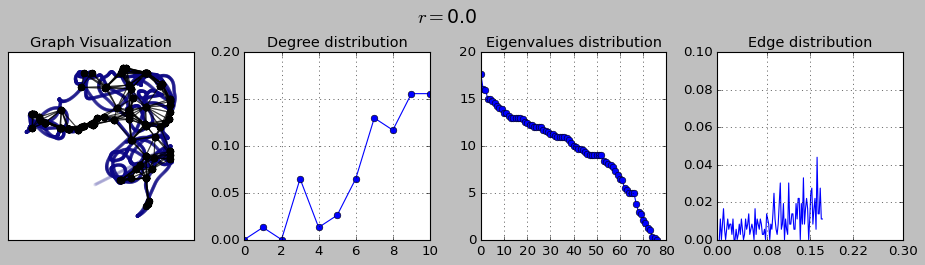

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 19800/19800 [00:35<00:00, 553.27it/s]


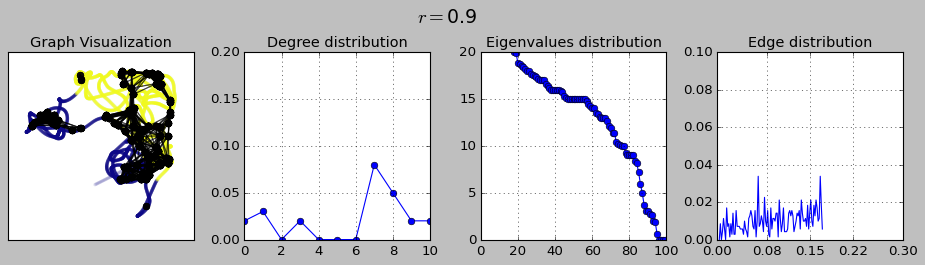

2024-05-22 05:01:48 | 


In [621]:
genome['DA_tau'] = 20

nb = 2
#r_set = np.linspace(0, 1, nb)
r_set = [0., 0.9]

records = {"N": [],
           "E": [],
           "W": [],
           "R": []}

for r in r_set:
    model, rec = utils.train_salient_trajectory(N=100, params=genome.copy(), model_class=mm.PCNNetwork, 
                                              layer=layer, trajectory=trajectory, inputs=inputs,
                                              salience_space=rspace, policy=da_policy, r=r, verbose=True)

    record = utils.train_whole_track(model=model, whole_track=whole_track, whole_track_layer=whole_track_layer, verbose=False)
    centers, _, _ = vis.calc_cell_tuning(model=model, trajectory=whole_track_layer, track=whole_track, kernel=np.ones((20)), 
                                         threshold=0., threshold_s=0.1, record=record,
                                         kernel2=np.ones((4, 4)))
    connections, weights = utils.calc_knn(centers=centers, k=None, max_dist=0.17, return_weights=True)
    
    plot_graph_analysis(nodes=centers, edges=connections, weights=weights, title=f"$r=${r}",
                       color=rec[0], tr=trajectory)

    records["N"] += [centers]
    records["E"] += [connections]
    records["W"] += [weights]
    records["R"] += [rec]

logger()

In [13]:
nb = 3
nb_sim = 20
#r_set = np.linspace(0, 1, nb)

duration = 10
speed = 5e-3
dt = 1.
layer = it.PlaceLayer(N=15**2, sigma=0.01)

#trajectory, inputs, whole_track, whole_track_layer = utils.make_env(
#    layer=layer, duration=duration, speed=speed, dt=dt,
#             plot=True, verbose=True)


vals = np.zeros((nb, nb_sim, 99))
dals = np.zeros((nb, nb_sim, 99))
lals = np.zeros((nb, nb_sim, 85))
lals = [[], [], []]

da_set = [10, 10, 100]
r_set = [0., 1., 1.]
p_set = [True, True, False]

changed = False

for k in tqdm(range(nb_sim)):

    trajectory, inputs, whole_track, whole_track_layer = utils.make_env(
    layer=layer, duration=duration, speed=speed, dt=dt, distance=8, dx=4e-4,
             plot=False, verbose=False)

    for i, r in enumerate(r_set):
        
        genome['DA_tau'] = da_set[i]

        #
        model, rec = utils.train_salient_trajectory(N=80, params=genome.copy(), model_class=mm.PCNNetwork, 
                                                   layer=layer, trajectory=trajectory, inputs=inputs,
                                                   salience_space=rspace, policy=da_policy, r=r, verbose=False,
                                                   enable_policy=p_set[i])

        #
        record = utils.train_whole_track(model=model, whole_track=whole_track, whole_track_layer=whole_track_layer, verbose=False)
        centers, _, _ = vis.calc_cell_tuning(model=model, trajectory=whole_track_layer, track=whole_track, kernel=np.ones((20)), 
                                             threshold=0., threshold_s=0.1, record=record,
                                             kernel2=np.ones((4, 4)))
        connections, weights = utils.calc_knn(centers=centers, k=None, max_dist=0.25, return_weights=True)

        #
        _, ev = utils.calc_graph_laplacian(M=connections, plot=None)
        v = utils.calc_edge_distr(M=weights, plot=None)
        d = utils.calc_degree_distr(M=connections, plot=None)

        #
        vals[i, k, :] = v.flatten()
        dals[i, k, :] = d.flatten()
        lals[i] += [list(ev)]
        continue
        '''try:
            lals[i, k, :] = ev.flatten()
        except ValueError:
            if changed:
                logger.error("already changed: compromised")
            logger.warning(f"`lals` shape changed to {ev.shape[0]}")
            lals = np.zeros((nb, nb_sim, ev.shape[0]))
            lals[i, k, :] = ev.flatten()
            changed = True'''



logger()

  0%|                                                                                                           | 0/20 [00:22<?, ?it/s]


AttributeError: 'tuple' object has no attribute 'flatten'

In [45]:
ev.shape

(4,)

In [1146]:
_, ev = utils.calc_graph_laplacian(M=connections, plot=None)
connections.shape

(86, 86)

In [714]:
_, ev = utils.calc_graph_laplacian(M=connections, plot=None)
ev.shape

(100,)

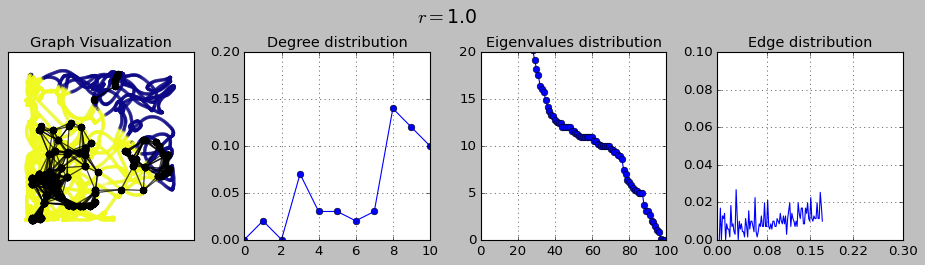

In [713]:
#record = utils.train_whole_track(model=model, whole_track=whole_track, whole_track_layer=whole_track_layer, verbose=False)
centers, _, _ = vis.calc_cell_tuning(model=model, trajectory=whole_track_layer, track=whole_track, kernel=np.ones((20)), 
                                     threshold=0.1, threshold_s=0., record=record,
                                     kernel2=np.ones((4, 4)))
connections, weights = utils.calc_knn(centers=centers, k=None, max_dist=0.17, return_weights=True)

plot_graph_analysis(nodes=centers, edges=connections, weights=weights, title=f"$r=${r}",
                   color=rec[0], tr=trajectory)

In [59]:
v3 = vals[0]
v4 = vals[1]
v5 = vals[2]
d3 = dals[0]
d4 = dals[1]
d5 = dals[2]
l3 = lals[0]
l4 = lals[1]
l5 = lals[2]

In [62]:
K = 10
mu3 = utils.moving_avg(v3.mean(axis=0), K)
s3 = utils.moving_avg(v3.std(axis=0), K)
mu4 = utils.moving_avg(v4.mean(axis=0), K)
s4 = utils.moving_avg(v4.std(axis=0), K)
mu5 = utils.moving_avg(v5.mean(axis=0), K)
s5 = utils.moving_avg(v5.std(axis=0), K)

mu3d = utils.moving_avg(d3.mean(axis=0), K)
s3d = utils.moving_avg(d3.std(axis=0), K)
mu4d = utils.moving_avg(d4.mean(axis=0), K)
s4d = utils.moving_avg(d4.std(axis=0), K)
mu5d = utils.moving_avg(d5.mean(axis=0), K)
s5d = utils.moving_avg(d5.std(axis=0), K)

#mu3l = utils.moving_avg(l3.mean(axis=0), K)
#s3l = utils.moving_avg(l3.std(axis=0), K)
#mu4l = utils.moving_avg(l4.mean(axis=0), K)
#s4l = utils.moving_avg(l4.std(axis=0), K)
#mu5l = utils.moving_avg(l5.mean(axis=0), K)
#s5l = utils.moving_avg(l5.std(axis=0), K)

In [61]:
mu3l = utils.moving_avg(l3[0], K)
s3l = utils.moving_avg(l3[0], K)
mu4l = utils.moving_avg(l4[1], K)
s4l = utils.moving_avg(l4[1], K)
mu5l = utils.moving_avg(l5[2], K)
s5l = utils.moving_avg(l5[2], K)

In [1189]:
e[K:].shape

(89,)

In [72]:
e

array([0.        , 0.00358423, 0.00358423, 0.        , 0.00716846,
       0.        , 0.        , 0.19354839, 0.00358423, 0.00716846,
       0.        , 0.        , 0.18996416, 0.        , 0.        ,
       0.        , 0.00358423, 0.01433692, 0.        , 0.00716846,
       0.00358423, 0.00358423, 0.        , 0.01075269, 0.00358423,
       0.00358423, 0.00358423, 0.01075269, 0.        , 0.00358423,
       0.        , 0.01075269, 0.00716846, 0.01075269, 0.01075269,
       0.00358423, 0.        , 0.00358423, 0.        , 0.        ,
       0.00358423, 0.01792115, 0.00716846, 0.00358423, 0.00358423,
       0.00716846, 0.        , 0.00716846, 0.00358423, 0.00358423,
       0.00358423, 0.01075269, 0.00358423, 0.00716846, 0.00358423,
       0.00358423, 0.00358423, 0.01075269, 0.00716846, 0.00716846,
       0.        , 0.01075269, 0.00358423, 0.00358423, 0.00716846,
       0.01075269, 0.00358423, 0.01433692, 0.01075269, 0.00358423,
       0.00358423, 0.01075269, 0.        , 0.00716846, 0.01075

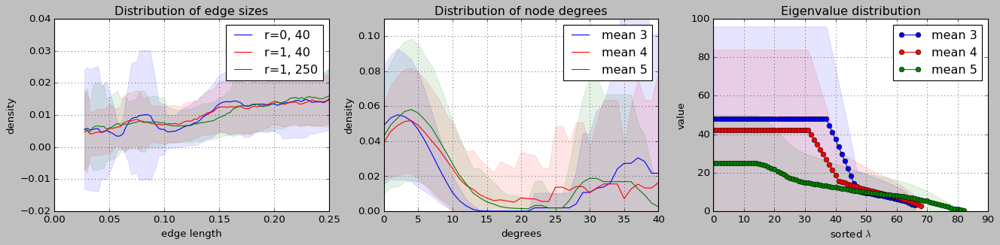

In [74]:
#mu = y.mean(axis=0)
#std = y.std(axis=0)

fig, axs = plt.subplots(1, 3, figsize=(20, 4))

axs[0].plot(e[K-1:], mu3, "-", color="blue", label="r=0, 40", alpha=1.)
axs[0].fill_between(e[K-1:], mu3 - s3, 
                 mu3 + s3,
                 color="b", alpha=0.1)
axs[0].plot(e[K-1:], mu4, "-", color="red", label="r=1, 40", alpha=1.)
axs[0].fill_between(e[K-1:], mu4 - s4, 
                 mu4 + s4,
                 color="red", alpha=0.1)
axs[0].plot(e[K-1:], mu5, "-", color="green", label="r=1, 250", alpha=1.)
axs[0].fill_between(e[K-1:], mu5 - s5, 
                 mu5 + s5,
                 color="green", alpha=0.1)

axs[0].set_xlabel("edge length")
axs[0].set_ylabel("density")
#plt.ylim((0, y.max()*1.1))
#plt.xlim((0, da_values.max()*1.025))
axs[0].legend()
axs[0].grid()
axs[0].set_title(f"Distribution of edge sizes")

#mu = y.mean(axis=0)
#std = y.std(axis=0)

axs[1].plot(range(99-K+1), mu3d, "-", color="blue", label="mean 3", alpha=1.)
axs[1].fill_between(range(99-K+1), mu3d - s3d, mu3d + s3d,
                 color="b", alpha=0.1)
axs[1].plot(range(99-K+1), mu4d, "-", color="red", label="mean 4", alpha=1.)
axs[1].fill_between(range(99-K+1), mu4d - s4d, mu4d + s4d,
                 color="red", alpha=0.1)
axs[1].plot(range(99-K+1), mu5d, "-", color="green", label="mean 5", alpha=1.)
axs[1].fill_between(range(99-K+1), mu5d - s5d, mu5d + s5d,
                 color="green", alpha=0.1)


axs[1].set_xlabel("degrees")
axs[1].set_ylabel("density")
axs[1].set_ylim((0, 0.11))
axs[1].set_xlim((0, 40))
axs[1].legend()
axs[1].grid()
axs[1].set_title(f"Distribution of node degrees")


axs[2].plot(range(len(mu3l)), mu3l, "o-", color="blue", label="mean 3", alpha=1.)
axs[2].fill_between(range(len(mu3l)), mu3l - s3l, mu3l + s3l,
                 color="b", alpha=0.1)
axs[2].plot(range(len(mu4l)), mu4l, "o-", color="red", label="mean 4", alpha=1.)
axs[2].fill_between(range(len(mu4l)), mu4l - s4l, mu4l + s4l,
                 color="red", alpha=0.1)
axs[2].plot(range(len(mu5l)), mu5l, "o-", color="green", label="mean 5", alpha=1.)
axs[2].fill_between(range(len(mu5l)), mu5l - s5l, mu5l + s5l,
                 color="green", alpha=0.1)


axs[2].set_xlabel("sorted $\lambda$")
axs[2].set_ylabel("value")
#plt.ylim((0, 0.11))
#plt.xlim((0, 40))
axs[2].legend()
axs[2].grid()
axs[2].set_title(f"Eigenvalue distribution")


plt.show()


In [1228]:
fig.savefig(r"/Users/daniekru/Documents/outreach/poster_may24/three_plots.svg")

Text(0.5, 1.0, 'Distribution of degrees')

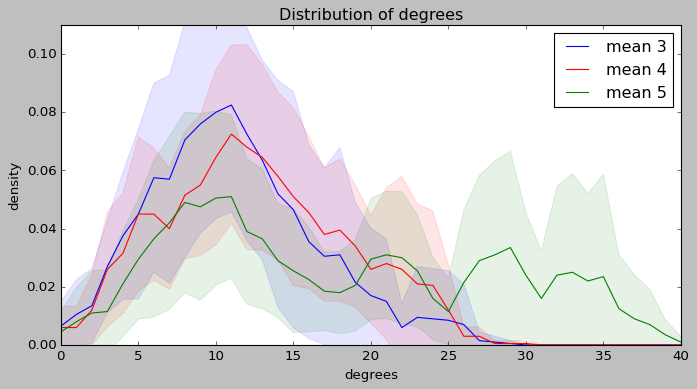

In [1205]:
#mu = y.mean(axis=0)
#std = y.std(axis=0)

fig = plt.figure(figsize=(10, 5))

plt.plot(range(99-K+1), mu3d, "-", color="blue", label="mean 3", alpha=1.)
plt.fill_between(range(99-K+1), mu3d - s3d, mu3d + s3d,
                 color="b", alpha=0.1)
plt.plot(range(99-K+1), mu4d, "-", color="red", label="mean 4", alpha=1.)
plt.fill_between(range(99-K+1), mu4d - s4d, mu4d + s4d,
                 color="red", alpha=0.1)
plt.plot(range(99-K+1), mu5d, "-", color="green", label="mean 5", alpha=1.)
plt.fill_between(range(99-K+1), mu5d - s5d, mu5d + s5d,
                 color="green", alpha=0.1)


plt.xlabel("degrees")
plt.ylabel("density")
plt.ylim((0, 0.11))
plt.xlim((0, 40))
plt.legend()
plt.grid()
plt.title(f"Distribution of degrees")

plt.xlabel("degrees")
plt.ylabel("density")
plt.ylim((0, 0.11))
plt.xlim((0, 40))
plt.legend()
plt.grid()
plt.title(f"Distribution of degrees")

In [1207]:
mu3l.shape

(82,)

Text(0.5, 1.0, 'Distribution of degrees')

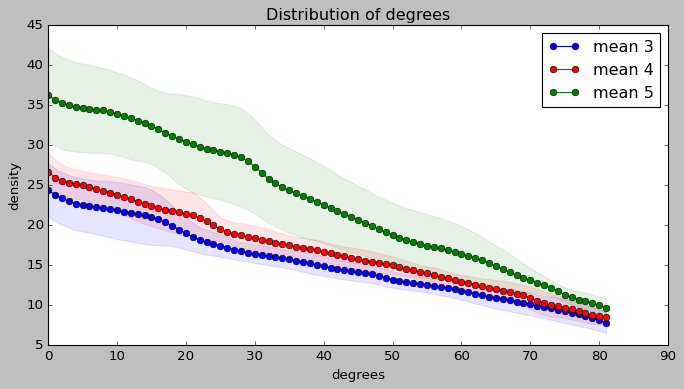

In [1210]:
#mu = y.mean(axis=0)
#std = y.std(axis=0)

fig = plt.figure(figsize=(10, 5))

plt.plot(range(85-K+1), mu3l, "o-", color="blue", label="mean 3", alpha=1.)
plt.fill_between(range(85-K+1), mu3l - s3l, mu3l + s3l,
                 color="b", alpha=0.1)
plt.plot(range(85-K+1), mu4l, "o-", color="red", label="mean 4", alpha=1.)
plt.fill_between(range(85-K+1), mu4l - s4l, mu4l + s4l,
                 color="red", alpha=0.1)
plt.plot(range(85-K+1), mu5l, "o-", color="green", label="mean 5", alpha=1.)
plt.fill_between(range(85-K+1), mu5l - s5l, mu5l + s5l,
                 color="green", alpha=0.1)


plt.xlabel("degrees")
plt.ylabel("density")
#plt.ylim((0, 0.11))
#plt.xlim((0, 40))
plt.legend()
plt.grid()
plt.title(f"Distribution of degrees")

plt.xlabel("degrees")
plt.ylabel("density")
#plt.ylim((0, 0.11))
#plt.xlim((0, 40))
plt.legend()
plt.grid()
plt.title(f"Distribution of degrees")

---

Text(0.5, 1.0, 'Distribution of edge sizes')

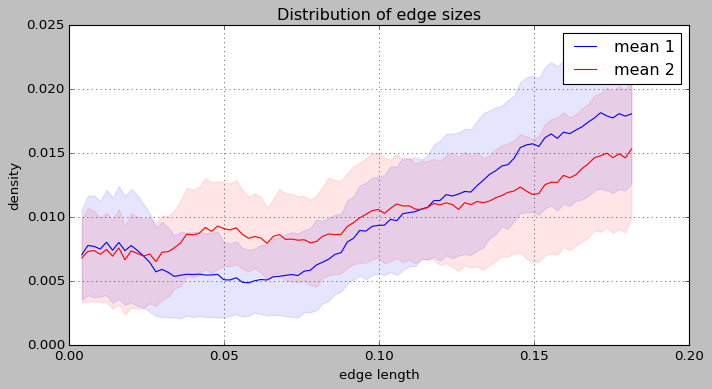

In [699]:
#mu = y.mean(axis=0)
#std = y.std(axis=0)

fig = plt.figure(figsize=(10, 5))
K = 10
plt.plot(e[:-(K-1)], utils.moving_avg(mu1, K), "-", color="blue", label="mean 1", alpha=1.)
plt.fill_between(e[:-(K-1)], utils.moving_avg(mu1, K) - utils.moving_avg(s1, K), 
                 utils.moving_avg(mu1, K) + utils.moving_avg(s1, K),
                 color="b", alpha=0.1)
plt.plot(e[:-(K-1)], utils.moving_avg(mu2, K), "-", color="red", label="mean 2", alpha=1.)
plt.fill_between(e[:-(K-1)], utils.moving_avg(mu2, K) - utils.moving_avg(s1, K), 
                 utils.moving_avg(mu2, K) + utils.moving_avg(s2, K),
                 color="red", alpha=0.1)

plt.xlabel("edge length")
plt.ylabel("density")
#plt.ylim((0, y.max()*1.1))
#plt.xlim((0, da_values.max()*1.025))
plt.legend()
plt.grid()
plt.title(f"Distribution of edge sizes")

Text(0.5, 1.0, 'Distribution of edge sizes')

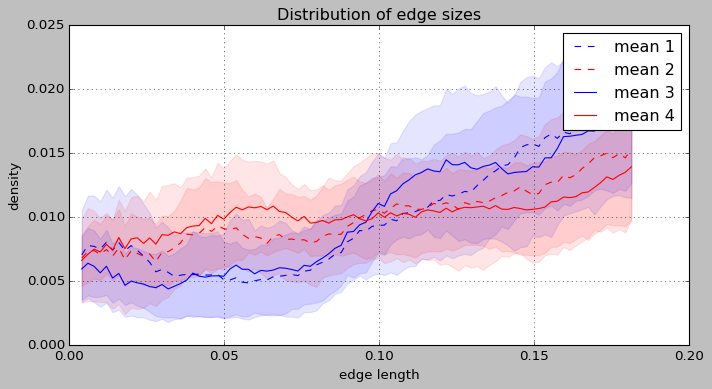

In [710]:
#mu = y.mean(axis=0)
#std = y.std(axis=0)

fig = plt.figure(figsize=(10, 5))
K = 10


plt.plot(e[:-(K-1)], utils.moving_avg(mu1, K), "--", color="blue", label="mean 1", alpha=1.)
plt.fill_between(e[:-(K-1)], utils.moving_avg(mu1, K) - utils.moving_avg(s1, K), 
                 utils.moving_avg(mu1, K) + utils.moving_avg(s1, K),
                 color="b", alpha=0.1)
plt.plot(e[:-(K-1)], utils.moving_avg(mu2, K), "--", color="red", label="mean 2", alpha=1.)
plt.fill_between(e[:-(K-1)], utils.moving_avg(mu2, K) - utils.moving_avg(s1, K), 
                 utils.moving_avg(mu2, K) + utils.moving_avg(s2, K),
                 color="red", alpha=0.1)
plt.plot(e[:-(K-1)], utils.moving_avg(mu3, K), "-", color="blue", label="mean 3", alpha=1.)
plt.fill_between(e[:-(K-1)], utils.moving_avg(mu3, K) - utils.moving_avg(s3, K), 
                 utils.moving_avg(mu3, K) + utils.moving_avg(s3, K),
                 color="b", alpha=0.1)
plt.plot(e[:-(K-1)], utils.moving_avg(mu4, K), "-", color="red", label="mean 4", alpha=1.)
plt.fill_between(e[:-(K-1)], utils.moving_avg(mu4, K) - utils.moving_avg(s4, K), 
                 utils.moving_avg(mu4, K) + utils.moving_avg(s4, K),
                 color="red", alpha=0.1)


plt.xlabel("edge length")
plt.ylabel("density")
#plt.ylim((0, y.max()*1.1))
#plt.xlim((0, da_values.max()*1.025))
plt.legend()
plt.grid()
plt.title(f"Distribution of edge sizes")

Text(0.5, 1.0, 'Distribution of degrees')

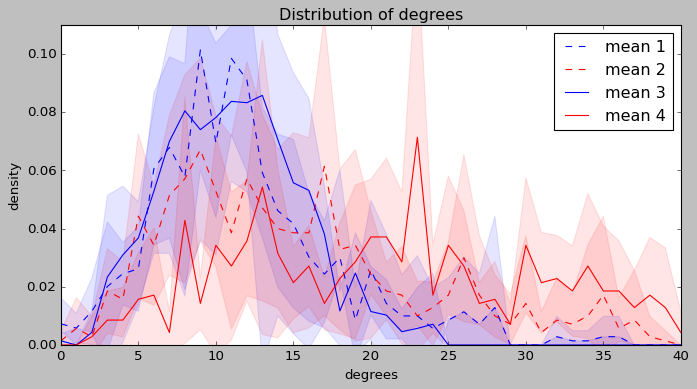

In [712]:
#mu = y.mean(axis=0)
#std = y.std(axis=0)

fig = plt.figure(figsize=(10, 5))

plt.plot(range(99), mu1d, "--", color="blue", label="mean 1", alpha=1.)
plt.fill_between(range(99), mu1d - s1d, mu1d + s1d,
                 color="b", alpha=0.1)
plt.plot(range(99), mu2d, "--", color="red", label="mean 2", alpha=1.)
plt.fill_between(range(99), mu2d - s2d, mu2d + s2d,
                 color="red", alpha=0.1)
#mu = y.mean(axis=0)
#std = y.std(axis=0)

plt.plot(range(99), mu3d, "-", color="blue", label="mean 3", alpha=1.)
plt.fill_between(range(99), mu1d - s3d, mu3d + s3d,
                 color="b", alpha=0.1)
plt.plot(range(99), mu4d, "-", color="red", label="mean 4", alpha=1.)
plt.fill_between(range(99), mu4d - s4d, mu4d + s4d,
                 color="red", alpha=0.1)

plt.xlabel("degrees")
plt.ylabel("density")
plt.ylim((0, 0.11))
plt.xlim((0, 40))
plt.legend()
plt.grid()
plt.title(f"Distribution of degrees")

plt.xlabel("degrees")
plt.ylabel("density")
plt.ylim((0, 0.11))
plt.xlim((0, 40))
plt.legend()
plt.grid()
plt.title(f"Distribution of degrees")

In [680]:
s2d

array([0.00349927, 0.01049781, 0.00699854, 0.01456863, 0.01293626,
       0.02821203, 0.02060315, 0.02747912, 0.03574285, 0.03149344,
       0.02602981, 0.03313547, 0.04025429, 0.03194383, 0.02725541,
       0.03440456, 0.03270149, 0.05138887, 0.02762726, 0.03288818,
       0.02194613, 0.00989743, 0.01665986, 0.01195229, 0.00880631,
       0.01829464, 0.03545621, 0.02050386, 0.01414214, 0.01030158,
       0.02321154, 0.00728431, 0.01456863, 0.01030158, 0.0244949 ,
       0.02710524, 0.01049781, 0.01726149, 0.00699854, 0.00349927,
       0.        , 0.00699854, 0.00349927, 0.01049781, 0.        ,
       0.        , 0.00349927, 0.00699854, 0.00699854, 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.     

In [655]:
d = utils.calc_degree_distr(M=connections, plot=False)


#### **PLOT** : _information content_

100%|█████████████████████████████████████████████████████████████████████████████████████████| 40401/40401 [00:00<00:00, 99712.24it/s]
2024-05-23 04:15:36 | whole_track.shape=(40401, 2)
2024-05-23 04:15:36 | trajectory.shape=(9700, 2)


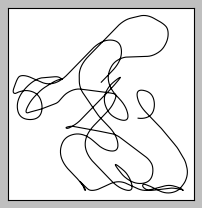

In [296]:
""" trajectory """
duration = 10
speed = 5e-3
dt = 1e-0
#genome["dt"] = dt
genome["speed"] = speed

layer = it.PlaceLayer(N=14**2, sigma=0.01)

trajectory, inputs, whole_track, whole_track_layer = utils.make_env(
    layer=layer, duration=duration, speed=speed, dt=dt,
             plot=True, verbose=True)


In [315]:
""" calc """
N = 100
#genome['DA_tau'] = 30
duration = 5
speed = 5e-3

da_set = [10, 30, 200, None]

nb = len(da_set)
nb_sim = 15

values = np.zeros((nb, nb_sim, 1))

for k in tqdm(range(nb_sim)):

    trajectory, inputs, whole_track, whole_track_layer = utils.make_env(
            layer=layer, duration=duration, speed=speed, dt=1.,
             plot=False, verbose=False)

    for i, da_tau in enumerate(da_set):

        if da_tau is None:
            values[i, k, 0] = utils.calc_information_layer(layer=layer, trajectory=trajectory).mean()
            continue

        genome['DA_tau'] = da_tau
        model, _ = utils.train_trajectory(N=N, params=genome.copy(), model_class=mm.PCNNetwork, 
                                          layer=layer, trajectory=trajectory, inputs=inputs)
    
        values[i, k, 0] = utils.calc_information(model=model, trajectory=inputs).mean()
logger()

100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [07:25<00:00, 29.72s/it]


/Users/daniekru/Research/lab/PCNN/src/utils.py:630: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(0, 1.02 * y_top)


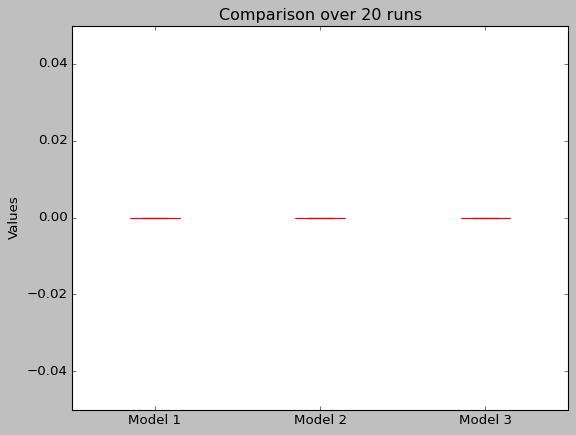

In [432]:
fig = utils.compare_models_multiruns(data=values[:-1], yshift=0.05, plot_type="box")

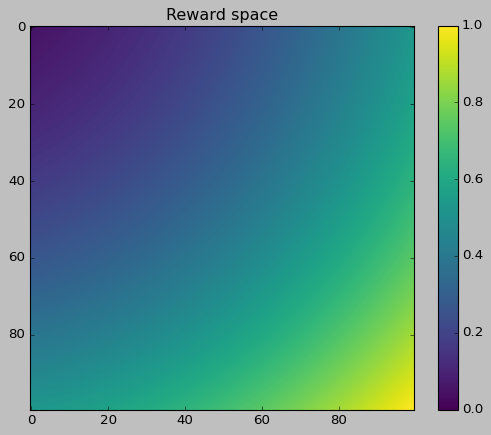

In [4]:
""" function over the environement """
rspace = utils.SalienceSpace(func=lambda x, y: (x+0.3)**2 + (y+0.3)**2)
#func = lambda x, y: (y>0.5)*y+0.001
#rspace = utils.SalienceSpace(func=func)

rspace.plot()

def da_policy(z, r):
    return (z > 0.) * r

In [822]:
""" general settings """
N = 100
bounds = (0, 3, 0, 3)
layer = it.PlaceLayer(N=15**2, sigma=0.03, bounds=bounds)

""" with reward """
genome['theta_freq'] = 0.01
genome['is_retuning'] = True
genome['theta_freq_increase'] = 0
genome['gain'] = 6
genome['bias'] = 0.9
genome['DA_tau'] = 200

#genome['DA_tau'] = 30
duration = 10
speed = 5e-3

da_set = [1, 1, 0]
ep_set = [False, True, False]
r_set = [0, 1, 1]

#dau_set = [(5, 5), (5, 100), (100, 5), (100, 100), None]

#nb = len(da_set)
nb = len(da_set)

nb_sim = 20

values = np.zeros((nb, nb_sim, 1))
dalues = np.zeros((nb, nb_sim, 1))
s_values = [0, 0, 1]

layer_bench = it.PlaceLayer(N=10**2, sigma=0.009)
layer = it.PlaceLayer(N=13**2, sigma=0.01)

R = {}


for k in tqdm(range(nb_sim)):

    trajectory, inputs, whole_track, whole_track_layer = utils.make_env(
                        layer=layer, duration=None, speed=None, dt=None, distance=None, dx=2e-4,
                     plot=False, verbose=False, bounds=bounds, line_env=True, dx_whole=3e-2)
    
    
    idxs1, idxs2 = policy_on_centers(centers=trajectory, func=lambda x, y: int(y>0.5))

    for i in range(nb):

        if i == (nb-1):
            genome = silver_policy(s=0, genome=genome)
        else:
            genome = silver_policy(s=s_values[i], genome=genome)
    
        # train
        model, _ = utils.train_salient_trajectory(N=N, params=genome.copy(), model_class=mm.PCNNetwork, 
                                                       layer=layer, trajectory=trajectory, inputs=inputs,
                                                        salience_space=rspace, policy=da_policy, r=1,
                                                        verbose=False,
                                                        enable_policy=i == (nb-1))

    
        info = utils.calc_information(model=model, trajectory=inputs, values=None)
        values[i, k, 0] = info.mean()
        dalues[i, k, 0] = abs(info[idxs1].mean() - info[idxs2].mean())

        #R[f"{i}.{da_tau}"] = [info[idxs1].mean(), info[idxs2].mean()]

logger()

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [12:16<00:00, 36.81s/it]
2024-05-24 10:14:45 | 


In [833]:
genome

{'gain': 6,
 'bias': 0.9,
 'lr': 0.8,
 'tau': 100,
 'wff_min': 0.0,
 'wff_max': 0.1,
 'wff_tau': 2000,
 'soft_beta': 1.7,
 'beta_clone': 0.3,
 'low_bounds_nb': 5,
 'DA_tau': 100,
 'bias_decay': 120,
 'bias_scale': 0.84,
 'IS_magnitude': 40,
 'theta_freq': 0.007,
 'theta_freq_increase': 0,
 'sigma_gamma': 9.1e-05,
 'nb_per_cycle': 5,
 'nb_skip': 1,
 'dt': 1,
 'speed': 0.0005,
 'sigma_pc': 0.00251,
 'sigma_bc': 0.005,
 'N': 20,
 'Nj': 121,
 'is_retuning': True,
 'plastic': True,
 'u_trace_decay': 2}

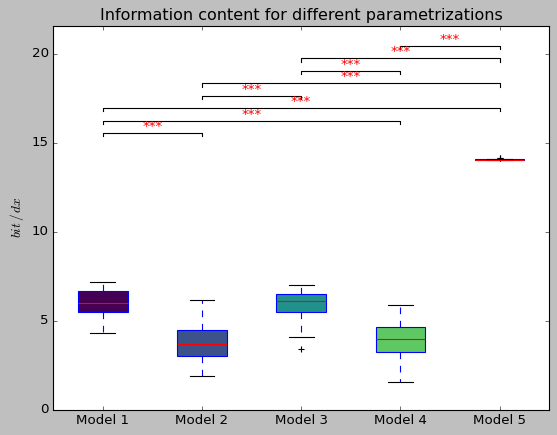

In [41]:
fig2 = utils.compare_models_multiruns(data=values, yshift=0.05, plot_type="box", ylabel="$bit\,/\,dx$", title="Information content for different parametrizations") #label=["$\\tau_{DA}$=" + f"{ds[0]},$\\tau_u$={ds[1]}" if ds is not None else "ref" for ds in dau_set])

In [43]:
fig2.savefig("/Users/daniekru/Documents/outreach/poster_may24/inform_c.svg", transparent=True)

---

/Users/daniekru/Research/lab/PCNN/src/utils.py:724: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(0, 1.02 * y_top)


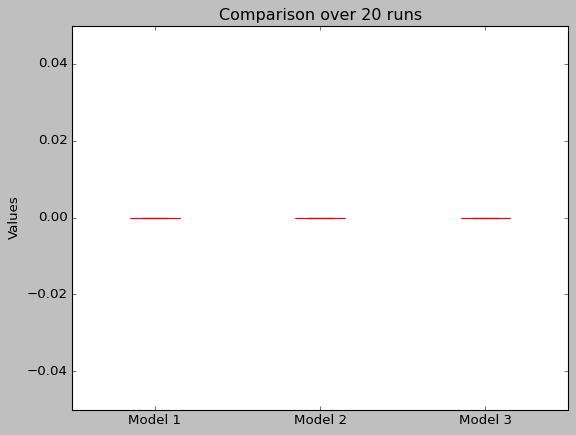

In [825]:
fig33 = utils.compare_models_multiruns(data=dalues, yshift=0.05, plot_type="box")

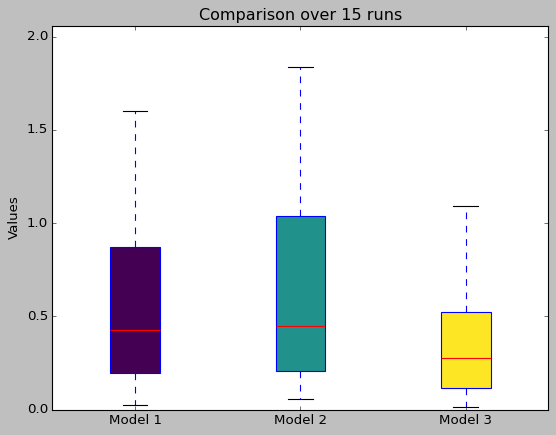

In [818]:
fig3 = utils.compare_models_multiruns(data=dalues, yshift=0.05, plot_type="box")

In [590]:
dalues[1]

array([[2.71151307],
       [3.17521289],
       [3.77555504],
       [3.12316794],
       [3.77897597],
       [2.33985825],
       [4.48409219],
       [3.63654516],
       [3.25330247],
       [4.81610154]])

In [629]:
aa = np.zeros(len(trajectory))
aa[idxs1] = 1

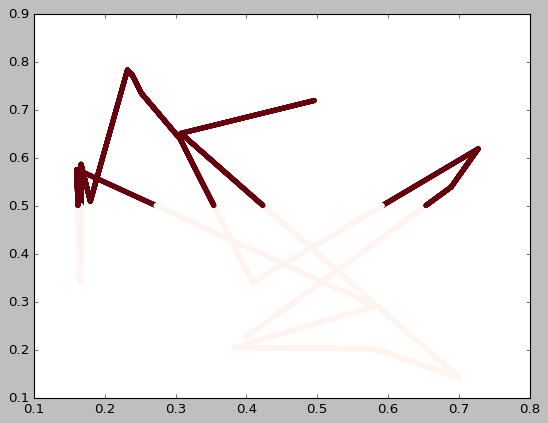

In [630]:
kk = 100
plt.scatter(trajectory[:-kk, 0], trajectory[:-kk, 1], c=aa[:-kk], cmap="Reds", edgecolor="none");

#### quick insights

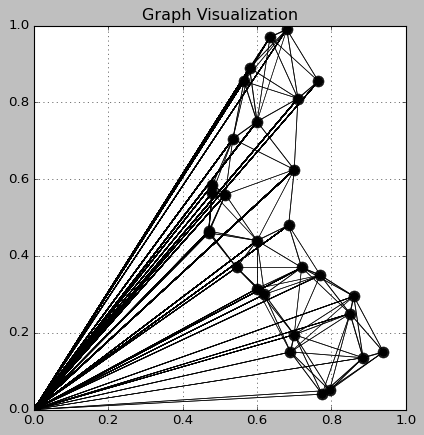

In [115]:
_, connectivity = plot_centers(model=model, trajectory=whole_track_layer, track=whole_track, kernel=np.ones((20)), 
                 threshold=0.0, threshold_s=0.2,
                 ax=None, record=record, kernel2=np.ones((4, 4)))

In [119]:
model.W_rec[2]

array([0.69998781, 0.70023641, 0.        , 0.76794378, 0.93634325,
       0.96637811, 0.95606409, 0.        , 0.65031807, 0.76282629,
       0.        , 0.93651742, 0.81829431, 0.        , 0.57077036,
       0.81671608, 0.        , 0.8953528 , 0.        , 0.90085061,
       0.        , 0.89528494, 0.9025094 , 0.        , 0.90876799,
       0.        , 0.        , 0.89738729, 0.92866414, 0.92964605,
       0.        , 0.92517471, 0.93454136, 0.72315967, 0.        ,
       0.8205255 , 0.90129612, 0.92087461, 0.92084903, 0.88532572,
       0.        , 0.8999952 , 0.93576307, 0.92658293, 0.        ,
       0.77538705, 0.88539651, 0.94484668, 0.85917512, 0.81365878,
       0.58592817, 0.77753764, 0.81303298, 0.95450434, 0.57365474,
       0.93651742, 0.98215576, 0.93651749, 0.93651742, 0.70705342,
       0.95028191, 0.98195727, 0.9760343 , 0.95107626, 0.94871211,
       0.96862273, 0.95076573, 0.95038032, 0.95134243, 0.95928539,
       0.66716046, 0.73265258, 0.66842199, 0.93651742, 0.93651

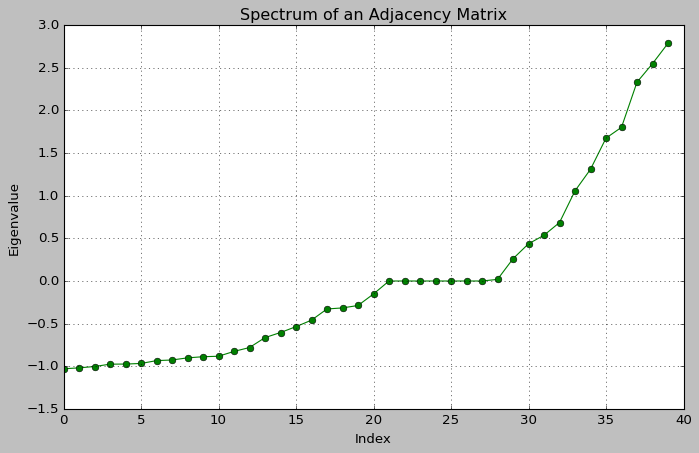

In [237]:
# Eigenvalue analysis of the adjacency matrix
eigenvalues_adjacency = np.linalg.eigvalsh(np.where(connectivity>0, connectivity, 0)) # Using 'eigvalsh' for symmetric/hermitian matrices

# Plotting the eigenvalues (spectrum) of the adjacency matrix
plt.figure(figsize=(10, 6))
plt.plot(eigenvalues_adjacency, 'o-', color='green')
plt.title('Spectrum of an Adjacency Matrix')
plt.xlabel('Index')
plt.ylabel('Eigenvalue')
plt.grid(True)
plt.show()

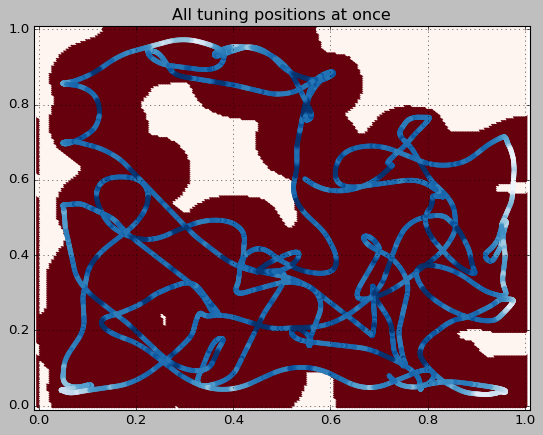

In [238]:
""" area covered by a non-zero activity """
#plt.scatter(whole_track[:, 0], whole_track[:, 1], c=record[7], s=20, cmap='Reds')
plt.scatter(whole_track[:, 0], whole_track[:, 1], c=np.where(z < 1.2, 1, 0), s=20, cmap='Reds_r',
           edgecolors='black', linewidths=0)

plt.scatter(trajectory[:, 0], trajectory[:, 1], c=zpc, s=20, cmap='Blues',
                edgecolors='black', linewidths=0, marker='o', alpha=0.5)

plt.ylim((-0.01, 1.01))
plt.xlim((-0.01, 1.01))
plt.grid()
plt.title("All tuning positions at once")
plt.show()

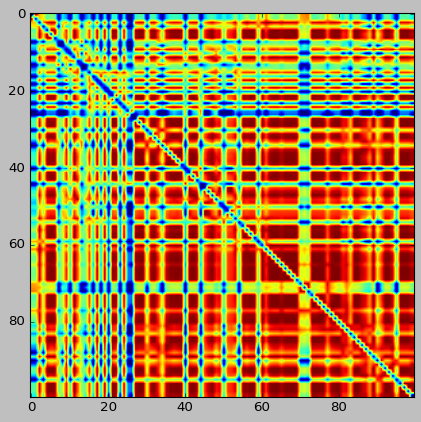

In [73]:
plt.imshow(model.W_rec, vmin=0, vmax=1);

# Compact
---

In [15]:
record_ind = load_best_individual()
genome = record_ind['genome']
pprint(record_ind)

2024-02-08 18:24:16 | Available files in /Users/daniekru/Research/lab/PCNN/cache:
2024-02-08 18:24:16 | 0: 5_best_pcnn_bpc.json
2024-02-08 18:24:16 | 1: 6_best_pcnn_bpc.json
2024-02-08 18:24:16 | 2: 3_best_pcnn_bpc.json
2024-02-08 18:24:16 | 3: 2_best_pcnn_bpc.json
2024-02-08 18:24:16 | 4: 7_best_pcnn_bpc.json
2024-02-08 18:24:16 | 5: 4_best_pcnn_bpc.json


Select a file index:  4


2024-02-08 18:24:19 | loaded `7_best_pcnn_bpc.json` from `/Users/daniekru/Research/lab/PCNN/cache`


{'genome': {'DA_tau': 79,
            'IS_magnitude': 5.0,
            'N': 5,
            'Nj': 5,
            'beta_clone': 1.1,
            'bias': 0.9,
            'bias_decay': 200,
            'bias_scale': 1.41,
            'dt': 0.5185,
            'gain': 5.2,
            'is_retuning': False,
            'low_bounds_nb': 5,
            'lr': 0.85169,
            'nb_per_cycle': 5,
            'nb_skip': 2,
            'plastic': True,
            'sigma_gamma': 7.1e-05,
            'soft_beta': 0.6,
            'speed': 0.051000000000000004,
            'tau': 8,
            'theta_freq': 0.006,
            'theta_freq_increase': 0.16,
            'wff_max': 1.5,
            'wff_min': 0.0,
            'wff_tau': 600},
 'info': {'data': {'Nbc': 16,
                   'Npc': 25,
                   'dt': 0.1,
                   'duration': 5,
                   'k_average': 300,
                   'layer': 'InputNetwork(N=41, layers=`place,border`)',
                   'prob_tu

In [ ]:
genome['wff_max'] = 3
#genome['low_bounds_nb'] = 3
genome['beta_clone'] = 0.2
genome['DA_tau'] = 3
genome['IS_magnitude'] = 10
#genome['theta_freq'] = 0.01

In [3]:
""" load """
record_ind = load_best_individual()
genome = record_ind['genome']
#pprint(record_ind)

if 1 == 0:
    genome['wff_max'] = 3
    #genome['low_bounds_nb'] = 3
    genome['beta_clone'] = 0.2
    genome['DA_tau'] = 3
    genome['IS_magnitude'] = 10
    genome['theta_freq'] = 0.001

record_ind['info']['data']
clf()

""" settings from record """
duration = record_ind['info']['data']['duration']
#dt = record_ind['info']['data']['dt']
#speed = record_ind['info']['data']['speed']
dt = genome['dt']
speed = genome['speed']
prob_turn = record_ind['info']['data']['prob_turn']
#sigma = record_ind['info']['data']['sigma']
k_average = record_ind['info']['data']['k_average']
sigma_pc = genome['sigma_pc']
sigma_bc = genome['sigma_bc']

""" Input initialization """
Nj = 6*6

#layer = it.GridLayer(N=Nj, sigma=0.01)
#layer = it.BorderLayer(N=Nj, sigma=0.02)
#layer = it.BorderLayer(N=4*4, sigma=0.02)
layer = it.InputNetwork(layers=[it.BorderLayer(N=0*4, sigma=sigma_bc), 
                                it.PlaceLayer(N=10**2, sigma=sigma_pc)])
layer2 = it.InputNetwork(layers=[it.BorderLayer(N=4*10, sigma=0.05), 
                                it.GridLayer(N=10, sigma=8, scale=np.array([1.1, 1.]))
                               ])

Nj = layer.N

""" Model initialization """
N = int(input("N: "))

genome['N'] = N
genome['Nj'] = Nj
model = mm.PCNNetwork(**genome)


""" Creation of the data """

whole_track = it.make_whole_walk(dx=0.01)

logger(f"Whole track, shape={whole_track.shape}")

trajectory = it.make_trajectory(duration=duration, dt=dt, speed=[speed, speed], 
                                  prob_turn=prob_turn, k_average=k_average)

inputs = layer.parse_trajectory(trajectory=trajectory)
whole_track_layer = layer.parse_trajectory(trajectory=whole_track)

logger(f"Trajectory shape={trajectory.shape}")

""" Plot """
# trajectory
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
ax1.plot(trajectory[:, 0], trajectory[:, 1], ',')
ax1.set_ylim((-0.01, 1.01))
ax1.set_xlim((-0.01, 1.01))
ax1.grid()
ax1.set_title(f"{duration=:.2f}s, $dt=${dt:.3f}ms, speed={speed:.2f}au/s")

layer.plot(size=400, kind='contour', sigmoid_beta=0.1, sigmoid_alpha=0.01, ax=ax2)

time.sleep(2)
clf()

""" Run """
for t, x in tqdm_enumerate(inputs):
    model.step(x=x.reshape(-1, 1))

""" test on the entire environment """
record = np.empty((N, len(whole_track)))
model.set_off()

for t, x in tqdm_enumerate(whole_track_layer):
    model.step(x=x.reshape(-1, 1))   
    record[:, t] = model.u.flatten()

logger.debug(f"max={record[0].max()}")

""" pre-process activations """
#z = np.zeros(record.shape[1])
#for i in range(model.N):
    #if i > 7: break
    #if record[i].max() > 0.99: continue
    #z += np.where(record[i] > 0., record[i], 0)

#z = z.clip(0, 0.8) 
record = np.clip(record, 0, 0.8)
z = np.where(record < 0.05, 0, record).sum(axis=0)
z = (z.max() - z)/(z.max() - z.min())

record[:, 0] = 1

""" plot each cell's preferred location over the trajectory """

ncols = model.N // 2
fig_1, axs = plt.subplots(2, ncols, figsize=(ncols*2, 4))
i = 0
for row in tqdm(axs):
    for ax in row:
        ax.plot(trajectory[:, 0], trajectory[:, 1])
        ax.scatter(whole_track[:, 0], whole_track[:, 1], c=record[i], s=100, cmap='Reds',
           edgecolors='black', linewidths=0)
        ax.axis('off')
        ax.set_ylim((-0.01, 1.01))
        ax.set_xlim((-0.01, 1.01))
        i += 1
plt.suptitle("Tuning position for each cell", fontsize=17)
plt.show()

""" plot all cells at the same time """

fig_2, (ax1, ax2) = plt.subplots(1, 2, figsize=(7*2, 6))

# --> plot activity over the trajectory
ax1.plot(trajectory[:, 0], trajectory[:, 1], ',b', markersize=5)

#plt.scatter(whole_track[:, 0], whole_track[:, 1], c=record[7], s=20, cmap='Reds')
ax1.scatter(whole_track[:, 0], whole_track[:, 1], c=z, s=20, cmap='Reds_r',
           edgecolors='black', linewidths=0)

ax1.set_ylim((-0.01, 1.01))
ax1.set_xlim((-0.01, 1.01))
ax1.grid()
ax1.set_title(f"All tuning positions at once - Inpu={layer}")
#ax1.scatter(whole_track[:, 0], whole_track[:, 1], c=whole_track_pc.sum(axis=1), cmap='Greys', edgecolors='white', alpha=0.3)

# --> plot the weight matrix
ax2.imshow(model.Wff, cmap='plasma')
score2 = mm.eval_information(model=model, trajectory=whole_track_layer)
ax2.set_title(f"Weight matrix - Fitness={np.around(score2, 2).tolist()}")
ax2.set_xlabel('j')
ax2.set_ylabel('i')

plt.show()


2024-02-23 15:15:36 | Available files in /Users/daniekru/Research/lab/PCNN/cache:
2024-02-23 15:15:36 | 0: 5_best_pcnn_bpc.json
2024-02-23 15:15:36 | 1: 8_best_pcnn_bpc.json
2024-02-23 15:15:36 | 2: 6_best_pcnn_bpc.json
2024-02-23 15:15:36 | 3: 3_best_pcnn_bpc.json
2024-02-23 15:15:36 | 4: 10_best_pcnn_bpc.json
2024-02-23 15:15:36 | 5: 2_best_pcnn_bpc.json
2024-02-23 15:15:36 | 6: 11_best_pcnn_bpc.json
2024-02-23 15:15:36 | 7: 7_best_pcnn_bpc.json
2024-02-23 15:15:36 | 8: 4_best_pcnn_bpc.json
2024-02-23 15:15:36 | 9: 9_best_pcnn_bpc.json


Select a file index:  -1


2024-02-23 15:15:44 | Invalid input. Try again. [-1 to exit]]
2024-02-23 15:15:44 | [exit]


TypeError: 'NoneType' object is not subscriptable

In [6]:
""" Info """
logger("Info:")
pprint(record_ind['info'])
pprint(genome)

2024-02-15 15:53:16 | Info:


{'data': {'Nbc': 40,
          'Npc': 100,
          'dt': 0.1,
          'duration': 5,
          'k_average': 300,
          'layer': 'InputNetwork(N=140, layers=`place,border`)',
          'prob_turn': 0.002,
          'sigma_bc': 0.001,
          'sigma_pc': 0.005,
          'speed': [0.01, 0.05]},
 'date': '15/02/2024 at 13:53',
 'evolved': ['gain',
             'lr',
             'tau',
             'wff_max',
             'wff_tau',
             'soft_beta',
             'beta_clone',
             'low_bounds_nb',
             'DA_tau',
             'bias_decay',
             'bias_scale',
             'IS_magnitude',
             'theta_freq',
             'sigma_gamma',
             'sigma_pc',
             'sigma_bc'],
 'game': 'Env(fitness_size=2, n_samples=1)',
 'model': 'PCNNetwork',
 'other': 'trained with Border+PlaceLayer; fitness: +mean I (traj), -std I '
          '(traj)'}
{'DA_tau': 0.4,
 'IS_magnitude': 14.2,
 'N': 30,
 'Nj': 140,
 'beta_clone': 1.1,
 'bias': 0.8,


In [29]:
model.Wff.sum(axis=0)

array([0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 1.54782915e+00, 1.23729088e+00, 2.53530379e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       3.26044548e-03, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 1.16027113e-03, 7.32033752e-01, 3.25861392e-02,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 4.53634007e-02,
       5.18000000e+01, 7.69899908e-01, 1.26974251e+00, 2.64949584e-01,
       0.00000000e+00, 0.00000000e+00, 3.23198366e-01, 2.83758351e+00,
       4.10660499e+01, 8.47996367e-01, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 1.92420645e-02, 1.50382968e+00, 1.73007398e-01])

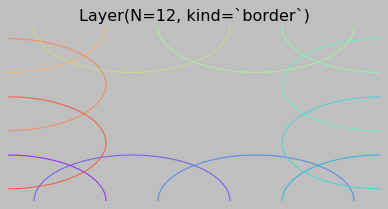

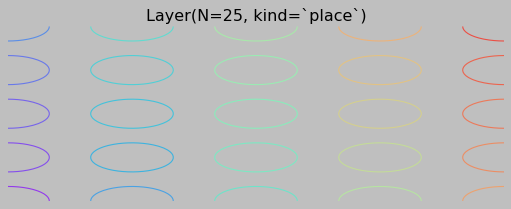

In [138]:
layer.plot()

#### Analysis I

Input shape: (10201,)
Output shape: (99, 99)


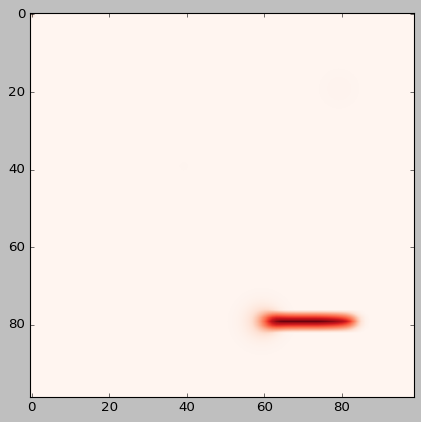

In [5]:
import numpy as np
from scipy.signal import convolve2d, correlate2d, find_peaks

# Define a kernel for convolution
kernel_size = 3  # Example size, leading to an output of shape (M, M) where M = N - kernel_size + 1
kernel = np.ones((kernel_size, kernel_size))  # Example kernel

# Apply convolution using 'valid' mode
input_array = record[0]
output_array = convolve2d(input_array.reshape(101, 101), kernel, mode='valid')

# Print the shapes to verify
print(f"Input shape: {input_array.shape}")
print(f"Output shape: {output_array.shape}")

plt.imshow(output_array, cmap="Reds");

#### analyze activation: convolution

In [9]:
def eval_modal(activation: np.ndarray) -> list:
    """ computation of the autocorrelogram and the peaks """

    # Correlate the distribution with itself
    autocorrelation = correlate2d(activation, activation, mode='full')

    # Find peaks in the autocorrelation map
    peaks_indices = find_peaks(autocorrelation[autocorrelation.shape[0]//2], 
                               height=autocorrelation.max()/3)[0]

    return peaks_indices, autocorrelation

In [12]:
a = np.random.binomial(1, 0.3, 10)
a

array([0, 0, 0, 0, 0, 1, 0, 0, 1, 1])

In [14]:
a[a>0].sum()

3

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:02<00:00,  1.23s/it]


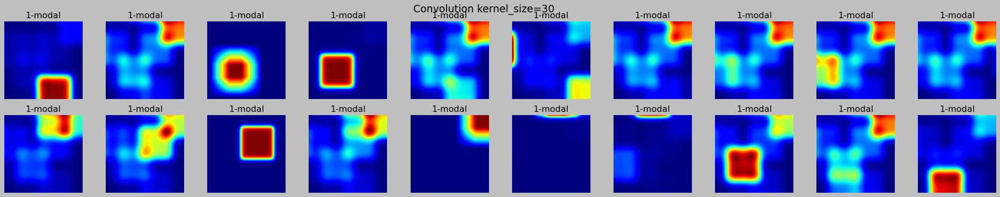

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 305.30it/s]


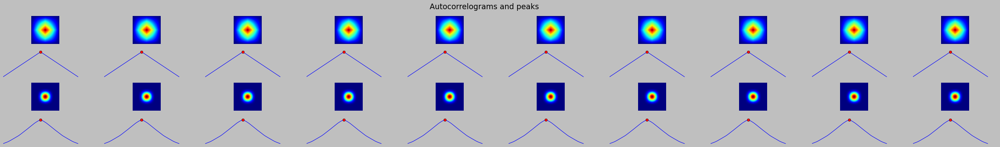

In [8]:
""" apply convolution on each cell's activation """
# define kernel
kernel_size = 30
kernel = np.ones((kernel_size, kernel_size))

s1, s2 = -1, 5
kernel2 = np.array(
    [[0, s1, 0],
     [s1, s2, s1],
     [0, s1, 0]
    ]
)
kernel_size2 = len(kernel)

# apply
record = np.empty((model.N, len(whole_track)))
model.set_off(bias=2, gain=10)
for t, x in tqdm_enumerate(whole_track_layer):
    model.step(x=x.reshape(-1, 1))   
    record[:, t] = model.u.flatten()

record_conv = np.empty((model.N, 101-kernel_size+1, 101-kernel_size+1))
for i in range(model.N):
    record_conv[i] = convolve2d(record[i].reshape(101, 101),
                                   kernel, mode='valid')

""" plot each cell's preferred location over the trajectory """

ncols = model.N // 2
_, axs = plt.subplots(2, ncols, figsize=(ncols*3, 5))
i = 0
Autocorr = []
Peaks = []
for row in tqdm(axs):
    for ax in row:
        #ax.plot(trajectory[:, 0], trajectory[:, 1])
        ax.imshow(record_conv[i])
        ax.axis('off')
        peaks, autocorr = eval_modal(activation=record_conv[i])
        Autocorr += [autocorr]
        Peaks += [peaks]
        ax.set_title(f"{len(peaks)}-modal")
        i += 1
plt.suptitle(f"Convolution {kernel_size=}", fontsize=17)
plt.show()

ncols = model.N // 2
_, axs = plt.subplots(4, ncols, figsize=(ncols*4, 5))
i = -1
for k, row in tqdm_enumerate(axs):
    i += 1
    if k % 2 == 0:
        for ax in row:
            #ax.plot(trajectory[:, 0], trajectory[:, 1])
            ax.imshow(Autocorr[i])
            #ax.scatter(whole_track[:, 0], whole_track[:, 1], c=record[i], s=100, cmap='Reds',
            #   edgecolors='black', linewidths=0)
            ax.axis('off')
            #ax.set_ylim((-0.01, 1.01))
            #ax.set_xlim((-0.01, 1.01))
        continue
        
    for ax in row:
        #ax.plot(trajectory[:, 0], trajectory[:, 1])
        ax.plot(Autocorr[i][Autocorr[i].shape[0]//2])
        ax.plot(Peaks[i], Autocorr[i][Autocorr[i].shape[0]//2][Peaks[i]], "or")

        #ax.scatter(whole_track[:, 0], whole_track[:, 1], c=record[i], s=100, cmap='Reds',
        #   edgecolors='black', linewidths=0)
        ax.axis('off')
        #ax.set_ylim((-0.01, 1.01))
        #ax.set_xlim((-0.01, 1.01))
        
plt.suptitle("Autocorrelograms and peaks", fontsize=17)
plt.show()

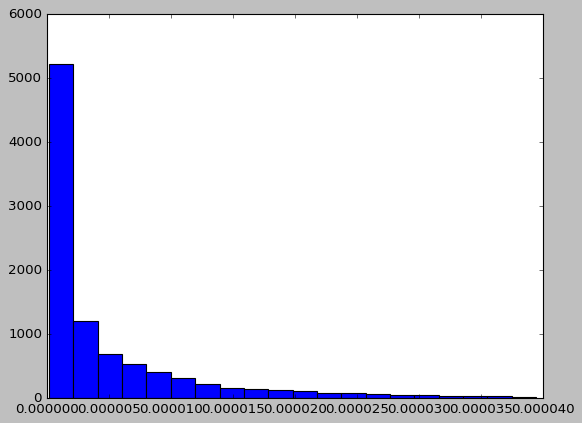

In [87]:
x = record_conv[0].flatten()
plt.hist(x, bins=20);

In [25]:
m1, m2 = mm.eval_field_modality(record[0], indices=True)

In [29]:
m2

[100]

In [23]:
record.shape

(20, 10201)

#### analyze activation plot

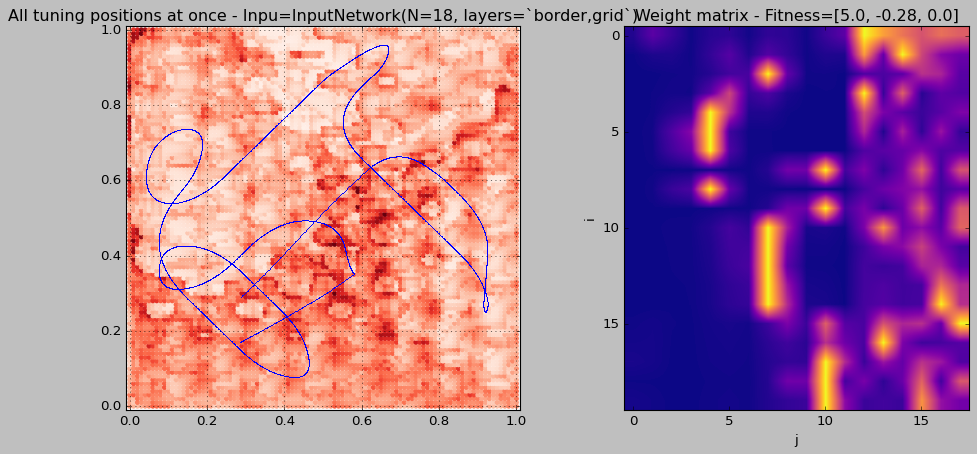

In [8]:
z = np.zeros(record.shape[1])
for i in range(model.N):
    if i > 7: break
    if record[i].max() > 0.9: continue
    z += np.where(record[i] > 0., record[i], 0)

z = np.where(record > 0.5, 0, record).sum(axis=0)
#z = z.clip(0, 0.8) 
z = (z.max() - z)/(z.max() - z.min())

""" plot all cells at the same time """

_, (ax1, ax2) = plt.subplots(1, 2, figsize=(7*2, 6))

# --> plot activity over the trajectory
ax1.plot(trajectory[:, 0], trajectory[:, 1], ',b', markersize=5)

#plt.scatter(whole_track[:, 0], whole_track[:, 1], c=record[7], s=20, cmap='Reds')
ax1.scatter(whole_track[:, 0], whole_track[:, 1], c=z, s=20, cmap='Reds_r',
           edgecolors='black', linewidths=0)

ax1.set_ylim((-0.01, 1.01))
ax1.set_xlim((-0.01, 1.01))
ax1.grid()
ax1.set_title(f"All tuning positions at once - Inpu={layer}")
#ax1.scatter(whole_track[:, 0], whole_track[:, 1], c=whole_track_pc.sum(axis=1), cmap='Greys', edgecolors='white', alpha=0.3)

# --> plot the weight matrix
ax2.imshow(model.Wff, cmap='plasma')
score2 = mm.eval_information(model=model, trajectory=whole_track_layer)
ax2.set_title(f"Weight matrix - Fitness={np.around(score2, 2).tolist()}")
ax2.set_xlabel('j')
ax2.set_ylabel('i')

plt.show()


# Analysis
---

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10201/10201 [00:00<00:00, 21970.70it/s]


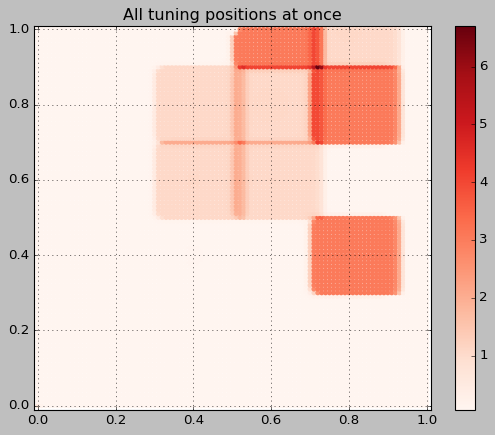

In [76]:
""" test on the entire environment """
z2 = np.empty(len(whole_track))
model._plastic = False
model._bias = 0.8
model._gain = 8
for t, x in tqdm_enumerate(whole_track_layer):
    model.step(x=x.reshape(-1, 1))   
    z2[t] = model.u.sum()

#z = z.clip(0, 0.8) 
#z2 = (z2.max() - z2)/(z2.max() - z2.min())
#plt.scatter(whole_track[:, 0], whole_track[:, 1], c=record[7], s=20, cmap='Reds')
plt.figure(figsize=(8, 6))
plt.scatter(whole_track[:, 0], whole_track[:, 1], c=z2, s=20, cmap='Reds',
           edgecolors='black', linewidths=0)

plt.ylim((-0.01, 1.01))
plt.xlim((-0.01, 1.01))
plt.grid()
plt.title("All tuning positions at once")
#ax1.scatter(whole_track[:, 0], whole_track[:, 1], c=whole_track_pc.sum(axis=1), cmap='Greys', edgecolors='white', alpha=0.3)
plt.colorbar()
plt.show()

#### Shannon information content

Distribution of the information over the space, where the network has a set of possible population vectors indexed by $1\ldots t\ldots T$

$\mathcal{I}(\mathbf{a}_{t}) = -\log_{2}(p(\mathbf{a}_{t}))$

In [77]:
def eval_information(model, trajectory):
    
    """ record the population activity for the whole track """
    AT = []
    A = np.empty(len(trajectory))
    model._plastic = False
    
    for t, x in enumerate(trajectory):
        model.step(x=x.reshape(-1, 1))   
        AT += [tuple(np.around(model.u.flatten(), 1))]
        A[t] = model.u.sum()
    
    """ assign a probability (frequency) for each unique pattern """
    AP = {}
    for a in AT:
        if a in AP.keys():
            AP[a] += 1
            continue
        AP[a] = 1
    
    for k, v in AP.items():
        AP[k] = v / AT.__len__()
    
    """ compute the information content at each point in the track """
    IT = np.empty(len(trajectory))
    for t, a in enumerate(AT):
        IT[t] = - np.log2(AP[a])

    return IT.mean(), IT.std()

eval_information(model=model, trajectory=whole_track_layer)

(2.462754921618683, 2.9950589378251498)

#### **Information** whole field

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10201/10201 [00:00<00:00, 324850.77it/s]


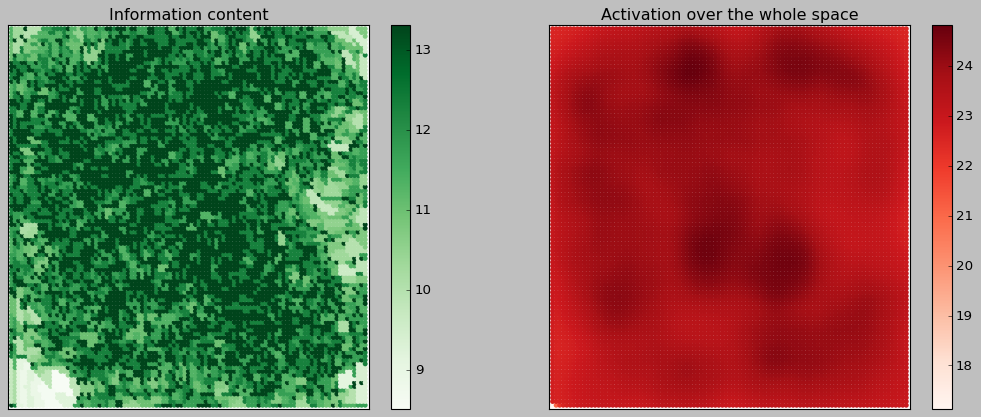

In [1004]:
""" record the population activity for the whole track """
AT = []
A = np.empty(len(whole_track_layer))
model.set_off(bias=0.8, gain=2)
#model._plastic = False
#model._bias = 0.8
#model._gain = 3

for t, x in tqdm_enumerate(whole_track_layer):
    model.step(x=x.reshape(-1, 1))   
    AT += [tuple(np.around(model.u.flatten(), 1))]
    A[t] = model.u.sum()

""" assign a probability (frequency) for each unique pattern """
AP = {}
for a in tqdm(AT):
    if a in AP.keys():
        AP[a] += 1
        continue
    AP[a] = 1

for k, v in tqdm(AP.items()):
    AP[k] = v / AT.__len__()

""" compute the information content at each point in the track """
IT = np.empty(len(whole_track_layer))
for t, a in tqdm_enumerate(AT):
    IT[t] = - np.log2(AP[a])

""" plot """
plt.figure(figsize=(16, 6))
plt.subplot(121)
plt.scatter(whole_track[:, 0], whole_track[:, 1], c=IT, s=20, cmap='Greens',
           edgecolors='black', linewidths=0)

plt.ylim((-0.01, 1.01))
plt.xlim((-0.01, 1.01))
plt.xticks(())
plt.yticks(())
plt.grid()
plt.title("Information content")
#ax1.scatter(whole_track[:, 0], whole_track[:, 1], c=whole_track_pc.sum(axis=1), cmap='Greys', edgecolors='white', alpha=0.3)
plt.colorbar()

plt.subplot(122)
plt.scatter(whole_track[:, 0], whole_track[:, 1], c=A, s=20, cmap='Reds',
           edgecolors='black', linewidths=0)

plt.ylim((-0.01, 1.01))
plt.xlim((-0.01, 1.01))
plt.xticks(())
plt.yticks(())
plt.grid()
plt.title("Activation over the whole space")
#ax1.scatter(whole_track[:, 0], whole_track[:, 1], c=whole_track_pc.sum(axis=1), cmap='Greys', edgecolors='white', alpha=0.3)
plt.colorbar()
plt.show()

#### **Information** trajectory

In [288]:
""" record the population activity for a trajectory """
AT = []
A = np.empty(len(inputs))
model.set_off()

for t, x in tqdm_enumerate(inputs):
    model.step(x=x.reshape(-1, 1))   
    AT += [tuple(np.around(model.u.flatten(), 1))]
    A[t] = model.u.sum()
A[0] = 0

""" assign a probability (frequency) for each unique pattern """
AP = {}
for a in tqdm(AT):
    if a in AP.keys():
        AP[a] += 1
        continue
    AP[a] = 1

for k, v in tqdm(AP.items()):
    AP[k] = v / AT.__len__()

""" compute the information content at each point in the trajectory """
IT = np.empty(len(inputs))
for t, a in tqdm_enumerate(AT):
    IT[t] = - np.log2(AP[a])

# set the the first entry to zero, for highlight the constrast wrt zero
IT[0] = 0

100%|████████████████████████████████████████████████████████████████████████████████████████████| 700/700 [00:00<00:00, 218958.37it/s]


In [591]:
""" record the population activity for a trajectory """
AT = []
A = np.empty(len(inputs))
model.set_off()

for t, x in tqdm_enumerate(inputs):
    model.step(x=x.reshape(-1, 1))   
    AT += [tuple(np.around(model.u.flatten(), 1))]
    A[t] = model.u.sum()
A[0] = 0

""" assign a probability (frequency) for each unique pattern """
AP = {}
for a in tqdm(AT):
    if a in AP.keys():
        AP[a] += 1
        continue
    AP[a] = 1

for k, v in tqdm(AP.items()):
    AP[k] = v / AT.__len__()

""" compute the information content at each point in the trajectory """
IT = np.empty(len(inputs))
for t, a in tqdm_enumerate(AT):
    IT[t] = - np.log2(AP[a])

# set the the first entry to zero, for highlight the constrast wrt zero
IT[0] = 0

100%|██████████████████████████████████████████████████████████████████████████████████████████| 4800/4800 [00:00<00:00, 266269.80it/s]


In [592]:
# do the same, but for the a pc layer with the same number of neurons

""" record the population activity for the whole track """
layer = it.PlaceLayer(N=int(np.sqrt(model.N))**2, sigma=0.005)
inputs = layer.parse_trajectory(trajectory=trajectory)
ATlayer = []
Alayer = np.empty(len(inputs))

for t, x in tqdm_enumerate(inputs):
    ATlayer += [tuple(np.around(x.flatten(), 1))]
    Alayer[t] = x.sum()
Alayer[0] = 0

""" assign a probability (frequency) for each unique pattern """
APlayer = {}
for a in tqdm(Alayer):
    if a in APlayer.keys():
        APlayer[a] += 1
        continue
    APlayer[a] = 1

for k, v in tqdm(APlayer.items()):
    APlayer[k] = v / ATlayer.__len__()

""" compute the information content at each point in the track """
ITlayer = np.empty(len(inputs))
for t, a in tqdm_enumerate(Alayer):
    ITlayer[t] = - np.log2(APlayer[a])

# set the the first entry to zero, for highlight the constrast wrt zero
ITlayer[0] = 0

100%|█████████████████████████████████████████████████████████████████████████████████████████| 4800/4800 [00:00<00:00, 1476542.66it/s]


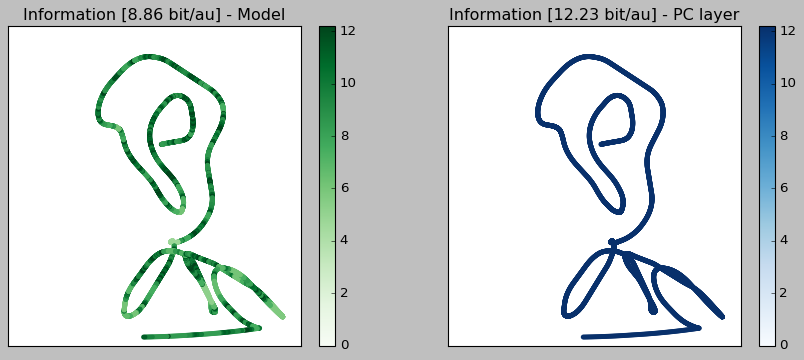

In [593]:
""" plot """
fig = plt.figure(figsize=(13, 5))
#fig.suptitle("Comparison of the model and an ideal place network", fontsize=17)

plt.tight_layout(w_pad=5)

### model
plt.subplot(121)
plt.scatter(trajectory[:, 0], trajectory[:, 1], c=IT, s=20, cmap='Greens',
           edgecolors='black', linewidths=0)
plt.ylim((-0.01, 1.01))
plt.xlim((-0.01, 1.01))
plt.xticks(())
plt.yticks(())
plt.grid()
plt.title(f"Information [{IT.mean():.2f} bit/au] - Model")
#ax1.scatter(whole_track[:, 0], whole_track[:, 1], c=whole_track_pc.sum(axis=1), cmap='Greys', edgecolors='white', alpha=0.3)
plt.colorbar()

### layer
plt.subplot(122)
plt.scatter(trajectory[:, 0], trajectory[:, 1], c=ITlayer, s=20, cmap='Blues',
           edgecolors='black', linewidths=0)
plt.ylim((-0.01, 1.01))
plt.xlim((-0.01, 1.01))
plt.xticks(())
plt.yticks(())
plt.grid()
plt.title(f"Information [{ITlayer.mean():.2f} bit/au] - PC layer")
#ax1.scatter(whole_track[:, 0], whole_track[:, 1], c=whole_track_pc.sum(axis=1), cmap='Greys', edgecolors='white', alpha=0.3)
plt.colorbar()
plt.show()

In [264]:
save_image(fig=fig, name="pcnn_plot_2", path=r"/Users/daniekru/Desktop")

2024-02-29 02:50:27 | save_image: figure saved in /Users/daniekru/Desktop


ValueError: 'c' argument has 19000 elements, which is inconsistent with 'x' and 'y' with size 4800.

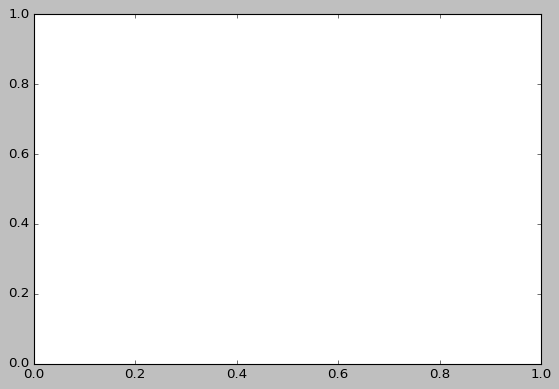

In [590]:
""" plot """
plt.figure(figsize=(18, 12))
plt.tight_layout()

### model
plt.subplot(221)
plt.scatter(trajectory[:, 0], trajectory[:, 1], c=IT, s=20, cmap='Greens',
           edgecolors='black', linewidths=0)
plt.ylim((-0.01, 1.01))
plt.xlim((-0.01, 1.01))
plt.xticks(())
plt.yticks(())
plt.grid()
plt.title(f"Information content [{IT.mean():.2f}] - Model")
#ax1.scatter(whole_track[:, 0], whole_track[:, 1], c=whole_track_pc.sum(axis=1), cmap='Greys', edgecolors='white', alpha=0.3)
plt.colorbar()

### layer
plt.subplot(222)
plt.scatter(trajectory[:, 0], trajectory[:, 1], c=ITlayer, s=20, cmap='Blues',
           edgecolors='black', linewidths=0)
plt.ylim((-0.01, 1.01))
plt.xlim((-0.01, 1.01))
plt.xticks(())
plt.yticks(())
plt.grid()
plt.title(f"Information content [{ITlayer.mean():.2f}] - Layer")
#ax1.scatter(whole_track[:, 0], whole_track[:, 1], c=whole_track_pc.sum(axis=1), cmap='Greys', edgecolors='white', alpha=0.3)
plt.colorbar()

### model
plt.subplot(223)
plt.scatter(trajectory[:, 0], trajectory[:, 1], c=np.clip(A, 0, 3), s=20, cmap='Greens',
           edgecolors='black', linewidths=0)

plt.ylim((-0.01, 1.01))
plt.xlim((-0.01, 1.01))
plt.xticks(())
plt.yticks(())
plt.grid()
plt.title("Activation - Model")
#ax1.scatter(whole_track[:, 0], whole_track[:, 1], c=whole_track_pc.sum(axis=1), cmap='Greys', edgecolors='white', alpha=0.3)
plt.colorbar()

### model
plt.subplot(224)
plt.scatter(trajectory[:, 0], trajectory[:, 1], c=Alayer, s=20, cmap='Blues',
           edgecolors='black', linewidths=0)

plt.ylim((-0.01, 1.01))
plt.xlim((-0.01, 1.01))
plt.xticks(())
plt.yticks(())
plt.grid()
plt.title("Activation - Layer")
#ax1.scatter(whole_track[:, 0], whole_track[:, 1], c=whole_track_pc.sum(axis=1), cmap='Greys', edgecolors='white', alpha=0.3)
plt.colorbar()

plt.show()

#### Recurrent connections

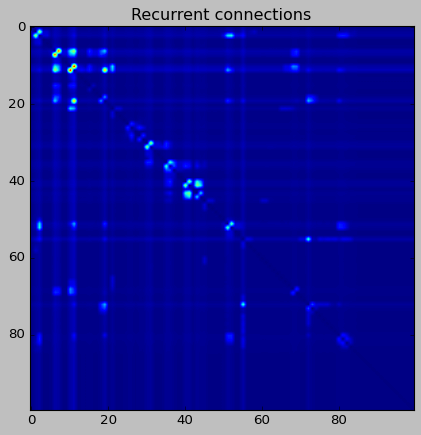

In [6]:
Wr = model.W_rec

plt.imshow(Wr)
plt.title("Recurrent connections")
plt.show()

In [20]:
from scipy.ndimage import convolve1d

In [22]:
""" apply convolution on each cell's activation """
# define kernel
kernel_size = 10
kernel = np.ones((kernel_size))


# record activations
record = np.empty((model.N, len(whole_track)))
model.set_off(bias=2, gain=10)
for t, x in tqdm_enumerate(whole_track_layer):
    model.step(x=x.reshape(-1, 1))   
    record[:, t] = model.u.flatten()

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████| 10201/10201 [00:05<00:00, 1793.42it/s]


In [57]:
record_conv1d = np.empty((model.N, len(whole_track_layer)))
centers = np.empty((model.N, 2))
for i in range(model.N):
    record_conv1d[i] = convolve1d(record[i], kernel)
    if record_conv1d[i].max() > 0.0001:
        idx = record_conv1d[i].argmax()
        centers[i] = whole_track[idx]

In [56]:
record_conv1d[i].argmax()

6909

In [125]:
""" apply convolution """
def calc_cell_tuning(model, trajectory, track, kernel, threshold):
    W = model.W_rec
    record_conv1d = np.empty((model.N, len(trajectory)))
    centers = np.empty((model.N, 2))
    zero_idxs = []
    for i in range(model.N):
        record_conv1d[i] = convolve1d(record[i], kernel)
        if record_conv1d[i].max() > 0.0001 or W[i].max() > threshold:
            idx = record_conv1d[i].argmax()
            centers[i] = track[idx]
            #centers[i, 1] = 1 - centers[i, 1]  # flip y
        else:
            zero_idxs += [i]
    return centers, record_conv1d, zero_idxs
    

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:49<00:00, 12.34s/it]


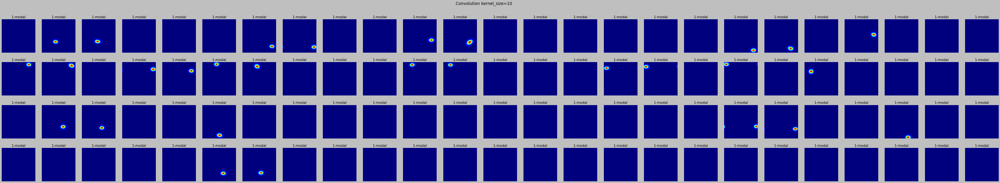

In [31]:

nrows = 4
ncols = model.N // nrows
_, axs = plt.subplots(nrows, ncols, figsize=(ncols*3, nrows*3))
i = 0
Autocorr = []
Peaks = []
record_conv = record_conv1d.reshape(-1, 101, 101)
for row in tqdm(axs):
    for ax in row:
        #ax.plot(trajectory[:, 0], trajectory[:, 1])
        ax.imshow(record_conv[i])
        ax.axis('off')
        peaks, autocorr = eval_modal(activation=record_conv[i])
        Autocorr += [autocorr]
        Peaks += [peaks]
        ax.set_title(f"{len(peaks)}-modal")
        i += 1
plt.suptitle(f"Convolution {kernel_size=}", fontsize=17)
plt.show()

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:47<00:00,  5.88s/it]


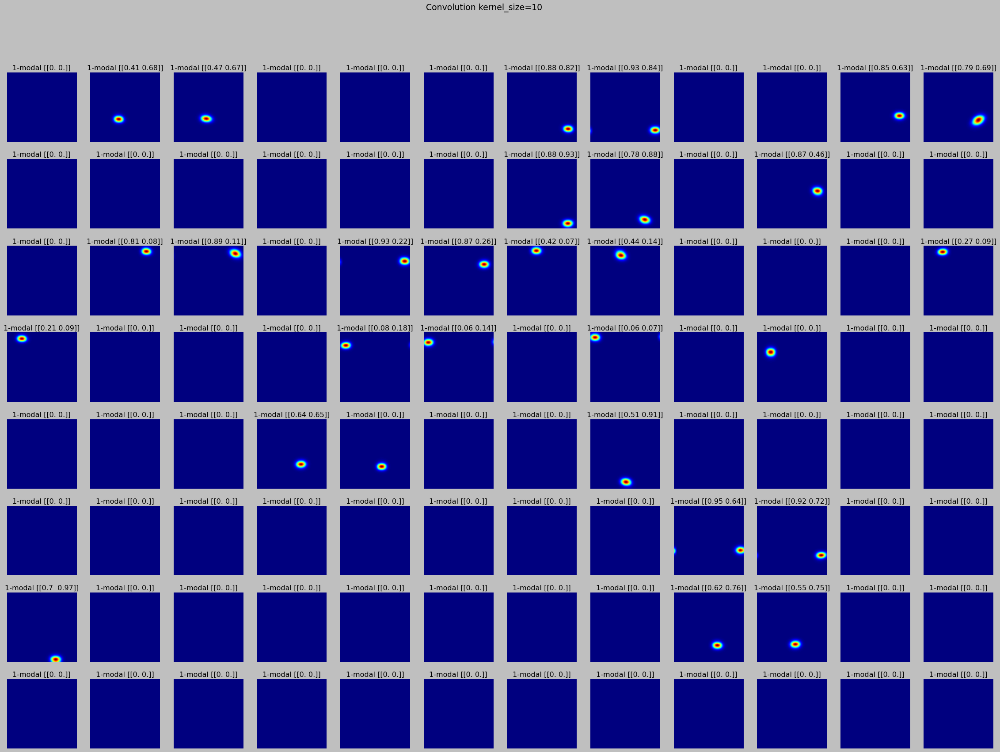

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 130.98it/s]


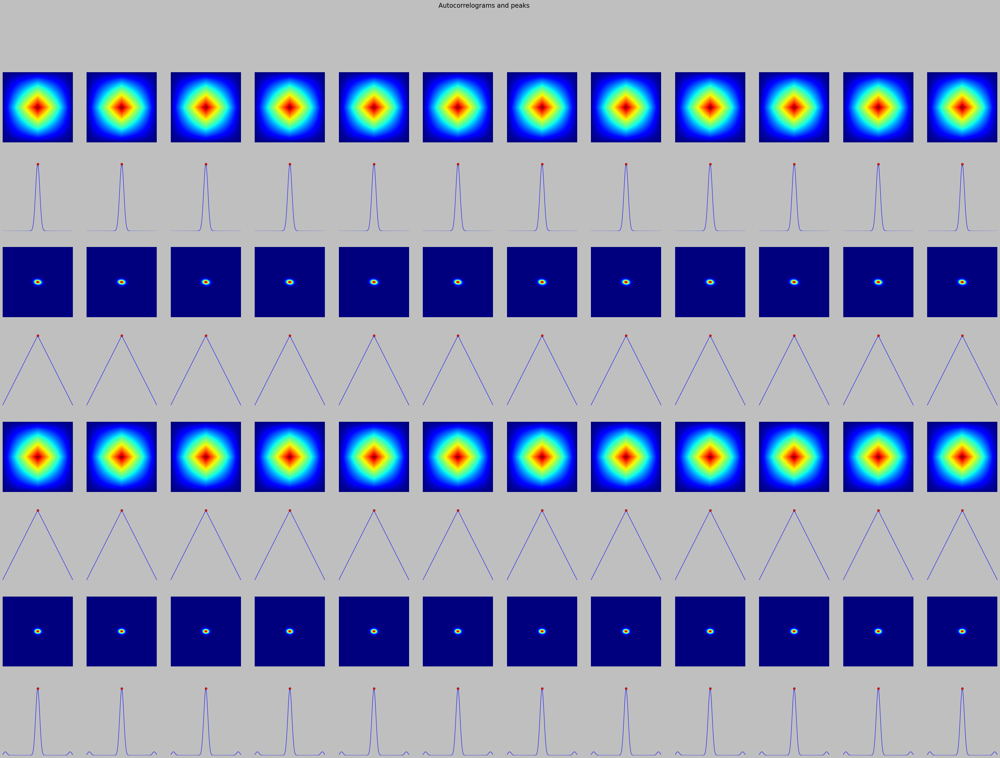

In [60]:
""" plot each cell's preferred location over the trajectory """

centers, _, _ = calc_cell_tuning(model=model, trajectory=whole_track_layer, track=whole_track, kernel=kernel)

nrows = 8
ncols = model.N // nrows
_, axs = plt.subplots(nrows, ncols, figsize=(ncols*3, nrows*3))
i = 0
Autocorr = []
Peaks = []
for row in tqdm(axs):
    for ax in row:
        #ax.plot(trajectory[:, 0], trajectory[:, 1])
        ax.imshow(record_conv[i])
        ax.axis('off')
        peaks, autocorr = eval_modal(activation=record_conv[i])
        Autocorr += [autocorr]
        Peaks += [peaks]
        ax.set_title(f"{len(peaks)}-modal [{np.around(centers[i], 2)}]")
        i += 1
plt.suptitle(f"Convolution {kernel_size=}", fontsize=17)
plt.show()

ncols = model.N // nrows
_, axs = plt.subplots(nrows, ncols, figsize=(ncols*4, nrows*4))
i = -1
for k, row in tqdm_enumerate(axs):
    i += 1
    if k % 2 == 0:
        for ax in row:
            #ax.plot(trajectory[:, 0], trajectory[:, 1])
            ax.imshow(Autocorr[i])
            #ax.scatter(whole_track[:, 0], whole_track[:, 1], c=record[i], s=100, cmap='Reds',
            #   edgecolors='black', linewidths=0)
            ax.axis('off')
            #ax.set_ylim((-0.01, 1.01))
            #ax.set_xlim((-0.01, 1.01))
        continue
        
    for ax in row:
        #ax.plot(trajectory[:, 0], trajectory[:, 1])
        ax.plot(Autocorr[i][Autocorr[i].shape[0]//2])
        ax.plot(Peaks[i], Autocorr[i][Autocorr[i].shape[0]//2][Peaks[i]], "or")

        #ax.scatter(whole_track[:, 0], whole_track[:, 1], c=record[i], s=100, cmap='Reds',
        #   edgecolors='black', linewidths=0)
        ax.axis('off')
        #ax.set_ylim((-0.01, 1.01))
        #ax.set_xlim((-0.01, 1.01))
        
plt.suptitle("Autocorrelograms and peaks", fontsize=17)
plt.show()

## Connectivity
---

In [37]:
def make_wrec2D(model, kernel, threshold=0., threshold_s=0.):
    """ make the recurrent connections """

    wff2 = model.W_final.copy()
    n = int(np.sqrt(wff2.shape[1]))
    wff = np.empty((model.N, (n-kernel.shape[0]+1)**2))

    # apply a 1D conv over each row
    for i in range(model.N):
        wff[i] = convolve2d(wff2[i].reshape(n, n), kernel, mode='valid').flatten()

    W = np.empty((model.N, model.N))
    for i in range(model.N):
        for j in range(model.N):
            W[i,j] = mm.cosine_similarity(wff[i].flatten(), 
                                          wff[j].flatten())
    W = W * (1-np.eye(model.N))
    W = np.where(W>threshold_s, W, 0)

    return W

In [38]:
def make_wrec(model, kernel, threshold=0., threshold_s=0.):
    """ make the recurrent connections """

    wff = model.W_final.copy()

    # apply a 1D conv over each row
    for i in range(model.N):
        wff[i] = convolve1d(wff[i], kernel)

    W = np.empty((model.N, model.N))
    for i in range(model.N):
        for j in range(model.N):
            W[i,j] = mm.cosine_similarity(wff[i].flatten(), 
                                          wff[j].flatten())
    W = W * (1-np.eye(model.N))
    W = np.where(W>threshold_s, W, 0)

    return W

In [15]:
def calc_cell_tuning(model, trajectory, track, kernel, threshold, threshold_s, record, kernel2=np.ones(5)):
    """ apply convolution """

    #W = model.W_rec.copy()
    #W = np.arccos(W @ W.T / np.linalg.norm(W, axis=1, keepdims=True) * np.linalg.norm(W, axis=1, keepdims=True).T)
    #W = np.where(W > threshold, W, 0)
    #W = model._softmax(x=W)
    #W = np.where(W > threshold_s, W, 0)

    # --| cosine similarity |--
    #W = np.empty((model.N, model.N))
    #for i in range(model.N):
    #    for j in range(model.N):
    #        W[i,j] = mm.cosine_similarity(model.W_final[i].flatten(), 
    #                                      model.W_final[j].flatten())
    #W = W * (1-np.eye(model.N))
    #W = np.where(W>threshold_s, W, 0)
    #W = np.flip(np.flip(W, axis=1), axis=0)

    # --| model learnt recurrent weights |--
    #W = model.W_rec.copy()

    # --| conv1D + cosine similarity |--
    #W = make_wrec(model=model, kernel=kernel2, threshold=threshold, threshold_s=threshold_s)
    #W = make_wrec2D(model=model, kernel=kernel2, threshold=threshold, threshold_s=threshold_s)
    
    
    record_conv1d = np.empty((model.N, len(trajectory)))
    centers = np.empty((model.N, 2))
    zero_idxs = []
    for i in range(model.N):
        record_conv1d[i] = convolve1d(record[i], kernel)
        if record_conv1d[i].max() > threshold:
            idx = record_conv1d[i].argmax()
            if track[idx, 0] == 0. or track[idx, 1] == 0.:  # exclude the origin
                zero_idxs += [i]
                continue
            centers[i] = track[idx]
            #centers[i, 1] = 1 - centers[i, 1]  # flip y
        else:
            zero_idxs += [i]

    #W = np.delete(W, zero_idxs, axis=0)
    #centers = np.delete(centers, zero_idxs, axis=0)
    
    return centers, record_conv1d
    

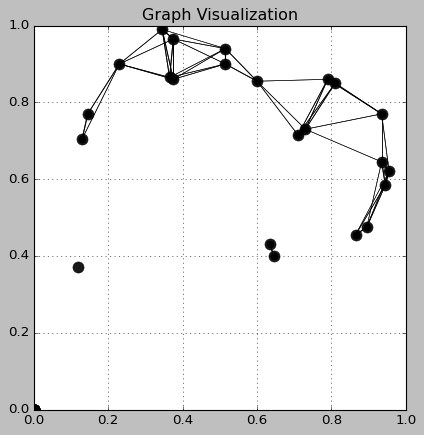

In [16]:
def plot_centers(model, trajectory, track, kernel, threshold, record, threshold_s=0., ax=None, kernel2=None, plot=True, alpha=0.9):

    # make centers
    positions, _ = calc_cell_tuning(model=model, trajectory=trajectory, track=track, kernel=kernel, 
                                                  threshold=threshold, threshold_s=threshold_s, record=record, kernel2=kernel2)

    #connectivity = mm.make_wrec2D(weights=model.W_final, kernel=kernel2, threshold=threshold_s)
    #model.W_rec = mm.make_wrec2D(weights=model.W_final, kernel=kernel2, threshold=threshold_s)

    #Wr = np.where(model.W_rec > threshold, 1, 0)
    model._update_recurrent(kernel=np.ones((4, 4)), threshold=threshold_s)
    connectivity = model.W_rec.copy()
    #connectivity = model.get_wrec()
    #connectivity = np.delete(model.W_rec, zero_idxs, axis=0)
    #positions = np.delete(positions, zero_idxs, axis=0)
    #connectivity = np.where(model.W_rec > threshold, 1, 0)

    # Plotting
    if ax is None:
        _, ax = plt.subplots(figsize=(6, 6))

    islabel = False
    for i in range(len(positions)):
        for j in range(len(positions)):
            if connectivity[i, j] != 0:  # If nodes i and j are connected
                if not islabel:
                    ax.plot([positions[i][0], positions[j][0]], 
                        [positions[i][1], positions[j][1]], 'ko-', 
                        alpha=alpha, linewidth=1*connectivity[i,j], label="recurrent")  # Draw edge
                    islabel=True
                    continue
                ax.plot([positions[i][0], positions[j][0]], 
                        [positions[i][1], positions[j][1]], 'ko-', 
                        alpha=alpha, linewidth=1*connectivity[i,j])  # Draw edge

    if not plot:
        return positions, connectivity        
    
    # Plot nodes on top of the edges to make them more visible
    for position in positions:
        ax.plot(position[0], position[1], marker='o', color='black', markersize=10, alpha=alpha)  # 'bo' makes the markers blue circles
    
    
    ax.set_title('Graph Visualization')
    ax.grid(True)
    ax.set_xlim((0, 1))
    ax.set_ylim((0, 1))
    if ax is None:
        plt.show()

    return positions, connectivity

c = plot_centers(model=model, trajectory=whole_track_layer, track=whole_track, kernel=np.ones((10)), 
                 threshold=0., threshold_s=0.5, ax=None, record=record, kernel2=np.ones((4, 4)), plot=True)

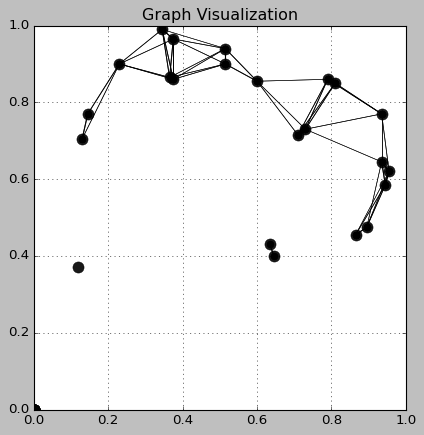

In [24]:
c = vis.plot_centers(model=model, trajectory=whole_track_layer, track=whole_track, kernel=np.ones((10)), 
                 threshold=0.1, threshold_s=0.5, ax=None, record=record, kernel2=np.ones((4, 4)), plot=True)


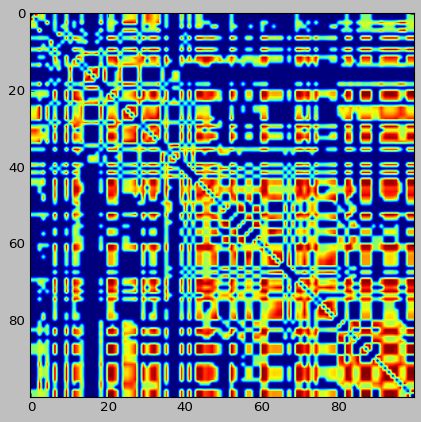

In [16]:
plt.imshow(c[1], vmin=0, vmax=1);

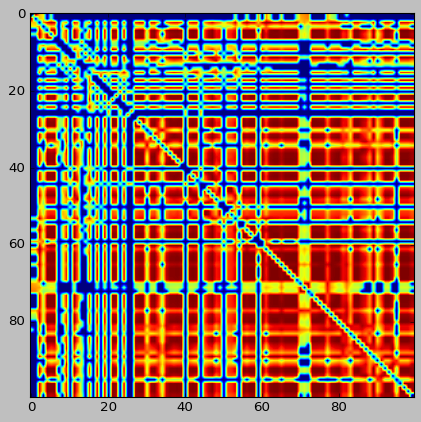

In [123]:
plt.imshow(c[1], vmin=0, vmax=1);

## Make dataset
---

1) train model
2) run the model on different simple trajectories, and record the population vectors
3) make a dataset where each data point is composed by:
   - connectivity matrix
   - initial population vector
   - final population vector
   - target list of intermediary population vectors

In [42]:
""" settings """
duration = 2
speed = genome['speed']
dt = genome['dt']
layer = it.PlaceLayer(N=13**2, sigma=0.0075)

K = 100
dataset = {}
model.set_off()

for k in tqdm(range(K)):
    
    # make trajectory
    #trajectory = it.make_trajectory(duration=duration, dt=dt, speed=[speed, speed], 
    #                                prob_turn=0.0001, k_average=200)[200:]
    trajectory = make_line(bounds=(0.2, 0.8)).T
    inputs = layer.parse_trajectory(trajectory=trajectory, disable_tqdm=True)

    #clf()
    #plt.plot(trajectory[:, 0], trajectory[:, 1])
    #plt.pause(0.001)
    #if str(input()) not in ('y', 'yes', '1'): continue
        
    # run model
    activations = np.empty((inputs.shape[0], model.N))
    for t, x in enumerate(inputs):
        model.step(x=x.reshape(-1, 1))
        activations[t] = model.u.flatten()

    # connectivity
    _, _, wrec = calc_cell_tuning(model=model, trajectory=whole_track_layer, track=whole_track, kernel=np.ones((10)), 
                 threshold=0., threshold_s=0.2, record=record, kernel2=np.ones((3, 3)))

    dataset[k] = {
        'trajectory': trajectory.tolist(),
        'connectivity': np.where(wrec > 0., 1, 0).tolist(),
        'start': activations[0].tolist(),
        'end': activations[1].tolist(),
        'activations': activations[1:].tolist()
    }

dataset['seq_len'] = len(activations)-1

logger()

100%|████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:18<00:00,  5.46it/s]
2024-02-28 05:33:23 | 


In [1044]:
m = 0

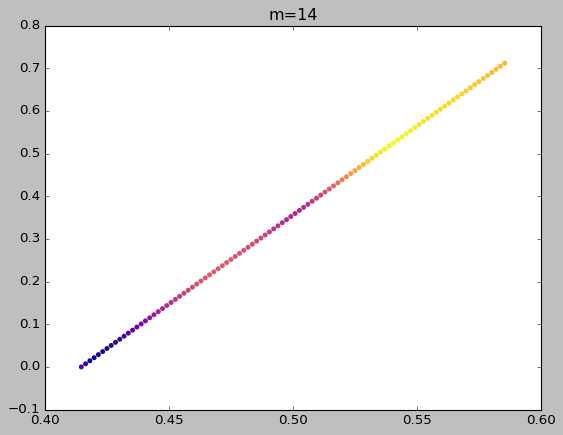

In [1059]:
### plt.plot(trajectory[:, 1], trajectory[:, 0]);
trajectory = np.array(dataset[m]['trajectory'])
plt.scatter(trajectory[:, 0], trajectory[:, 1], c=activations.mean(axis=1), cmap='plasma', s=20, edgecolors='black', linewidths=0)
plt.title(f"{m=}");
m += 1

In [43]:
""" save dataset """

if int(input("enter `123`")) == 123:
    with open(os.path.join(r"cache", "dataset_1.json"), 'w') as f:
        json.dump(dataset, f)
    logger("[saved]")
else:
    logger.warning("[abort]")


enter `123` 123


2024-02-28 05:33:31 | [saved]


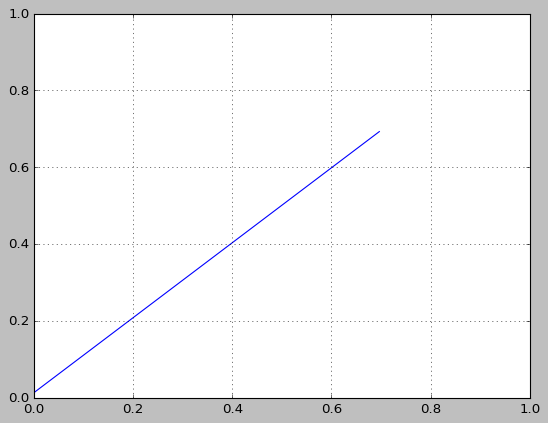

In [27]:
def make_line(m=None, theta=None, N=100, bounds=(0,1)):

    m = np.random.uniform(-1, 1) if m is None else m
    theta = np.random.uniform(0, np.pi) if theta is None else theta
    
    # Create the line
    x = np.linspace(bounds[0], bounds[1], N)
    y = m * x

    # Rotation matrix
    cos_theta, sin_theta = np.cos(theta), np.sin(theta)
    rotation_matrix = np.array([[cos_theta, -sin_theta], [sin_theta, cos_theta]])
    
    # Apply rotation to each point
    xy = np.vstack([x, y])  # Shape (2, 100)
    xy_rotated = np.dot(rotation_matrix, xy)

    # Step 1: Calculate the midpoint of the original line
    midpoint_x = (x[0] + x[-1]) / 2
    midpoint_y = (y[0] + y[-1]) / 2
    
    # Step 2: Translate the line so that the midpoint is at the origin
    x_translated = x - midpoint_x
    y_translated = y - midpoint_y
    
    # Apply the rotation to the translated line
    xy_translated = np.vstack([x_translated, y_translated])  # Shape (2, 100)
    xy_rotated_midpoint = np.dot(rotation_matrix, xy_translated)
    
    # Step 4: Translate back
    x, y = xy_rotated_midpoint[0, :] + midpoint_x, xy_rotated_midpoint[1, :] + midpoint_y

    # resize
    #print(x)
    x = x + abs(min((0, x.min())))
    y = y + abs(min((0, y.min())))
 
    return np.stack((x, y))

x = make_line()
plt.plot(x[:, 0], x[:, 1])
plt.xlim((0,1))
plt.ylim((0, 1))
plt.grid();

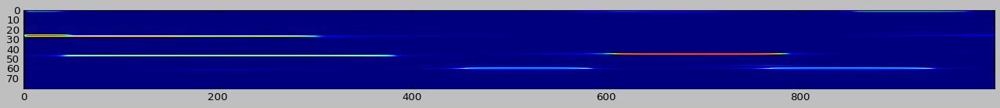

In [631]:
plt.figure(figsize=(20, 3))
plt.imshow(activations[:1000].T);

In [722]:
np.stack((np.random.randn(5), np.random.randn(5)))

array([[ 0.17981924, -0.9973131 ,  1.20368273, -0.82169718, -0.25774075],
       [ 0.24568696,  0.11073035,  0.65868261,  0.34266998, -0.3543337 ]])